#1.Problem statement
We have received a data set of a XYZ incident management system where the incidents are raised by
the users in form of tickets which can be further assigned to appropriate group for resolution based
on the ticket description, short description etc.
The objective of the project is to build a classifier that can classify the tickets to right group by
analyzing the text. We will concentrate on the below objectives also for building a good classifier.

• EDA and visualizations are to be done for understanding the importance of each column and
to have proper conclusion on the data set.

• The data has to be checked for inconsistencies if any then tackle those in an efficient way.

• Different natural language processing, preprocessing techniques are tried using maximum of features.

• Different feature extraction techniques and comparison of models.

• How to use different classification models have to be explored.

• How to use transfer learning to use pre-built models have to be explored.

• Learn to set the optimizers, loss functions, epochs, learning rate, batch size, checkpointing,
early stopping etc.

• Model Deployment





#2.Solution:

###2.1.Common Library and functions and installation:

  
2.1.1.Mount Drive

  2.1.2.Installation

  2.1.3.Import all libraries 

  2.1.4.Write all common functions


###2.2.Explore the input data provided through excel:

  2.2.1.EDA included shape,description,info,Print Top 5 rows

###2.3.Missing points in data:

  2.3.1.Find all the missing values and display them.



###2.4.Visualizing different patterns:

2.4.1.Assignment group target column exploration and visualization with top 10 groups,Unique groups,Total group counts,Word cloud visualizations for assignment group.

2.4.2.Caller column  exploration with plot for multiple groups for top 10 caller

2.4.3.Max word and min word and plot of word distribution for description and short description column


###2.5.Dealing with missing values:

2.5.1.We will create a combine column and there we will conatinate two groups as NAN + string is NAN so we will use THE at place of NAN values which will be removed later with stop word removal

###2.6.Finding inconsistencies in the data:
2.6.1.We will try lang detect and polyglot library and will see language accuracy.


2.6.2.We will divide the dataset to two part one with having rows with english language and one with non english languages.


2.6.3.Then we will apply Google translation on non english rows and merge the non english part with english part and create final feature column 

2.6.4.We will check language accuracy after translation

2.6.5. Observations




###2.7.Visualizing different text features:

2.7.1.And visualize final feature column in word cloud with and without stop words

2.7.2.And also calculate top 50 frequent word

2.7.3.Observations


###2.8.Text preprocessing:

2.8.1.We will do preprocessing and removed digit special character url mailID Extra spaces accented chars newlines HTML and also expand contractions and lemmatization will also be applied.We have created a single function inside it.


2.8.2.Observations

###2.9.Creating tokens as required

2.9.1We will tokenize the final feature and remove stop word and have final tokenized feature for embedding.


###2.10.Pickle data set






##2.1.Common Library and functions and installation:



###2.1.1.Mount Drive

In [85]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [86]:
EMBEDDING_FILE = '/content/drive/My Drive/glove.6B.100d.txt'

###2.1.2.Installation


In [87]:
pip install plotly

In [88]:
# Install spaCy (run in terminal/prompt)
import sys
!{sys.executable} -m pip install spacy

# Download spaCy's  'en' Model
!{sys.executable} -m spacy download en

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [89]:
pip install beautifulsoup4

In [90]:
pip install langdetect

In [91]:
pip install -U pycld2

Requirement already up-to-date: pycld2 in /usr/local/lib/python3.6/dist-packages (0.41)


In [92]:
pip install polyglot

In [93]:
# install googletrans using pip
!pip install googletrans



In [94]:
pip install contractions

In [95]:
pip install Unidecode

In [96]:
pip install pyicu

In [97]:
pip install nltk


In [98]:
import nltk

nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [99]:
pip install collections-extended

###2.1.3.Import all libraries 

In [100]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import seaborn as sns

import matplotlib.pyplot as plt

In [101]:
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [102]:
from keras.models import Model
from keras.layers import LSTM, Activation, Dense, Dropout, Input, Embedding
from keras.optimizers import RMSprop
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping

In [103]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential

In [104]:
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2
import numpy as np

In [105]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,recall_score,confusion_matrix
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import ClassificationReport

In [106]:
import spacy
#from spacy_cld import LanguageDetector


import langdetect
#import langid

import icu
from polyglot.detect import Detector
# import the library
import googletrans
from googletrans import Translator
import re
import contractions
import unidecode

In [107]:
import pandas as pd
import plotly
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.io as pio
pio.renderers.default = 'colab'
from plotly.offline import init_notebook_mode, iplot
from collections import Counter
from wordcloud import WordCloud, STOPWORDS 


In [108]:
from langdetect import detect

###2.1.4.Write all common functions

Some Common functions in word cloud

In [109]:
def wordcloud_plot(text):
  wordcloud_spam = WordCloud(width = 800, height = 800, 
                      background_color ='white', 
                      min_font_size = 10).generate(" ".join(w for w in text))

  # Lines 2 - 5
  plt.figure(figsize = (8,8))
  plt.imshow(wordcloud_spam, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [110]:
def wordcloud_group(text):
  #wordcloud_spam = WordCloud(width = 800, height = 800, 
                      #background_color ='white', 
                      #min_font_size = 10).generate(" ".join(w for w in text))
  wordcloud = WordCloud(collocations=False).generate(" ".join(w for w in text))
  # Lines 2 - 5
  plt.figure(figsize = (8,8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [111]:
def wordcloud_plot_stop(text):

  wordcloud_withstop = WordCloud(stopwords=STOPWORDS,width = 800, height = 800, 
                      background_color ='white', 
                      min_font_size = 10).generate(" ".join(w for w in text))

  # Lines 2 - 5
  plt.figure(figsize = (8,8))
  plt.imshow(wordcloud_withstop, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Some common functions for language detection

In [112]:
def get_language(text):
    return Detector(''.join(x for x in text if x.isprintable()), quiet=True).languages[0].name


In [113]:
    
def fn_lan_detect(df):                                        
   try:                                                          
        return detect(df)            
   except:                                   
        return 'no'                                                  


Some common functions for Text preprocessing

In [114]:
def cleantext_lower(text): 
    return text.lower() 

In [115]:
def cleantext_remove_punctuation(text): 
    result = re.sub(r'[^\w\s]',' ',text) 
    return result

In [116]:
def cleantext_remove_url(text):
  result=re.sub(r"http\S+", "", text)
  return result

In [117]:
def cleantext_removeHTML(text):
    from bs4 import BeautifulSoup
    soup = BeautifulSoup(text, "html.parser")
    clean_Text = soup.get_text()
    return clean_Text

In [118]:
def removeAccentedChars(text):
    cleanText = unidecode.unidecode(text)
    return cleanText

In [119]:
def expandContractions(text):
    
    return contractions.fix(text)

In [120]:
def cleantext_removeSpecialChars(text, remove_digits=False):
    pattern = r'[^a-zA-z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, ' ', text)
    cleanText = re.sub(r"[^a-zA-Z0-9]+", ' ', text)
    return text

In [121]:
def removeDuplicates(text):
    text = text.split(" ")
    for i in range(0, len(text)):
        text[i] = "".join(text[i])
        dupli = Counter(text)
        cleanText = " ".join(dupli.keys())
    return cleanText

In [122]:
def correct_spelling(x, dic):
    for word in dic.keys():
        x = x.replace(word, dic[word])
    return x

In [123]:
nlp = spacy.load('en', disable=['parser', 'ner'])
def cleantext_textLemmatize(text):
    text = nlp(text)
    text = ' '.join([word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in text])
    return text
#Used spacy as wordnet was giving some error

Commom function on ML model accuracy

In [124]:
def predict_ml_model(sclf,X_train_count,y_train_count,X_test_count,y_test_count):
  sclf.fit(X_train_count, y_train_count)
  y_pred = sclf.predict(X_test_count)

  print('accuracy %s' % accuracy_score(y_pred, y_test_count))
  print('Training score:',sclf.score(X_train_count, y_train_count)*100)
  TrainAcc=sclf.score(X_train_count, y_train_count)*100
  TestAcc=sclf.score(X_test_count,y_test_count)*100
  Accq=accuracy_score(y_pred, y_test_count)
  prec=precision_score(y_pred, y_test_count,average='weighted')*100
  rec=recall_score(y_pred, y_test_count,average='weighted')*100
  f1s=f1_score(y_pred, y_test_count,average='weighted')*100
  print('Testing score:',sclf.score(X_test_count,y_test_count)*100)
  #print(classification_report(y_test_count, y_pred))
  data = [TrainAcc, TestAcc, prec, rec,f1s]
  return data

##2.2.Explore the input data provided through excel:

###2.2.1.EDA included shape,description,info,Print Top 5 rows

In [125]:
df = pd.read_excel (r'/content/drive/My Drive/Project/input_data (2).xlsx')
df.head(5)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [126]:
#Shape of the data  
df.shape

(8500, 4)

In [127]:
#Name of columns
df.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [128]:
#Data type of each attribute
df.info()
#There are total 9 null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [129]:
#5 point summary
df.describe(include="all")

,Short description,Description,Caller,Assignment group
count,8492,8499,8500,8500
unique,7481,7817,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


###2.2.2.Observations:
We have explored the data set and found the below points:


1.It has 8500 rows and 4 columns.

2.Short Description and Description and caller are independent columns and Group is the depenent variable which we need to predict.It is a classification problem where we have to predict the group column value with respect to other independent variable.


3.First we have obsered Short description and description and what we found is there are many tickets where only short description is not sufficient to take it as main feature.There are many tickets for which both the short description and description are same.Different variations are there.

4.Next we observed that there are many rows where description/short description is written in other languages which is not english.


5.We have observed the dependent variables where we found that it is very unbalanced later we plot the distribution too which shows it has high imbalance.


6.There are some repeatative rows having same information in all the columns.



##2.3.Missing points in data:

In [130]:
#Checking the presence of missing values
df.isnull().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

###2.3.1.Find all the missing values and display them.

In [131]:
df.loc[df["Description"].isnull()]

,Short description,Description,Caller,Assignment group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [132]:
df.loc[df["Short description"].isnull()]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


###2.3.2.Observations
We have found out 9 missing values .1 in description and 8 in short description.The rows are printed.

##2.4.Visualizing different patterns:

###2.4.1.Assignment group target column exploration and visualization with top 10 groups,Unique groups,Total group counts,Word cloud visualizations for assignment group

In [133]:
#Count the number of values:
df['Assignment group'].value_counts()

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
GRP_2      241
GRP_19     215
GRP_3      200
GRP_6      184
GRP_13     145
GRP_10     140
GRP_5      129
GRP_14     118
GRP_25     116
GRP_33     107
GRP_4      100
GRP_29      97
GRP_18      88
GRP_16      85
GRP_17      81
GRP_31      69
GRP_7       68
GRP_34      62
GRP_26      56
GRP_40      45
GRP_28      44
GRP_41      40
GRP_30      39
GRP_15      39
GRP_42      37
GRP_20      36
GRP_45      35
GRP_1       31
GRP_22      31
GRP_11      30
GRP_21      29
GRP_47      27
GRP_48      25
GRP_23      25
GRP_62      25
GRP_60      20
GRP_39      19
GRP_27      18
GRP_37      16
GRP_44      15
GRP_36      15
GRP_50      14
GRP_65      11
GRP_53      11
GRP_52       9
GRP_55       8
GRP_51       8
GRP_46       6
GRP_59       6
GRP_49       6
GRP_43       5
GRP_66       4
GRP_32       4
GRP_68       3
GRP_38       3
GRP_63       3
GRP_56       3
GRP_58       3
GRP_71       2
GRP_57       2
GRP_72       2
GRP_69    

In [134]:
#Group 0 has highest number of tickets

Plot the group in sorted order

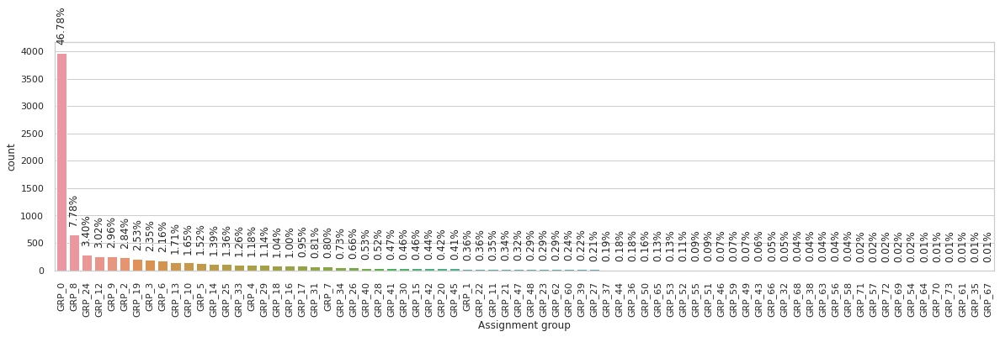

In [135]:
from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=df, order=df["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(df.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

Top 10 groups visualization


Text(0.5, 1.0, 'Top 10 frequent groups')

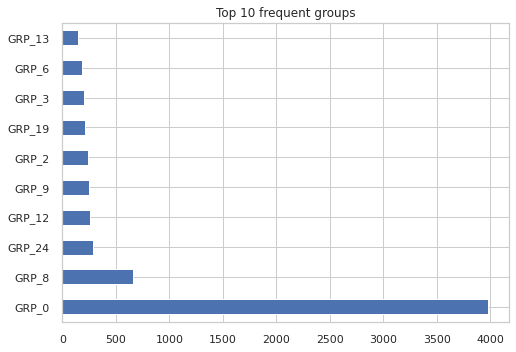

In [136]:
df['Assignment group'].value_counts()[:10].plot(kind='barh')
plt.title("Top 10 frequent groups")

Top 50 and bottom 50 groups visualization

In [137]:
df_top_50= df['Assignment group'].value_counts().nlargest(50).reset_index()

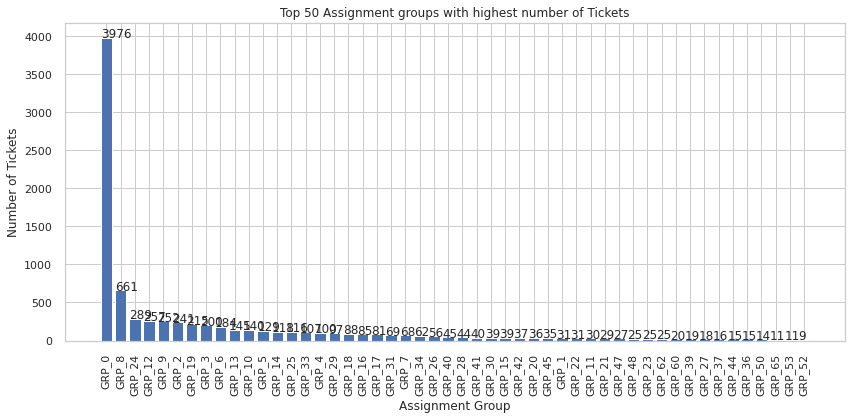

In [138]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_top_50['index'],df_top_50['Assignment group'])
plt.title('Top 50 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [139]:
df_bottom_50 = df['Assignment group'].value_counts().nsmallest(50).reset_index()

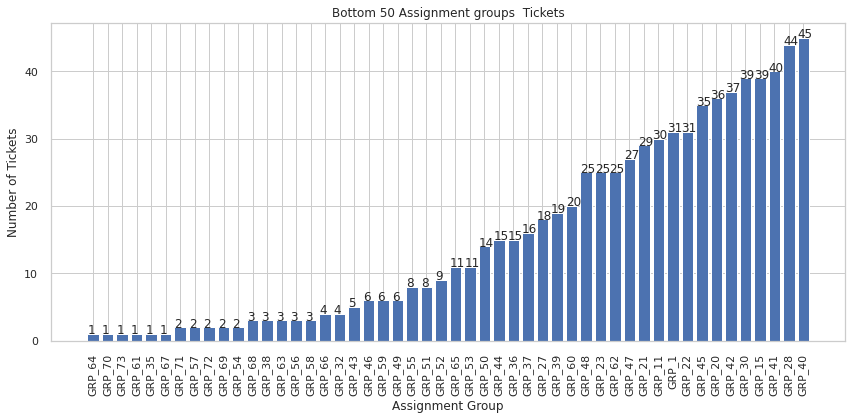

In [140]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_50['index'],df_bottom_50['Assignment group'])
plt.title('Bottom 50 Assignment groups  Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()


Word Cloud plotting

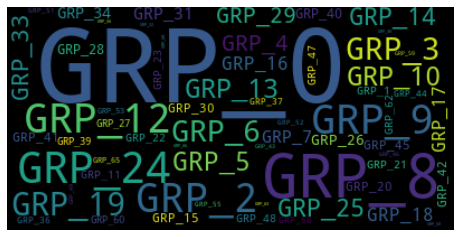

In [141]:
wordcloud_group(df["Assignment group"])

###The visualization shows  it has high imbalance and group 0 is most frequent group

##2.4.2.Caller column  exploration with plot for multiple groups for top 10 caller

Print Frequency of Top 10  callers

In [142]:
newcallerdf=df['Caller'].value_counts()[:10]
Callerdata = df['Caller'].value_counts().rename_axis('groupname').reset_index(name='counts')[:10]
print (Callerdata)
import matplotlib.pyplot as plt

           groupname  counts
0  bpctwhsn kzqsbmtp     810
1  ZkBogxib QsEJzdZO     151
2  fumkcsji sarmtlhy     134
3  rbozivdq gmlhrtvp      87
4  rkupnshb gsmzfojw      71
5  jloygrwh acvztedi      64
6  spxqmiry zpwgoqju      63
7  oldrctiu bxurpsyi      57
8  olckhmvx pcqobjnd      54
9  dkmcfreg anwmfvlg      51


Plot Top 10 caller

Text(0.5, 1.0, 'Caller Group Distribution')

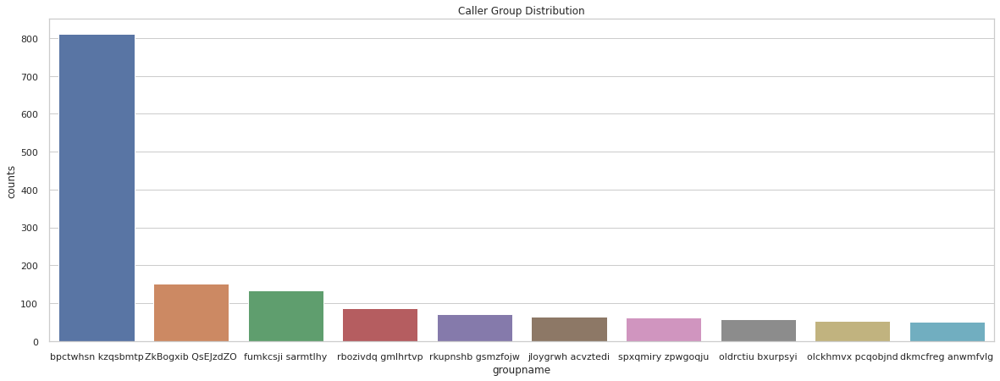

In [143]:

fig = plt.figure(figsize =(20, 7)) 
sns.barplot(x="groupname", y="counts", data=Callerdata)
plt.title("Caller Group Distribution")

Plot top 10 caller pie chart distribution with group to see most frequent group for top callers

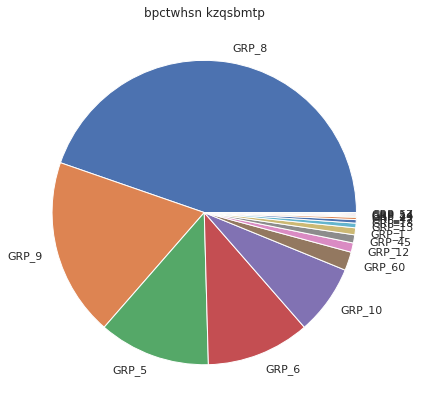

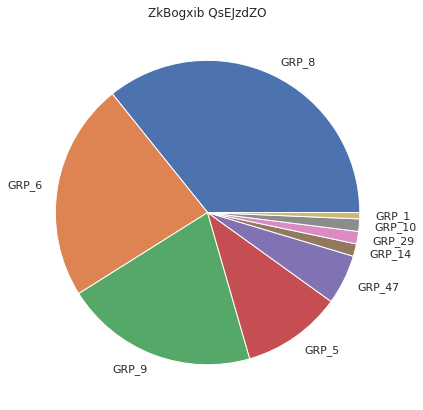

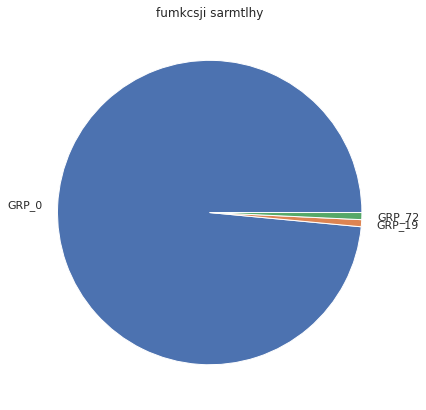

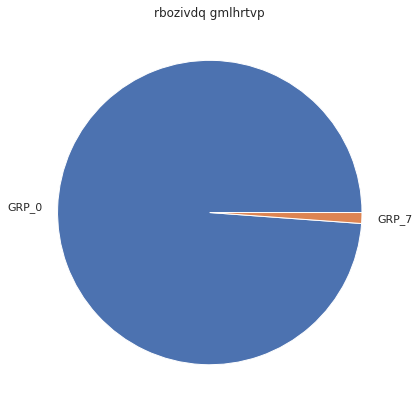

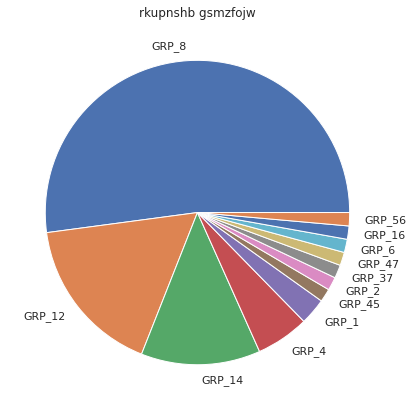

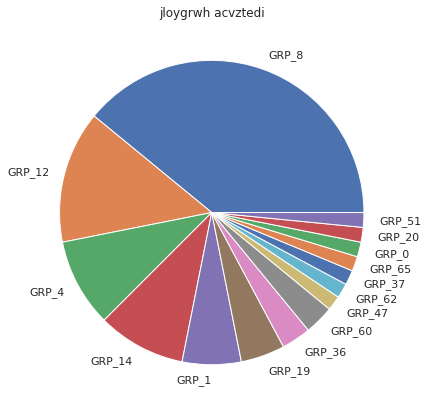

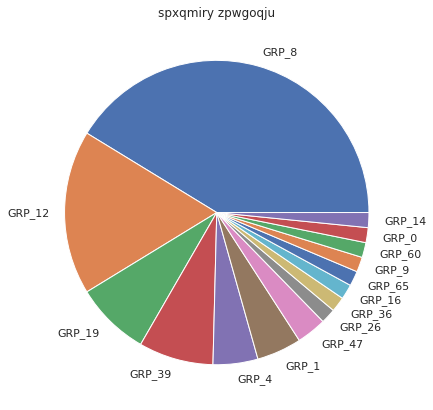

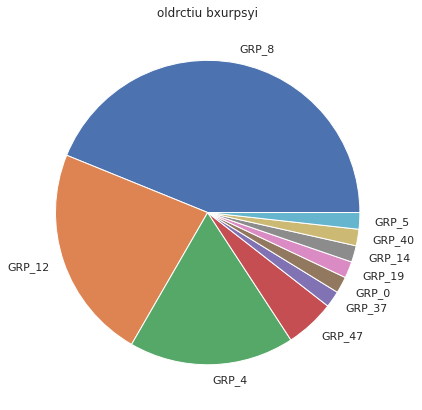

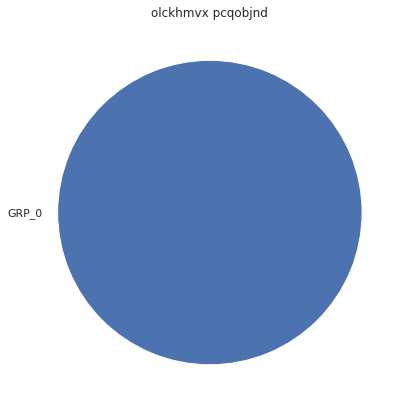

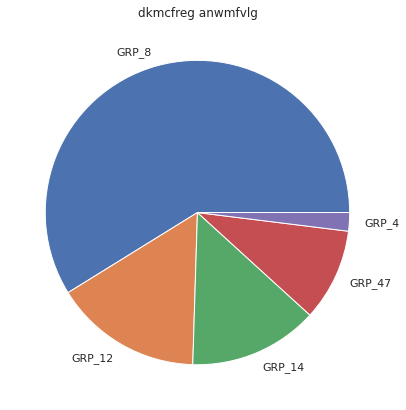

In [144]:
for x in Callerdata.groupname:
  callerdf=df.loc[df['Caller'] == x]
  grpdata = callerdf['Assignment group'].value_counts().rename_axis('groupnam').reset_index(name='counts')
  fig = plt.figure(figsize =(10, 7)) 
  plt.pie(grpdata['counts'], labels = grpdata['groupnam']) 
  plt.title(x)
  
  plt.show()

Observation:Here we can see that  group 8 has maximum no of callers

##2.4.3.Max word and min word and plot of word distribution for description and short description column

In [145]:
df_word_char=df.copy(deep=False)
df_word_char['word_count'] = df_word_char['Description'].apply(lambda x: len(str(x).split(" ")))
df_word_char[['Description','word_count']].head()


,Description,word_count
0,-verified user details.(employee# & manager na...,29
1,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,23
2,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,9
3,unable to access hr_tool page,5
4,skype error,3


In [146]:
print(df_word_char['word_count'].max())
print(df_word_char['word_count'].min())


1417
1


In [147]:
df_word_char['word_count'].iplot(
    kind='hist',
    xTitle='word_count',
    linecolor='black',
    yTitle='count',
    title='Word Description Distribution')

In [148]:
df_word_char['word_countshort'] = df_word_char['Short description'].apply(lambda x: len(str(x).split(" ")))
df_word_char[['Short description','word_countshort']].head()

,Short description,word_countshort
0,login issue,2
1,outlook,1
2,cant log in to vpn,5
3,unable to access hr_tool page,5
4,skype error,3


In [149]:
print(df_word_char['word_countshort'].max())
print(df_word_char['word_countshort'].min())

41
1


In [150]:
df_word_char['word_countshort'].iplot(
    kind='hist',
    xTitle='word_count',
    linecolor='black',
    yTitle='count',
    title='Word short description Distribution')

###Observation:The length of the description is highly imbalanced

##2.5.Dealing with missing values:

###2.5.1.We will create a combine column and there we will conatinate two groups as NAN + string is NAN so we will use THE at place of NAN values which will be removed later with stop word removal

In [151]:
newdf=df.copy(deep=False)

In [152]:
newdf["Short description"]=newdf["Short description"].fillna('The')
newdf["Description"]=newdf["Description"].fillna('The')
newdf["Summary"] = newdf["Short description"] +' '+newdf["Description"]
newdf.head(2)

,Short description,Description,Caller,Assignment group,Summary
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...


In [153]:
print(newdf.shape)

print(newdf.isnull().sum())

(8500, 5)
Short description    0
Description          0
Caller               0
Assignment group     0
Summary              0
dtype: int64


In [154]:
newdf[4395:4396]

,Short description,Description,Caller,Assignment group,Summary
4395,i am locked out of skype,The,viyglzfo ajtfzpkb,GRP_0,i am locked out of skype The


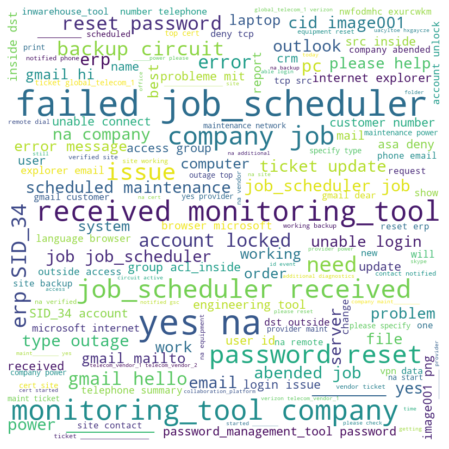

In [155]:
wordcloud_plot(newdf["Summary"])

(-0.5, 1599.5, 799.5, -0.5)

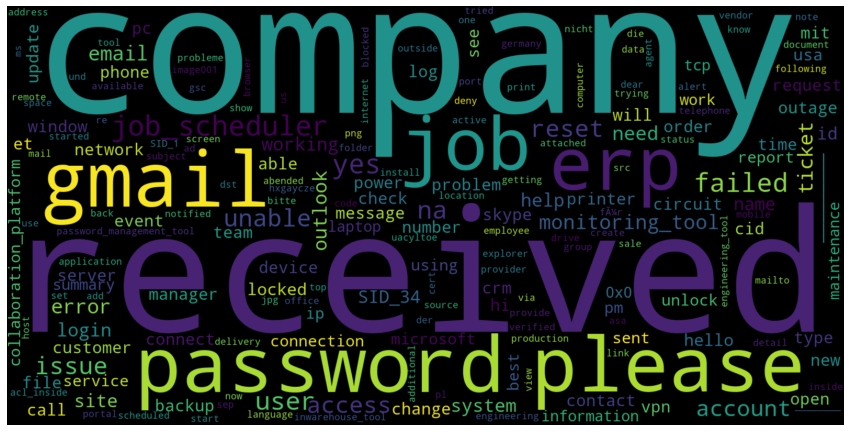

In [156]:
plt.figure(figsize = (15,15)) 
wc = WordCloud(width = 1600 , height = 800,collocations=False).generate(" ".join(w for w in newdf.Summary))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")

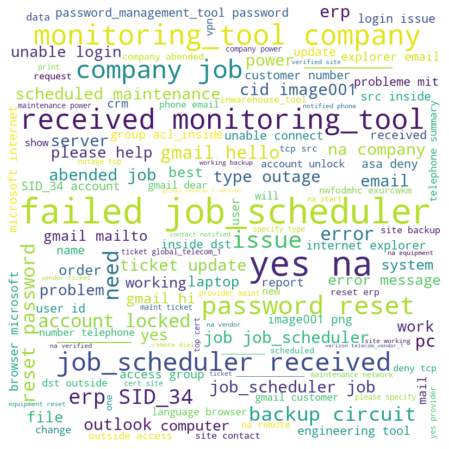

In [157]:
wordcloud_plot_stop(newdf["Summary"])

###2.5.2.Observation:
We have decided to take a combine column which will combine both short description and description.For this to handle the missing values we have concatinated with The in place of missing values which we will remove with the help of stop word.
We can also see the word cloud is messy and stop words have great impact on it.Moreover if we observe carefully we can see there are words with non english languages.So this gives a good visualization

##2.6.Finding inconsistencies in the data:

###2.6.1.We will try lang detect and polyglot library and will see language accuracy.


Lang Detect

In [158]:
newcleaneddf=newdf.copy(deep=False)

In [159]:
newdf['language1'] = newdf['Summary'].apply(fn_lan_detect)

In [160]:
newdf["language1"].value_counts()

en    7065
de     380
af     266
it     126
fr     118
da      81
nl      80
sv      76
no      74
ca      49
es      44
pl      34
pt      27
ro      12
cy      12
tl      12
sq       9
hr       7
sl       6
fi       4
et       4
id       4
tr       3
lt       2
cs       2
so       2
sk       1
Name: language1, dtype: int64

In [161]:
newdf=newdf.drop(["language1"], axis=1)


Polyglot language detection

In [162]:
newdf["lang"] = newdf["Summary"].apply(get_language)

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

In [163]:
newdf["lang"].value_counts()

English              7935
German                401
Danish                 43
un                     28
Latin                  12
Portuguese             10
Hungarian               8
Waray                   7
Nauru                   6
Scots                   5
Luxembourgish           5
Polish                  5
Dutch                   3
Zhuang                  3
Uzbek                   3
Spanish                 2
Interlingua             2
Ganda                   2
Scottish Gaelic         2
Kinyarwanda             2
Norwegian               2
Icelandic               1
Welsh                   1
Tsonga                  1
Tagalog                 1
Maltese                 1
Latvian                 1
Estonian                1
Malay                   1
Norwegian Nynorsk       1
Finnish                 1
Catalan                 1
Galician                1
Irish                   1
French                  1
Name: lang, dtype: int64

Same process will be repeated for cleaned text.

In [164]:
def text_preprocessing_forlangdetect(text):
    strText = str(text)
    cleanText = cleantext_lower(text)
    cleanText = cleantext_removeHTML(cleanText)
    cleanText = removeAccentedChars(cleanText)
    cleanText = re.sub(r'\S*@\S*\s?', '', cleanText)
    cleanText = cleantext_remove_punctuation(cleanText)
    cleanText = cleantext_removeSpecialChars(cleanText)
    return cleanText

In [165]:
newcleaneddf["cleanedsummary"]=newcleaneddf["Summary"].apply(text_preprocessing_forlangdetect)

In [166]:
newcleaneddf['language1'] = newcleaneddf['cleanedsummary'].apply(fn_lan_detect)


In [167]:
newcleaneddf["language1"].value_counts()

en    7079
de     373
af     270
it     120
fr     107
no      70
cy      66
nl      65
ca      58
da      53
sv      51
es      48
pl      30
pt      27
sl      17
ro      17
tl      12
sq       8
hr       6
et       5
id       4
hu       4
fi       4
cs       3
lt       2
so       1
Name: language1, dtype: int64

In [168]:
newcleaneddf["lang"] = newcleaneddf["cleanedsummary"].apply(get_language)


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

In [169]:
newcleaneddf["lang"].value_counts()

English              7885
German                398
Danish                 40
un                     28
Tongan                 24
Portuguese             13
Hawaiian               11
Latin                  10
Hungarian               9
Scots                   8
Dutch                   6
Luxembourgish           6
Nauru                   6
Welsh                   5
Polish                  5
Maltese                 4
Icelandic               3
Zhuang                  3
Uzbek                   3
Waray                   2
Scottish Gaelic         2
Breton                  2
Kinyarwanda             2
Norwegian               2
Interlingua             2
Spanish                 2
Ganda                   2
Samoan                  2
Zulu                    1
Romansh                 1
Tagalog                 1
Latvian                 1
Estonian                1
Malay                   1
Norwegian Nynorsk       1
Turkish                 1
Haitian Creole          1
Kalaallisut             1
Manx        

What we observed that polyglot gives more accuracy so we will go with it.Now we have 7900+ english rows for polyglot where as for langdetect it is giving 7000+

In [170]:
newdf.head(10)

,Short description,Description,Caller,Assignment group,Summary,lang
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,English
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,English
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,English
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,English
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,Latin
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,English
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...,English
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,ticket_no1550391- employment status - new non-...,English
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...,English
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773 ticket update ...,English


###2.6.2.We will divide the dataset to two part one with having rows with english language and one with non english languages.

In [171]:

def fn_translate(newdf):
  if newdf['lang'] == "English":
    engdf=newdf
    return engdf
  else:
    nonengdf=newdf
    return nonengdf
newdf.apply(fn_translate, axis = 1)   

,Short description,Description,Caller,Assignment group,Summary,lang
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,English
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,English
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,English
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,English
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,Latin
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,English
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...,English
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,ticket_no1550391- employment status - new non-...,English
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...,English
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773 ticket update ...,English


In [172]:
engdf = newdf[(newdf['lang'] == "English")]
nonengdf = newdf[(newdf['lang'] != "English")]

In [173]:
nonengdf.head(5)

,Short description,Description,Caller,Assignment group,Summary,lang
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,Latin
146,erp_print_tool install.,erp_print_tool install.,aorthyme rnsuipbk,GRP_0,erp_print_tool install. erp_print_tool install.,Kinyarwanda
148,install acrobat standard,install acrobat standard,iefgkray zdyksvpw,GRP_0,install acrobat standard install acrobat standard,Malay
223,probleme mit bluescreen .,"hallo ,\n\nes ist erneut passiert. der pc hat ...",vrfpyjwi nzhvgqiw,GRP_24,"probleme mit bluescreen . hallo ,\n\nes ist er...",German
251,reset the password for fygrwuna gomcekzi on e-...,bitte passwort fÃ¼r fygrwuna gomcekzi e-mail z...,fygrwuna gomcekzi,GRP_0,reset the password for fygrwuna gomcekzi on e-...,German


###2.6.3.Then we will apply Google translation on non english rows and merge the non english part with english part and create final feature column 

In [174]:


translator = Translator()

nonengdf["newsummary"] = nonengdf["Summary"].map(lambda x: translator.translate(x).text)

In [175]:
engdf["newsummary"]=engdf["Summary"]
finalsummary=pd.merge(engdf, nonengdf, how='outer')
finalsummary.head(5)

,Short description,Description,Caller,Assignment group,Summary,lang,newsummary
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,English,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,English,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,English,cant log in to vpn \r\n\r\nreceived from: eylq...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,English,unable to access hr_tool page unable to access...
4,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,English,unable to log in to engineering tool and skype...


In [176]:
print(finalsummary.shape)

print(finalsummary.isnull().sum())
finalticketsummary=finalsummary.drop(["lang"], axis=1)
#Shape and search for NA values

(8500, 7)
Short description    0
Description          0
Caller               0
Assignment group     0
Summary              0
lang                 0
newsummary           0
dtype: int64


In [177]:
finalticketsummary["lang1"] = finalticketsummary["newsummary"].apply(get_language)


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

###2.6.4.We will check language accuracy after translation

In [178]:
print(finalticketsummary["lang1"].value_counts())

English              8363
German                 40
un                     28
Latin                   9
Danish                  8
Nauru                   6
Hungarian               4
Scots                   4
Waray                   4
Polish                  4
Uzbek                   3
Portuguese              2
Kinyarwanda             2
Zhuang                  2
Interlingua             2
Scottish Gaelic         2
Ganda                   2
Tagalog                 1
Estonian                1
Welsh                   1
Tsonga                  1
Latvian                 1
Norwegian Nynorsk       1
Spanish                 1
Malay                   1
Maltese                 1
Dutch                   1
Finnish                 1
Catalan                 1
Norwegian               1
Irish                   1
French                  1
Name: lang1, dtype: int64


In [179]:
finalticketsummary.loc[finalticketsummary["lang1"]=="French"]

,Short description,Description,Caller,Assignment group,Summary,newsummary,lang1
8324,email delegation,email delegation,wbtrvdsi gdbuvszx,GRP_0,email delegation email delegation,email delegation email delegation,French


In [180]:
finalticketsummary=finalticketsummary.drop(["lang1"], axis=1)


###2.6.5.Observation:
1.For language detection we observed that the detection works better for unprocessed text rather than processed text.

2.The polyglot works better in terms of language accuracy with 7928+ english rows detection where as for lang detect it is 7069.

2.After translation 8300+ rows got translated and out of rest 70% is in english but due to some name it is detected as non english.So we are good to go and we will start doing further visualization and text processing

##2.7.Visualizing different text features:

###2.7.1.And visualize final feature column in word cloud

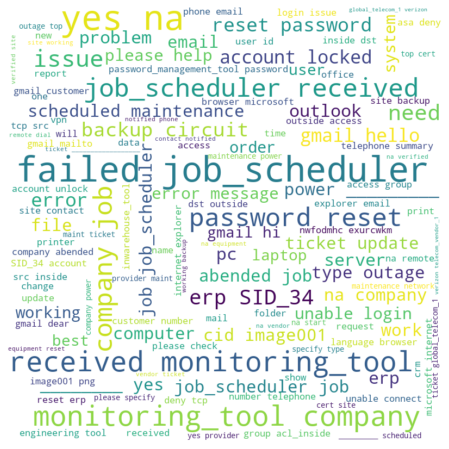

In [181]:
wordcloud_plot(finalticketsummary["newsummary"])

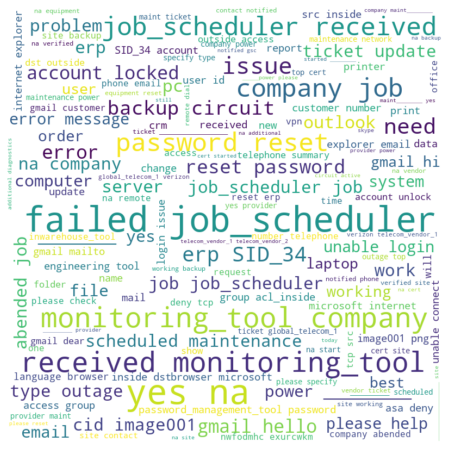

In [182]:
wordcloud_plot_stop(finalticketsummary["newsummary"])

###2.7.2.And also calculate top 50 frequent word

In [183]:
from collections import Counter
Counter(" ".join(finalticketsummary["newsummary"]).split()).most_common(50)

[('to', 8598),
 ('the', 7530),
 ('in', 4969),
 ('is', 3697),
 ('not', 2982),
 ('on', 2974),
 ('and', 2904),
 ('for', 2784),
 ('from:', 2499),
 ('i', 2472),
 ('received', 2392),
 ('please', 2097),
 ('a', 2086),
 ('job', 1976),
 ('of', 1973),
 ('password', 1900),
 ('erp', 1830),
 ('failed', 1704),
 ('job_scheduler', 1629),
 ('at:', 1614),
 ('(yes/no/na)', 1566),
 ('?', 1561),
 ('this', 1533),
 ('unable', 1484),
 ('-', 1446),
 ('it', 1434),
 ('reset', 1387),
 ('with', 1387),
 ('user', 1227),
 ('my', 1192),
 ('from', 1144),
 ('account', 1141),
 ('access', 1126),
 ('you', 1122),
 ('have', 1077),
 (':', 1048),
 ('monitoring_tool@company.com', 961),
 ('at', 922),
 ('company', 919),
 ('are', 910),
 ('issue', 898),
 ('be', 879),
 ('error', 866),
 ('that', 847),
 ('can', 834),
 ('am', 799),
 ('outlook', 795),
 ('ticket', 787),
 ('when', 756),
 ('site', 755)]

###2.7.3.Observations

What we observed that:The word cloud gets better and also there is very few non english words but most frequent words are still coming as stop words.So we need to apply preprocessing and remove stop word.

##2.8.Text preprocessing:


###2.8.1.We will do preprocessing and removed digit special character url mailID Extra spaces accented chars newlines HTML and also expand contractions and lemmatization will also be applied.We have created a single function inside it.

In [184]:
def text_preprocessing(text):
    strText = str(text)
    cleanText=removeDuplicates(text)
    cleanText = cleantext_removeHTML(cleanText)
    cleanText = re.sub(r'\d+', '', cleanText)
    cleanText = cleantext_remove_url(cleanText)
    cleanText = re.sub(r'\S*@\S*\s?', '', cleanText)
    cleantext = re.sub(r'https?:\/\/.\/\w', '', cleanText)  
    cleanText = cleantext_lower(cleanText)
       
    #cleanText = removeAccentedChars(cleanText)
    cleanText = expandContractions(cleanText)
    cleanText = cleantext_remove_punctuation(cleanText)
    
    cleanText = cleantext_removeSpecialChars(cleanText)
    cleantext = re.sub(r'\n',' ',cleanText)
    
    
    cleanText = re.sub(r'[^a-zA-Z\s]',' ',cleanText) 
    cleanText = re.sub(r'\s+',' ',cleanText)
    cleanText = cleantext_textLemmatize(cleanText)
    return cleanText

In [185]:
finalticketsummary["cleanedsummary"]=finalticketsummary["newsummary"].apply(text_preprocessing)

In [186]:
finalticketsummary["cleanedsummary"].head(53)

0     login issue verify user detail employee manage...
1     outlook receive from hello team my meeting sky...
2     can not log in to vpn receive from hi i can no...
3                         unable to access hr tool page
4           unable to log in engineering tool and skype
5     event critical hostname company com the value ...
6     ticket no employment status new non employee e...
7                   unable to disable add in on outlook
8                              ticket update on inplant
9     engineering tool say not connect and unable to...
10                 hr tool site not load page correctly
11     unable to login hr tool sgxqsuojr xwbesorf cards
12                      user want to reset the password
13                               unable to open payslip
14                             ticket update on inplant
15    unable to login company vpn receive from hi i ...
16          when undocking pc screen will not come back
17                                 erp sid accou

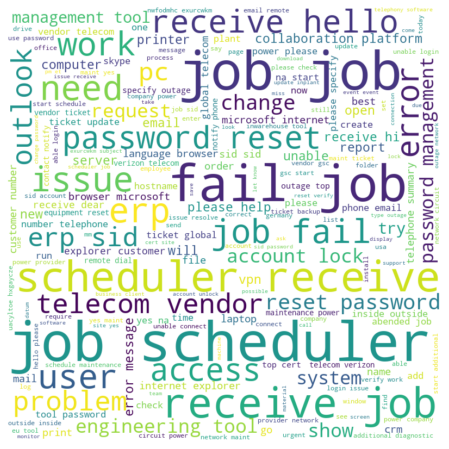

In [187]:
wordcloud_plot(finalticketsummary["cleanedsummary"])

In [188]:
from collections import Counter
Counter(" ".join(finalticketsummary["cleanedsummary"]).split()).most_common(50)

[('be', 5077),
 ('to', 3697),
 ('job', 3387),
 ('from', 3223),
 ('in', 3016),
 ('the', 2919),
 ('not', 2606),
 ('receive', 2523),
 ('i', 2173),
 ('please', 2004),
 ('on', 1713),
 ('and', 1658),
 ('for', 1615),
 ('have', 1606),
 ('a', 1590),
 ('password', 1496),
 ('at', 1483),
 ('no', 1377),
 ('it', 1360),
 ('tool', 1251),
 ('issue', 1222),
 ('erp', 1216),
 ('do', 1216),
 ('can', 1193),
 ('company', 1138),
 ('user', 1123),
 ('of', 1112),
 ('this', 1050),
 ('with', 1040),
 ('work', 1027),
 ('sid', 1016),
 ('reset', 988),
 ('scheduler', 970),
 ('fail', 941),
 ('ticket', 916),
 ('you', 890),
 ('unable', 888),
 ('error', 866),
 ('my', 849),
 ('access', 835),
 ('need', 766),
 ('account', 763),
 ('hello', 715),
 ('help', 693),
 ('system', 687),
 ('email', 678),
 ('that', 652),
 ('when', 638),
 ('get', 635),
 ('we', 625)]

###2.8.2.Observations
When we have applied preprocessing we get a better word cloud with out special character and the words are lemmatized like failed instead of fail

##2.9.Creating tokens as required


###2.9.1We will tokenize the final feature and remove stop word and have final tokenized feature for embedding.

In [189]:
def clean_tokenization(text):
  return word_tokenize(text)
finalticketsummary["tokenizesummary"]=finalticketsummary["cleanedsummary"].apply(clean_tokenization)
finalticketsummary["tokenizesummary"].head(10)

0    [login, issue, verify, user, detail, employee,...
1    [outlook, receive, from, hello, team, my, meet...
2    [can, not, log, in, to, vpn, receive, from, hi...
3                 [unable, to, access, hr, tool, page]
4    [unable, to, log, in, engineering, tool, and, ...
5    [event, critical, hostname, company, com, the,...
6    [ticket, no, employment, status, new, non, emp...
7          [unable, to, disable, add, in, on, outlook]
8                        [ticket, update, on, inplant]
9    [engineering, tool, say, not, connect, and, un...
Name: tokenizesummary, dtype: object

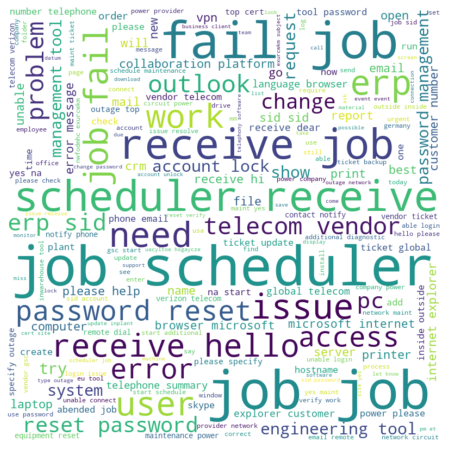

In [190]:
wordcloud_spam = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                     min_font_size = 10).generate_from_text(' '.join(word for w in finalticketsummary["tokenizesummary"] for word in w))

# Lines 2 - 5
plt.figure(figsize = (8,8))
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

In [191]:

result = set(stopwords.words('english'))
print("List of stopwords in English:")
print(result)


List of stopwords in English:
{'all', 'isn', "weren't", 'other', 'did', "needn't", 'after', 'wouldn', 'yourself', 'with', 'having', 'are', 'which', "aren't", 'being', 'who', 'does', 'do', 'because', 'off', "it's", 'him', "isn't", 'it', 'how', 'been', 'whom', "didn't", 'shouldn', 'that', 'below', 'they', 'doesn', 'couldn', 'didn', 'and', 'o', 's', 'some', "she's", 'why', 'again', 'while', "you're", 'doing', 'will', 'here', 'she', 'a', 'there', 'herself', 'of', 'ain', 'yourselves', "doesn't", 'can', 'most', "don't", 'further', 'my', 'then', 'very', 'once', "should've", 'you', "you'd", 'at', 'our', "you'll", 'so', 'no', 'about', "wouldn't", 'more', 'hasn', 'just', 'into', 'only', 'theirs', 'as', 'too', "haven't", 'y', 'before', "hasn't", 'mightn', 'myself', 'than', 'during', "you've", 'them', 'now', 'am', 'to', 'when', 'the', 'be', 'these', 'won', 'over', "wasn't", 'above', 'haven', 'under', 'in', 'or', 'until', "won't", 'few', 'needn', 'have', 'i', 'its', 'wasn', 'by', 'don', 'is', 'has'

In [192]:
stop_words = set(stopwords.words('english')) - set(["hadn't", "didn't", "shouldn't","shan't","hasn't","don't","needn't","won't","couldn't","doesn't","haven't","mustn't","nor","mightn't","weren't","isn't","wasn't","not","no","wouldn't","aren't"])
print("\nList of fresh stopwords in English:")
print(stop_words)

stop_words.add("e")
stop_words.add("f")
print(stop_words)


List of fresh stopwords in English:
{'all', 'isn', 'other', 'did', 'after', 'wouldn', 'yourself', 'with', 'having', 'are', 'which', 'being', 'who', 'does', 'do', 'because', 'off', "it's", 'him', 'it', 'how', 'been', 'whom', 'shouldn', 'that', 'below', 'they', 'doesn', 'couldn', 'didn', 'and', 'o', 's', 'some', "she's", 'why', 'again', 'while', "you're", 'doing', 'will', 'here', 'she', 'a', 'there', 'herself', 'of', 'ain', 'yourselves', 'can', 'most', 'further', 'my', 'then', 'very', 'once', "should've", 'you', "you'd", 'at', 'our', "you'll", 'so', 'about', 'more', 'hasn', 'just', 'into', 'only', 'theirs', 'as', 'too', 'y', 'before', 'mightn', 'myself', 'than', 'during', "you've", 'them', 'now', 'am', 'to', 'when', 'the', 'be', 'these', 'won', 'over', 'above', 'haven', 'under', 'in', 'or', 'until', 'few', 'needn', 'have', 'i', 'its', 'wasn', 'by', 'don', 'is', 'has', 'aren', 'for', 'himself', 'mustn', "that'll", 'hers', 'll', 'weren', 'should', 'your', 'shan', 'from', 'themselves', 'yo

In [193]:
#STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    """custom function to remove the stopwords"""
    return " ".join([word for word in str(text).split() if word not in stop_words])

finalticketsummary["CleanTextAfterRemoveStopword"] = finalticketsummary["cleanedsummary"].apply(lambda text: remove_stopwords(text))
finalticketsummary["CleanTextAfterRemoveStopword"].head()

0    login issue verify user detail employee manage...
1    outlook receive hello team meeting skype meeti...
2                  not log vpn receive hi not vpn best
3                           unable access hr tool page
4                    unable log engineering tool skype
Name: CleanTextAfterRemoveStopword, dtype: object

In [194]:
finalticketsummary["tokenizesummaryafterstopword"]=finalticketsummary["CleanTextAfterRemoveStopword"].apply(clean_tokenization)

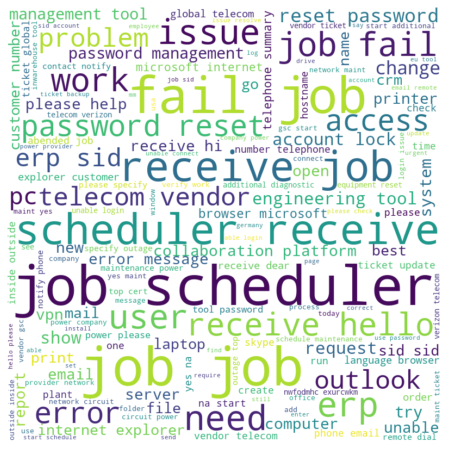

In [195]:
wordcloud_spam = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                     min_font_size = 10).generate_from_text(' '.join(word for w in finalticketsummary["tokenizesummaryafterstopword"] for word in w))

# Lines 2 - 5
plt.figure(figsize = (8,8))
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

In [196]:
Counter(" ".join(finalticketsummary["CleanTextAfterRemoveStopword"]).split()).most_common(50)

[('job', 3387),
 ('not', 2606),
 ('receive', 2523),
 ('please', 2004),
 ('password', 1496),
 ('no', 1377),
 ('tool', 1251),
 ('issue', 1222),
 ('erp', 1216),
 ('company', 1138),
 ('user', 1123),
 ('work', 1027),
 ('sid', 1016),
 ('reset', 988),
 ('scheduler', 970),
 ('fail', 941),
 ('ticket', 916),
 ('unable', 888),
 ('error', 866),
 ('access', 835),
 ('need', 766),
 ('account', 763),
 ('hello', 715),
 ('help', 693),
 ('system', 687),
 ('email', 678),
 ('get', 635),
 ('name', 617),
 ('network', 608),
 ('hostname', 597),
 ('would', 588),
 ('yes', 587),
 ('use', 584),
 ('outlook', 571),
 ('vendor', 567),
 ('login', 533),
 ('message', 518),
 ('na', 505),
 ('power', 504),
 ('see', 484),
 ('telecom', 479),
 ('update', 473),
 ('change', 457),
 ('check', 443),
 ('problem', 441),
 ('start', 439),
 ('phone', 428),
 ('event', 426),
 ('try', 425),
 ('team', 422)]

(-0.5, 1599.5, 799.5, -0.5)

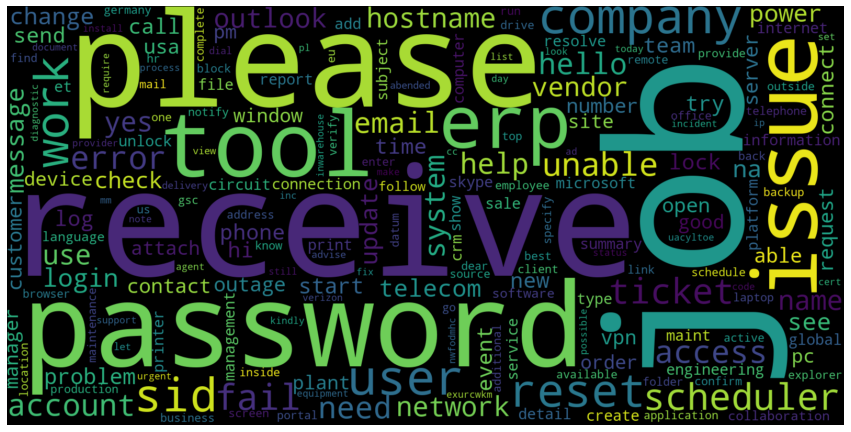

In [197]:
plt.figure(figsize = (15,15)) 
wc = WordCloud(width = 1600 , height = 800,collocations=False).generate(" ".join(w for w in finalticketsummary.CleanTextAfterRemoveStopword))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")

In [198]:
finalticketsummary.head()

,Short description,Description,Caller,Assignment group,Summary,newsummary,cleanedsummary,tokenizesummary,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,login issue -verified user details.(employee# ...,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,...",login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,outlook receive from hello team my meeting sky...,"[outlook, receive, from, hello, team, my, meet...",outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,cant log in to vpn \r\n\r\nreceived from: eylq...,can not log in to vpn receive from hi i can no...,"[can, not, log, in, to, vpn, receive, from, hi...",not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,unable to access hr_tool page unable to access...,unable to access hr tool page,"[unable, to, access, hr, tool, page]",unable access hr tool page,"[unable, access, hr, tool, page]"
4,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,unable to log in to engineering tool and skype...,unable to log in engineering tool and skype,"[unable, to, log, in, engineering, tool, and, ...",unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


In [199]:
finalticketsummary=finalticketsummary.drop(["Short description","Description","Summary","cleanedsummary","tokenizesummary","newsummary","Caller"], axis=1)
finalticketsummary.head()

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


0 8 24 12 9

Top 5 group data

In [200]:
finalticketsummary['Assignment group'].value_counts().nlargest(5)

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
Name: Assignment group, dtype: int64

In [201]:
finalticketsummary=finalticketsummary.loc[finalticketsummary['Assignment group'].isin(['GRP_0','GRP_8','GRP_24','GRP_12','GRP_9'])]

In [202]:
finalticketsummary.shape

(5435, 3)

In [203]:
finalticketsummary['Assignment group'].value_counts()

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
Name: Assignment group, dtype: int64

In [204]:
finalticketsummary.head()

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


##2.10.Pickle data set

In [205]:
import os
os.chdir('/content/drive/My Drive/')

In [206]:
finalticketsummary.to_pickle('final_top5.pkl')  

In [207]:
finaldata = '/content/drive/My Drive/final_top5.pkl'

In [208]:
finaldataset=pd.read_pickle(finaldata)

In [209]:
finaldataset.to_csv('/content/drive/My Drive/Final_top5.csv')

###Observation:

We have tokenized the cleaned text and removed the stopword.Our final feature is ready now and the frequent words values have a significant change and also the word cloud is more prominent.Now we are good to go for embedding.We have top 5 pickled data set and also complete data set for observations

#3.Model Building ML MODEL





##3.1.Featurization

3.1.1. Convert the target column to label encoded output


3.1.2.Try TFIDF and Count vectorizaer and apply transformed input to different conventional Machine Learning models with test train split

3.1.3. Creation of Data frame to compare the models

3.1.4.Observations



##3.2.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for count vectorizer

3.2.1.Try multiple models for transformed input with Count vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

3.2.2.Creation of a common function on model building with all the performence metrices 

3.2.3.Sample classification report of ML  models

3.2.4.Observations

##3.3.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for tfidf vectorizer

3.3.1.Try multiple models for transformed input with tfidf vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

3.3.2.Comparison data frame of different machine learning models

3.3.3.Observations

##3.4.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for Pipeline with Count then TIDF vectorizer 

3.4.1.Try multiple models for transformed input with Pipeline with Count then TIDF vectorizer  and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

3.4.2.Comparison data frame of different machine learning models

3.4.3.Observations



#Top 5 Group

##3.1.Featurization



###3.1.1.Convert the target column to label encoded output




In [210]:
finalticketsummary=finaldataset

In [211]:

# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
# Encode labels in column 'species'. 
finalticketsummary['Assignment group_num']= label_encoder.fit_transform(finalticketsummary['Assignment group'])  
finalticketsummary['Assignment group_num'].tail()

8491    2
8492    2
8493    2
8494    2
8496    0
Name: Assignment group_num, dtype: int64

In [212]:
finalticketsummary[4020:4040]


,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword,Assignment group_num
6298,GRP_0,audio not work,"[audio, not, work]",0
6299,GRP_0,erp blank screen,"[erp, blank, screen]",0
6300,GRP_0,unable start computer show startup repair,"[unable, start, computer, show, startup, repair]",0
6301,GRP_9,job job fail job scheduler receive job,"[job, job, fail, job, scheduler, receive, job]",4
6303,GRP_0,erp sid password reset request ughzilfm cfibdamq,"[erp, sid, password, reset, request, ughzilfm,...",0
6305,GRP_12,read write access drive folder receive hi plea...,"[read, write, access, drive, folder, receive, ...",1
6306,GRP_0,unable outlook,"[unable, outlook]",0
6307,GRP_0,reset password mfvkxghn mzjasxqd sid erp need ...,"[reset, password, mfvkxghn, mzjasxqd, sid, erp...",0
6308,GRP_0,account lock ad,"[account, lock, ad]",0
6309,GRP_0,ticket update ticket no,"[ticket, update, ticket, no]",0


###3.1.2.Try TFIDF and Count vectorizaer and apply transformed input to different conventional Machine Learning models with test train split

In [213]:
#Test train split
x_train_count, x_test_count, y_train_count, y_test_count = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"], finalticketsummary['Assignment group_num'], test_size=0.2,random_state=0)
                                                             
print(x_train_count.shape,x_test_count.shape)
print(y_train_count.shape,y_test_count.shape)

(4348,) (1087,)
(4348,) (1087,)


In [214]:
vectorizer = CountVectorizer()  
X_train_count = vectorizer.fit_transform(x_train_count)
X_train_count.shape

X_test_count = vectorizer.transform(x_test_count)
X_test_count.shape
X_train_count
#Count Vectorizer Transformation

<4348x5871 sparse matrix of type '<class 'numpy.int64'>'
	with 50358 stored elements in Compressed Sparse Row format>

In [215]:
count_tokens = vectorizer.get_feature_names()
print(count_tokens)

['aa', 'ab', 'abap', 'abbc', 'abc', 'abd', 'abdhtyu', 'abend', 'abended', 'abgebildet', 'abgrtyreu', 'abholen', 'ability', 'abl', 'able', 'abort', 'aborted', 'absender', 'absolutely', 'abstech', 'ac', 'acc', 'accdb', 'acce', 'accees', 'accept', 'acceptance', 'accesible', 'acceso', 'access', 'accessible', 'accessing', 'accidentally', 'accompany', 'accomplish', 'accord', 'accordance', 'accordingly', 'accound', 'account', 'accounting', 'accounts', 'accout', 'accse', 'accsess', 'acct', 'accurate', 'acess', 'acgyuna', 'achghar', 'achghyardr', 'achim', 'acl', 'acqpinyd', 'acquire', 'acrobat', 'across', 'act', 'action', 'activate', 'activation', 'active', 'activesync', 'activex', 'activitiess', 'activity', 'actual', 'actually', 'aczyfqjr', 'ad', 'adapter', 'add', 'added', 'addin', 'addition', 'additional', 'additionally', 'addon', 'address', 'addressee', 'adelhmk', 'adgtym', 'adjtmlzn', 'adjust', 'admin', 'administra', 'administrador', 'administration', 'administrative', 'administrator', 'ado

chi square method for better results

In [216]:
ch2 = SelectKBest(chi2, k=5000)
X_train_chi_count = ch2.fit_transform(X_train_count, y_train_count)
X_test_chi_count = ch2.transform(X_test_count)

X_train_chi_count, X_test_chi_count
#Selection of best features

(<4348x5000 sparse matrix of type '<class 'numpy.int64'>'
 	with 49487 stored elements in Compressed Sparse Row format>,
 <1087x5000 sparse matrix of type '<class 'numpy.int64'>'
 	with 11117 stored elements in Compressed Sparse Row format>)

###3.1.3. Creation of Data frame to compare the models

In [217]:

data = {'ModelName':['TrainAccuracy', 'TestAccuracy', 'PrecisionScore', 'RecallScore','F1Score']}
modecomparedf= pd.DataFrame(data)
modecomparedf

,ModelName
0,TrainAccuracy
1,TestAccuracy
2,PrecisionScore
3,RecallScore
4,F1Score


###3.1.4.Observations
1.Completed the count vectorizer transformation and created the transformed input to apply to model

2.Created the data frame to observe model comparison

3.Converted the target column to label encoded output

4.Also for selecting best features we have used chisquare method which gives a better accuracy

8.We have splitted the data to 80:20


##3.2.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks


###3.2.1.Try multiple models for transformed input with Count vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [218]:
mclf = MultinomialNB().fit(X_train_count, y_train_count)
data_m=predict_ml_model(mclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['MultinomialNB'] = data_m


accuracy 0.921803127874885
Training score: 93.81324747010119
Testing score: 92.1803127874885


In [219]:

rclf = RandomForestClassifier()
data_m=predict_ml_model(rclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['RandomForest'] = data_m


accuracy 0.922723091076357
Training score: 96.68813247470102
Testing score: 92.27230910763569


In [220]:


sclf= SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)

sclf.fit(X_train_chi_count, y_train_count)



y_pred = sclf.predict(X_test_chi_count)

print('accuracy %s' % accuracy_score(y_pred, y_test_count))
print('Training score:',sclf.score(X_train_chi_count, y_train_count)*100)
print('Testing score:',sclf.score(X_test_chi_count,y_test_count)*100)


accuracy 0.9080036798528058
Training score: 94.77920883164673
Testing score: 90.80036798528059


In [221]:
sclf=LogisticRegression(n_jobs=1, C=1e5)
data_m=predict_ml_model(sclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['LogisticRegression'] = data_m


accuracy 0.9254829806807727
Training score: 96.68813247470102
Testing score: 92.54829806807727


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [222]:
modecomparedf

,ModelName,MultinomialNB,RandomForest,LogisticRegression
0,TrainAccuracy,93.813247,96.688132,96.688132
1,TestAccuracy,92.180313,92.272309,92.548298
2,PrecisionScore,95.279737,94.993091,94.171008
3,RecallScore,92.180313,92.272309,92.548298
4,F1Score,93.328809,93.177341,93.096334


###3.2.2.Creation of a common function on model building with all the performence metrices 

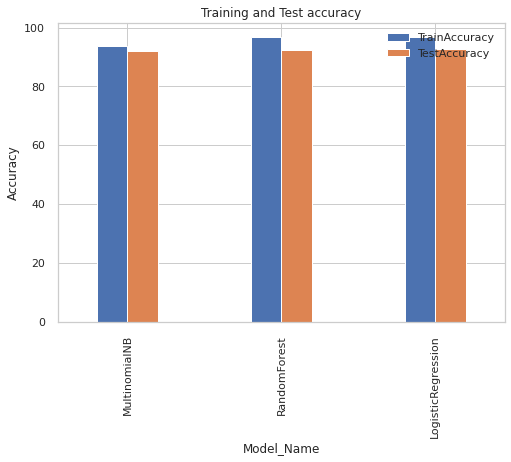

<Figure size 1080x720 with 0 Axes>

In [223]:
modecomparedf
modelCompare_countVect=modecomparedf.set_index('ModelName').rename_axis(None).T
modelCompare_countVect['Model_Name']=['MultinomialNB','RandomForest','LogisticRegression']
modelCompare_countVect
modelCompare_countVect.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.title('Training and Test accuracy')
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 

plt.show()

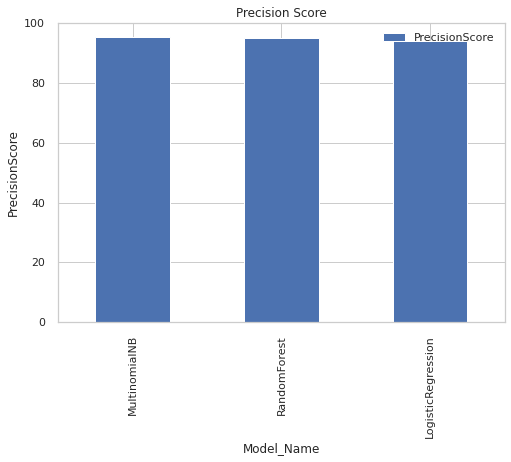

<Figure size 720x360 with 0 Axes>

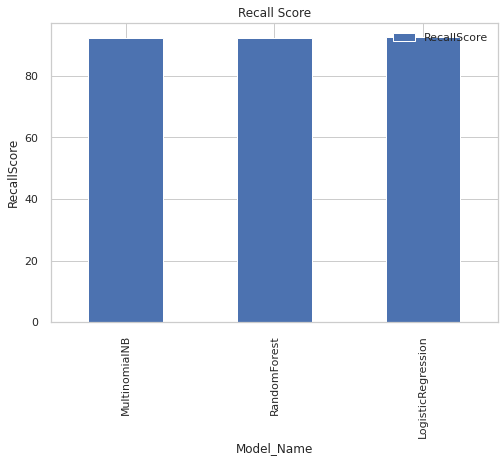

<Figure size 720x360 with 0 Axes>

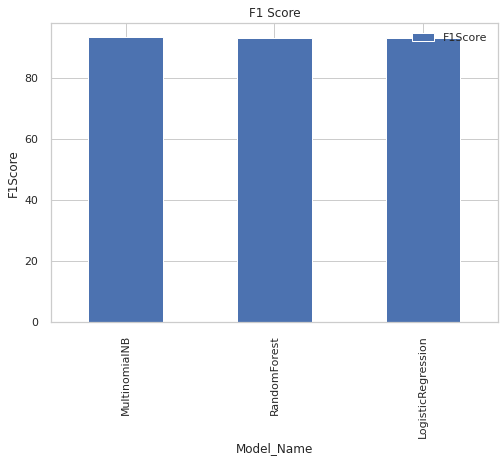

<Figure size 720x360 with 0 Axes>

In [224]:

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#,'F1Score']

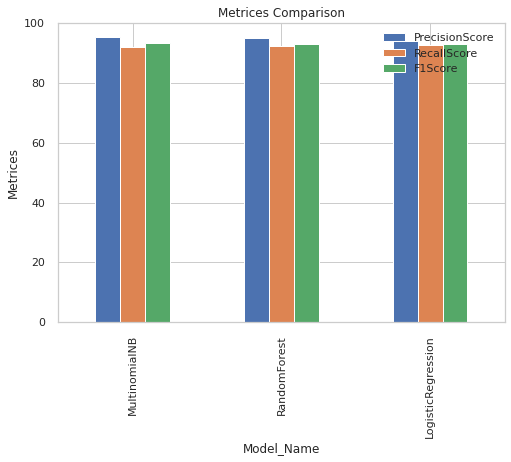

<Figure size 720x360 with 0 Axes>

In [225]:
modelCompare_countVect.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

In [226]:


modellist={'Random Forest': RandomForestClassifier(random_state=3),
              'Multinomial Naive Bayes': MultinomialNB(),
              'Logistic Regression': LogisticRegression()}

###3.2.3.Sample classification report of ML  models

In [227]:
def classification_Report(modellist):
    for k, item in modellist.items():
      item.fit(X_train_chi_count.toarray(), y_train_count)        
      y_pred = item.predict(X_test_chi_count.toarray())
      report = classification_report(y_test_count, y_pred)   
      print(k)    
      print(report)  
classification_Report(modellist)

Random Forest
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       802
           1       0.82      0.48      0.61        56
           2       1.00      0.75      0.86        52
           3       0.86      0.92      0.89       135
           4       0.75      0.36      0.48        42

    accuracy                           0.92      1087
   macro avg       0.87      0.70      0.76      1087
weighted avg       0.92      0.92      0.91      1087

Multinomial Naive Bayes
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       802
           1       0.73      0.54      0.62        56
           2       0.95      0.77      0.85        52
           3       0.82      0.93      0.87       135
           4       1.00      0.21      0.35        42

    accuracy                           0.92      1087
   macro avg       0.89      0.69      0.73      1087
weighted avg       0.92      0.92      

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



###3.2.4.Observations
We have fitted the transformed input with chi square selection to Random forest Logistic Regression and Multinomial Naive Bayes models and plotted the test train accuracy plot.

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to make large overfit . Multinomial NB gives 93% training accuracy in the training dataset and 91% in the testing data which shows that it has less amount of overfit. So, for count vectorizer, multinomial NB gives better result in terms of accuracy and precision.
Also we can see the f1 score and precision is not good for second highest and 4th highest group.So we will dig more in other models

##3.3.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for tf-idf vectorizer

###3.3.1.Try multiple models for transformed input with TF-IDF vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [228]:

vectorizer = TfidfVectorizer()
vectorizer.fit(x_train_count)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [229]:
tfidf_tokens = vectorizer.get_feature_names()
print(tfidf_tokens)

['aa', 'ab', 'abap', 'abbc', 'abc', 'abd', 'abdhtyu', 'abend', 'abended', 'abgebildet', 'abgrtyreu', 'abholen', 'ability', 'abl', 'able', 'abort', 'aborted', 'absender', 'absolutely', 'abstech', 'ac', 'acc', 'accdb', 'acce', 'accees', 'accept', 'acceptance', 'accesible', 'acceso', 'access', 'accessible', 'accessing', 'accidentally', 'accompany', 'accomplish', 'accord', 'accordance', 'accordingly', 'accound', 'account', 'accounting', 'accounts', 'accout', 'accse', 'accsess', 'acct', 'accurate', 'acess', 'acgyuna', 'achghar', 'achghyardr', 'achim', 'acl', 'acqpinyd', 'acquire', 'acrobat', 'across', 'act', 'action', 'activate', 'activation', 'active', 'activesync', 'activex', 'activitiess', 'activity', 'actual', 'actually', 'aczyfqjr', 'ad', 'adapter', 'add', 'added', 'addin', 'addition', 'additional', 'additionally', 'addon', 'address', 'addressee', 'adelhmk', 'adgtym', 'adjtmlzn', 'adjust', 'admin', 'administra', 'administrador', 'administration', 'administrative', 'administrator', 'ado

In [230]:
X_train_tfidf = vectorizer.transform(x_train_count)
X_test_tfidf = vectorizer.transform(x_test_count)
X_train_tfidf.shape

(4348, 5871)

In [231]:
mclf = MultinomialNB().fit(X_train_tfidf, y_train_count)
data_m=predict_ml_model(mclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['MultinomialNB_TFIdf'] = data_m


accuracy 0.8886844526218951
Training score: 89.00643974241031
Testing score: 88.86844526218951


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [232]:

rclf = RandomForestClassifier()
data_m=predict_ml_model(rclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['RandomForestClassifier_TFIdf'] = data_m


accuracy 0.9190432382704692
Training score: 96.68813247470102
Testing score: 91.90432382704692


In [233]:
sclf=LogisticRegression(n_jobs=1, C=1e5)
data_m=predict_ml_model(sclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['LogisticRegression_TFIdf'] = data_m


accuracy 0.9310027598896045
Training score: 96.68813247470102
Testing score: 93.10027598896045


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [234]:
lclf= SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)
data_m=predict_ml_model(lclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['SGDClassifier_TFIdf'] = data_m


accuracy 0.8969641214351426
Training score: 89.67341306347745
Testing score: 89.69641214351427


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###3.3.2.Comparison data frame of different machine learning models

In [235]:
modecomparedf_new=modecomparedf.drop(["MultinomialNB","RandomForest","LogisticRegression"], axis=1)
modecomparedf_new

,ModelName,MultinomialNB_TFIdf,RandomForestClassifier_TFIdf,LogisticRegression_TFIdf,SGDClassifier_TFIdf
0,TrainAccuracy,89.006440,96.688132,96.688132,89.673413
1,TestAccuracy,88.868445,91.904324,93.100276,89.696412
2,PrecisionScore,96.993879,94.529762,94.936381,96.358795
3,RecallScore,88.868445,91.904324,93.100276,89.696412
4,F1Score,92.160091,92.839076,93.716744,92.402223


###Plots

In [236]:
modelCompare_TFIDFVect=modecomparedf_new.set_index('ModelName').rename_axis(None).T
modelCompare_TFIDFVect['Model_Name']=['MultinomialNB_TFIdf','RandomForest_TFIdf','LogisticR_TFIdf','SGD_TFIdf']


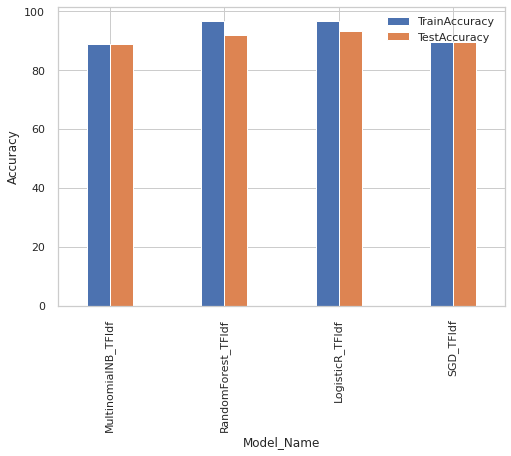

<Figure size 1080x720 with 0 Axes>

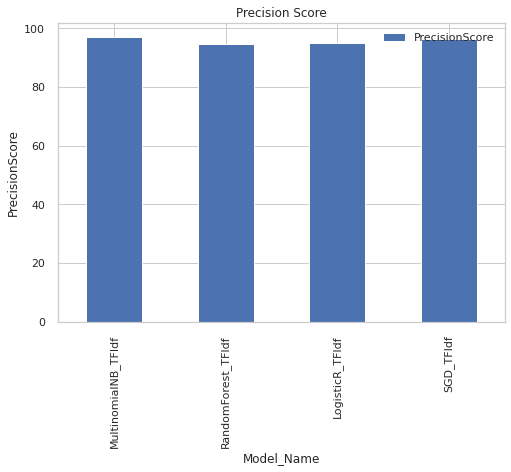

<Figure size 720x360 with 0 Axes>

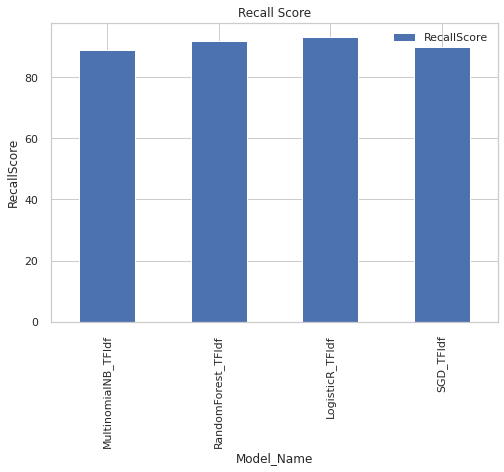

<Figure size 720x360 with 0 Axes>

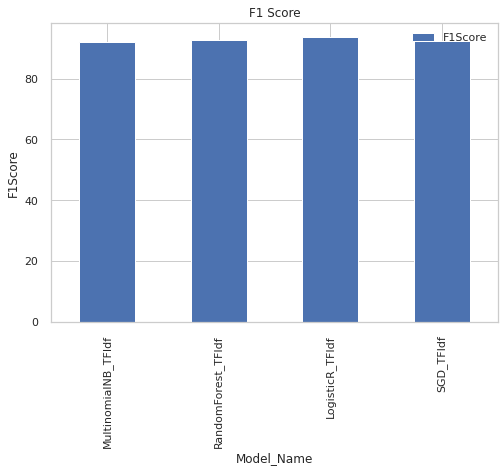

<Figure size 720x360 with 0 Axes>

In [237]:
#Accuracy plot
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 
plt.show()

#Precision plot
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#Recall plot

modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#F1 score

modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

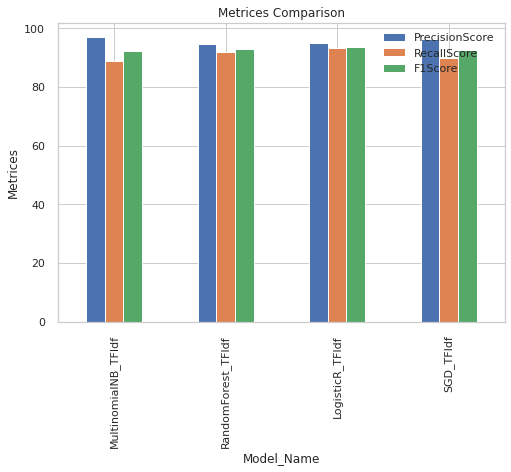

<Figure size 720x360 with 0 Axes>

In [238]:
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

###3.3.3.Observations

We have fitted the transformed input  to Random forest Logistic Regression,SGD  and Multinomial Naive Bayes models and plotted the test train accuracy plot.

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to give overfit. SGD Classifier gives 89% training accuracy in the training dataset and 89% in the testing data which shows that it has no  overfit. So, for TF-IDF vectorizer, SGD Classifier gives better result in terms of accuracy. So we will dig more in other models

##3.4.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for Pipeline with Count then TIDF vectorizer 

###3.4.1.Try multiple models for transformed input with Pipeline with Count then TIDF vectorizer  and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [239]:
x_train_tfid, x_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"], finalticketsummary['Assignment group_num'], test_size=0.3,random_state=0)
                                                             
print(x_train_tfid.shape,x_test_tfidf.shape)
print(y_train_tfidf.shape,y_test_tfidf.shape)

(3804,) (1631,)
(3804,) (1631,)


In [240]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', MultinomialNB())])
#text_clf.fit(x_train_tfid, y_train_tfidf)

In [241]:
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['MultinomialNB_CountandTFIdf'] = data_m

accuracy 0.8786020846106684
Training score: 88.93270241850684
Testing score: 87.86020846106683


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [242]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', LogisticRegression(n_jobs=1, C=1e5))])

In [243]:
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['LogisticRegression_CountandTFIdf'] = data_m

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



accuracy 0.9202942979767014
Training score: 96.81913774973711
Testing score: 92.02942979767013


In [244]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', RandomForestClassifier())])
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['RandomForestClassifier_CountandTFIdf'] = data_m

accuracy 0.911710606989577
Training score: 96.81913774973711
Testing score: 91.17106069895769


In [245]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None))])
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['SGDClassifier_CountandTFIdf'] = data_m

accuracy 0.8927038626609443
Training score: 90.19453207150369
Testing score: 89.27038626609442


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###3.4.2.Comparison data frame of different machine learning models

In [246]:
modecomparedf_pipe=modecomparedf.drop(["MultinomialNB","RandomForest","LogisticRegression","MultinomialNB_TFIdf","RandomForestClassifier_TFIdf","LogisticRegression_TFIdf","SGDClassifier_TFIdf"], axis=1)
modecomparedf_pipe

,ModelName,MultinomialNB_CountandTFIdf,LogisticRegression_CountandTFIdf,RandomForestClassifier_CountandTFIdf,SGDClassifier_CountandTFIdf
0,TrainAccuracy,88.932702,96.819138,96.819138,90.194532
1,TestAccuracy,87.860208,92.029430,91.171061,89.270386
2,PrecisionScore,96.857054,95.285655,95.475747,96.177472
3,RecallScore,87.860208,92.029430,91.171061,89.270386
4,F1Score,91.506400,93.185523,92.897236,92.093130


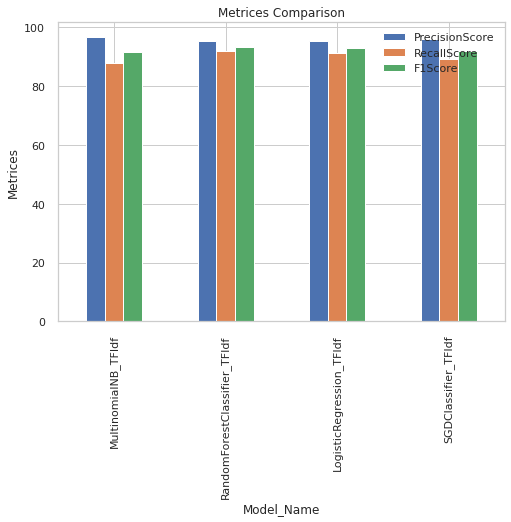

<Figure size 720x360 with 0 Axes>

In [247]:
modelCompare_Pipe=modecomparedf_pipe.set_index('ModelName').rename_axis(None).T
modelCompare_Pipe['Model_Name']=['MultinomialNB_TFIdf','RandomForestClassifier_TFIdf','LogisticRegression_TFIdf','SGDClassifier_TFIdf']

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

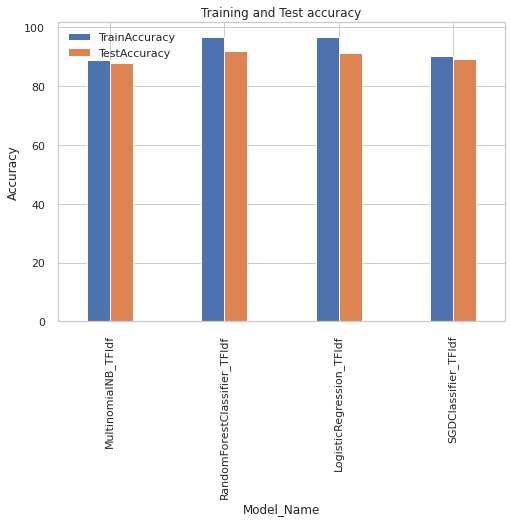

<Figure size 1080x720 with 0 Axes>

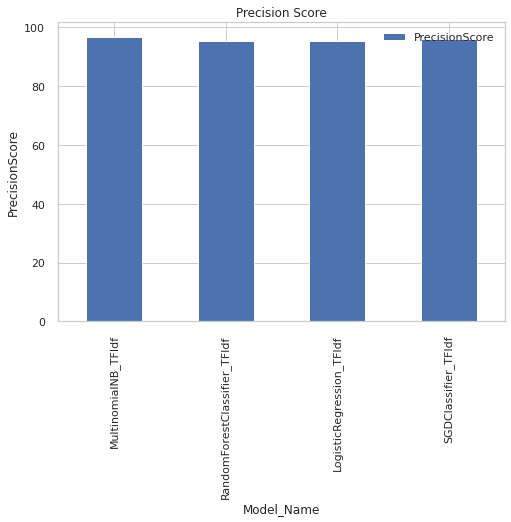

<Figure size 720x360 with 0 Axes>

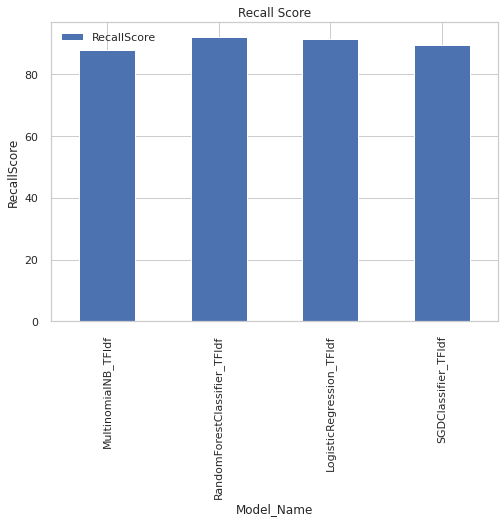

<Figure size 720x360 with 0 Axes>

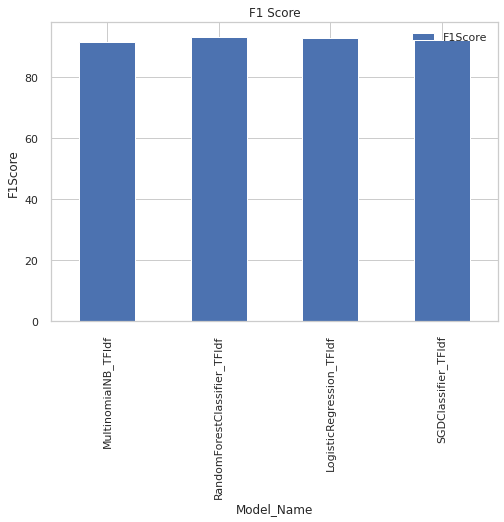

<Figure size 720x360 with 0 Axes>

In [248]:
modelCompare_Pipe.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.title('Training and Test accuracy')
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

###3.4.3.Observations

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to give overfit. SGD Classifier gives 90% training accuracy in the training dataset and 89% in the testing data which shows that it has almost no overfit. So, for TF-IDF vectorizer, SGD Classifier gives better result in terms of accuracy. So we will dig more in other models


#Complete data set

##3.5.Featurization

3.5.1. Convert the target column to label encoded output

3.5.2.Try TFIDF and Count vectorizaer and apply transformed input to different conventional Machine Learning models with test train split

3.5.3. Creation of Data frame to compare the models

3.5.4.Observations


##3.6.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for count vectorizer

3.6.1.Try multiple models for transformed input with Count vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

3.6.2.Creation of a common function on model building with all the performence metrices 

3.6.3.Sample classification report of ML  models

3.6.4.Observations

##3.7.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for tfidf vectorizer

3.7.1.Try multiple models for transformed input with tfidf vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

3.7.2.Comparison data frame of different machine learning models

3.7.3.Observations

##3.8.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for Pipeline with Count then TIDF vectorizer 

3.8.1.Try multiple models for transformed input with Pipeline with Count then TIDF vectorizer  and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

3.8.2.Comparison data frame of different machine learning models

3.8.3.Observations


##3.5.Featurization

In [249]:
finaldata_all = '/content/drive/My Drive/final.pkl'

In [250]:
finaldataset_all=pd.read_pickle(finaldata_all)

In [251]:
finaldataset_all.shape

(8500, 3)

In [252]:
finaldataset_all.head(5)

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


In [253]:
finalticketsummary=finaldataset_all

In [254]:
finalticketsummary.shape

(8500, 3)

###3.5.1. Convert the target column to label encoded output

In [255]:

# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
# Encode labels in column 'species'. 
finalticketsummary['Assignment group_num']= label_encoder.fit_transform(finalticketsummary['Assignment group'])  
finalticketsummary['Assignment group_num'].tail()

8495    27
8496     0
8497    27
8498    24
8499    44
Name: Assignment group_num, dtype: int64

In [256]:
#Test train split
x_train_count, x_test_count, y_train_count, y_test_count = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"], finalticketsummary['Assignment group_num'], test_size=0.2,random_state=0)
                                                             
print(x_train_count.shape,x_test_count.shape)
print(y_train_count.shape,y_test_count.shape)

(6800,) (1700,)
(6800,) (1700,)


###3.5.2.Try TFIDF and Count vectorizaer and apply transformed input to different conventional Machine Learning models with test train split

In [257]:
vectorizer = CountVectorizer()  
X_train_count = vectorizer.fit_transform(x_train_count)
X_train_count.shape

X_test_count = vectorizer.transform(x_test_count)
X_test_count.shape
X_train_count
#Count Vectorizer Transformation

<6800x10330 sparse matrix of type '<class 'numpy.int64'>'
	with 96672 stored elements in Compressed Sparse Row format>

In [258]:
count_tokens = vectorizer.get_feature_names()
print(count_tokens)

['aa', 'aaa', 'aacbcc', 'aacount', 'aae', 'aao', 'aaplant', 'ab', 'abandon', 'abap', 'abb', 'abbc', 'abc', 'abca', 'abd', 'abdhtyu', 'abend', 'abende', 'abended', 'aber', 'abertura', 'abgebildet', 'abgeschlossen', 'abgrtyreu', 'abhanden', 'abhay', 'abhilfe', 'abholen', 'ability', 'abl', 'able', 'abode', 'abort', 'aborted', 'aborting', 'abovementioned', 'abrechnung', 'abreu', 'abrurto', 'absence', 'absender', 'absent', 'absolutely', 'abstechprogramdntym', 'abwfnzwbnvbw', 'ac', 'acache', 'acbccb', 'acc', 'acccount', 'accdb', 'acce', 'accede', 'accept', 'acceptance', 'accesible', 'acceso', 'access', 'accessed', 'accessibility', 'accessible', 'accessing', 'accesss', 'accident', 'accidental', 'accidentally', 'accidently', 'accompany', 'accomplish', 'accont', 'accord', 'accordance', 'accordingly', 'accound', 'account', 'accountant', 'accounting', 'accounts', 'accout', 'accross', 'accrual', 'accse', 'accsess', 'acct', 'accuracy', 'accurate', 'acd', 'ace', 'acess', 'acessos', 'acgyuna', 'ache'

In [259]:
ch2 = SelectKBest(chi2, k=5000)
X_train_chi_count = ch2.fit_transform(X_train_count, y_train_count)
X_test_chi_count = ch2.transform(X_test_count)

X_train_chi_count, X_test_chi_count
#Selection of best features

(<6800x5000 sparse matrix of type '<class 'numpy.int64'>'
 	with 85671 stored elements in Compressed Sparse Row format>,
 <1700x5000 sparse matrix of type '<class 'numpy.int64'>'
 	with 19441 stored elements in Compressed Sparse Row format>)

###3.5.3. Creation of Data frame to compare the models

In [260]:

data = {'ModelName':['TrainAccuracy', 'TestAccuracy', 'PrecisionScore', 'RecallScore','F1Score']}
modecomparedf= pd.DataFrame(data)
modecomparedf

,ModelName
0,TrainAccuracy
1,TestAccuracy
2,PrecisionScore
3,RecallScore
4,F1Score


###3.5.4.Observations
1.Completed the count vectorizer transformation and created the transformed input to apply to model

2.Created the data frame to observe model comparison

3.Converted the target column to label encoded output

4.Also for selecting best features we have used chisquare method which gives a better accuracy

8.We have splitted the data to 80:20

##3.6.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for count vectorizer

###3.6.1.Try multiple models for transformed input with Count vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [261]:
mclf = MultinomialNB().fit(X_train_count, y_train_count)
data_m=predict_ml_model(mclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['MultinomialNB'] = data_m


accuracy 0.6476470588235295
Training score: 70.69117647058823
Testing score: 64.76470588235294


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [262]:

rclf = RandomForestClassifier()
data_m=predict_ml_model(rclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['RandomForest'] = data_m


accuracy 0.6605882352941177
Training score: 94.6470588235294
Testing score: 66.05882352941177


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [263]:


sclf= SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)

sclf.fit(X_train_chi_count, y_train_count)



y_pred = sclf.predict(X_test_chi_count)

print('accuracy %s' % accuracy_score(y_pred, y_test_count))
print('Training score:',sclf.score(X_train_chi_count, y_train_count)*100)
print('Testing score:',sclf.score(X_test_chi_count,y_test_count)*100)


accuracy 0.6741176470588235
Training score: 82.02941176470588
Testing score: 67.41176470588235


In [264]:
sclf=LogisticRegression(n_jobs=1, C=1e5)
data_m=predict_ml_model(sclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['LogisticRegression'] = data_m


accuracy 0.6541176470588236
Training score: 93.45588235294117
Testing score: 65.41176470588236


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###3.6.2.Creation of a common function on model building with all the performence metrices 

In [265]:
modecomparedf

,ModelName,MultinomialNB,RandomForest,LogisticRegression
0,TrainAccuracy,70.691176,94.647059,93.455882
1,TestAccuracy,64.764706,66.058824,65.411765
2,PrecisionScore,88.532738,85.933924,71.197060
3,RecallScore,64.764706,66.058824,65.411765
4,F1Score,73.180820,73.021285,67.570217


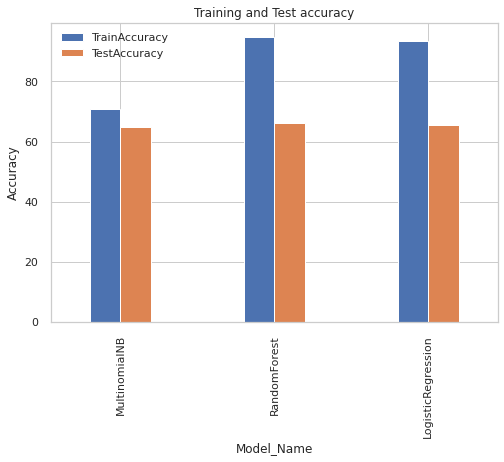

<Figure size 1080x720 with 0 Axes>

In [266]:
modecomparedf
modelCompare_countVect=modecomparedf.set_index('ModelName').rename_axis(None).T
modelCompare_countVect['Model_Name']=['MultinomialNB','RandomForest','LogisticRegression']
modelCompare_countVect
modelCompare_countVect.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.title('Training and Test accuracy')
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 

plt.show()

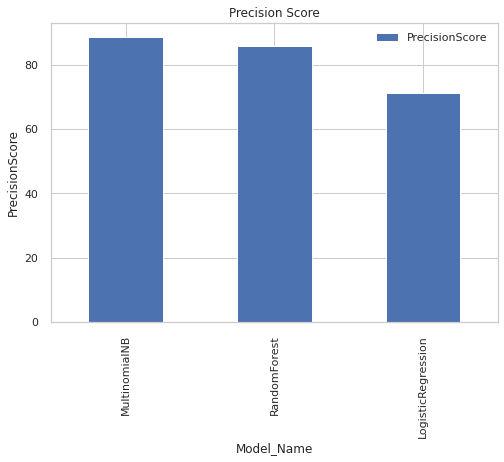

<Figure size 720x360 with 0 Axes>

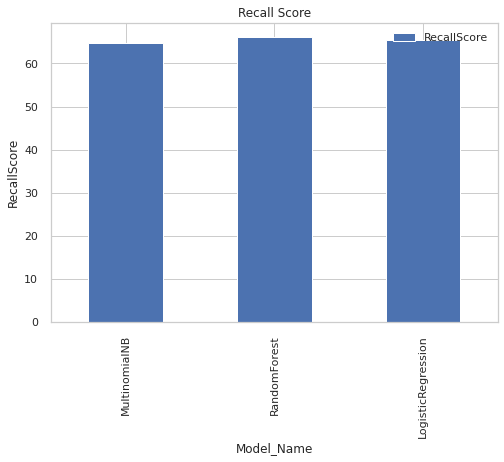

<Figure size 720x360 with 0 Axes>

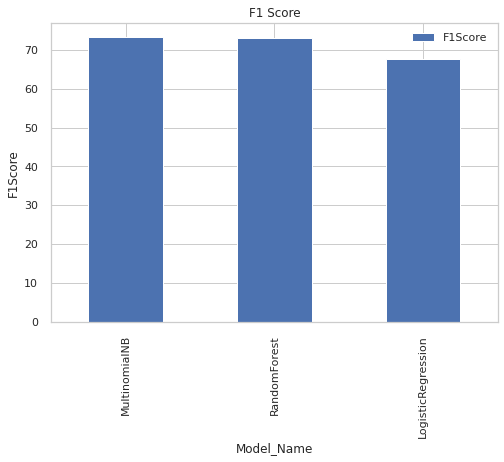

<Figure size 720x360 with 0 Axes>

In [267]:

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#,'F1Score']

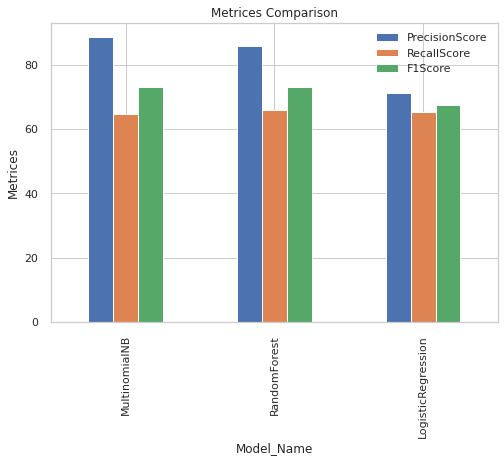

<Figure size 720x360 with 0 Axes>

In [268]:
modelCompare_countVect.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

###3.6.3.Sample classification report of ML  models

In [269]:


modellist={'Random Forest': RandomForestClassifier(random_state=3),
              'Multinomial Naive Bayes': MultinomialNB(),
              'Logistic Regression': LogisticRegression()}

In [270]:
def classification_Report(modellist):
    for k, item in modellist.items():
      item.fit(X_train_chi_count.toarray(), y_train_count)        
      y_pred = item.predict(X_test_chi_count.toarray())
      report = classification_report(y_test_count, y_pred)   
      print(k)    
      print(report)  
classification_Report(modellist)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Random Forest
              precision    recall  f1-score   support

           0       0.68      0.97      0.80       834
           1       0.00      0.00      0.00         5
           2       0.88      0.25      0.39        28
           3       0.00      0.00      0.00         4
           4       0.50      0.40      0.45        42
           5       0.78      0.41      0.54        34
           6       0.78      0.32      0.45        22
           7       1.00      0.17      0.29         6
           8       0.00      0.00      0.00        23
           9       1.00      0.94      0.97        16
          10       0.60      0.20      0.30        15
          11       0.67      0.22      0.33        45
          12       0.72      0.30      0.43        43
          13       0.00      0.00      0.00         8
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         2
          17 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Multinomial Naive Bayes
              precision    recall  f1-score   support

           0       0.66      0.99      0.79       834
           1       0.00      0.00      0.00         5
           2       1.00      0.07      0.13        28
           3       0.00      0.00      0.00         4
           4       0.45      0.40      0.43        42
           5       0.48      0.41      0.44        34
           6       0.62      0.36      0.46        22
           7       1.00      0.17      0.29         6
           8       0.00      0.00      0.00        23
           9       0.92      0.69      0.79        16
          10       0.47      0.47      0.47        15
          11       0.38      0.07      0.11        45
          12       0.52      0.26      0.34        43
          13       1.00      0.12      0.22         8
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         2
   

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



###3.6.4.Observations
We have fitted the transformed input with chi square selection to Random forest Logistic Regression and Multinomial Naive Bayes models and plotted the test train accuracy plot.

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to be very poor. Multinomial NB gives 70% training accuracy in the training dataset and 64% in the testing data which shows that it has less amount of overfit. So, for count vectorizer, multinomial NB gives better result in terms of accuracy. Whereas For precision, Random forest is the best. But it is observed that all the models have low recall.

##3.7.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for tfidf vectorizer

In [271]:

vectorizer = TfidfVectorizer()
vectorizer.fit(x_train_count)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [272]:
tfidf_tokens = vectorizer.get_feature_names()
print(tfidf_tokens)

['aa', 'aaa', 'aacbcc', 'aacount', 'aae', 'aao', 'aaplant', 'ab', 'abandon', 'abap', 'abb', 'abbc', 'abc', 'abca', 'abd', 'abdhtyu', 'abend', 'abende', 'abended', 'aber', 'abertura', 'abgebildet', 'abgeschlossen', 'abgrtyreu', 'abhanden', 'abhay', 'abhilfe', 'abholen', 'ability', 'abl', 'able', 'abode', 'abort', 'aborted', 'aborting', 'abovementioned', 'abrechnung', 'abreu', 'abrurto', 'absence', 'absender', 'absent', 'absolutely', 'abstechprogramdntym', 'abwfnzwbnvbw', 'ac', 'acache', 'acbccb', 'acc', 'acccount', 'accdb', 'acce', 'accede', 'accept', 'acceptance', 'accesible', 'acceso', 'access', 'accessed', 'accessibility', 'accessible', 'accessing', 'accesss', 'accident', 'accidental', 'accidentally', 'accidently', 'accompany', 'accomplish', 'accont', 'accord', 'accordance', 'accordingly', 'accound', 'account', 'accountant', 'accounting', 'accounts', 'accout', 'accross', 'accrual', 'accse', 'accsess', 'acct', 'accuracy', 'accurate', 'acd', 'ace', 'acess', 'acessos', 'acgyuna', 'ache'

###3.7.1.Try multiple models for transformed input with tfidf vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [273]:
X_train_tfidf = vectorizer.transform(x_train_count)
X_test_tfidf = vectorizer.transform(x_test_count)
X_train_tfidf.shape

(6800, 10330)

In [274]:
mclf = MultinomialNB().fit(X_train_tfidf, y_train_count)
data_m=predict_ml_model(mclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['MultinomialNB_TFIdf'] = data_m


accuracy 0.581764705882353
Training score: 56.205882352941174
Testing score: 58.1764705882353


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [275]:

rclf = RandomForestClassifier()
data_m=predict_ml_model(rclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['RandomForestClassifier_TFIdf'] = data_m


accuracy 0.6694117647058824
Training score: 94.86764705882354
Testing score: 66.94117647058823


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [276]:
sclf=LogisticRegression(n_jobs=1, C=1e5)
data_m=predict_ml_model(sclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['LogisticRegression_TFIdf'] = data_m


accuracy 0.6888235294117647
Training score: 94.6029411764706
Testing score: 68.88235294117648


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [277]:
lclf= SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)
data_m=predict_ml_model(lclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['SGDClassifier_TFIdf'] = data_m


accuracy 0.6511764705882352
Training score: 72.25
Testing score: 65.11764705882352


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###3.7.2.Comparison data frame of different machine learning models

In [278]:
modecomparedf_new=modecomparedf.drop(["MultinomialNB","RandomForest","LogisticRegression"], axis=1)
modecomparedf_new

,ModelName,MultinomialNB_TFIdf,RandomForestClassifier_TFIdf,LogisticRegression_TFIdf,SGDClassifier_TFIdf
0,TrainAccuracy,56.205882,94.867647,94.602941,72.250000
1,TestAccuracy,58.176471,66.941176,68.882353,65.117647
2,PrecisionScore,98.254740,87.509943,75.299586,86.974980
3,RecallScore,58.176471,66.941176,68.882353,65.117647
4,F1Score,72.396392,73.778066,71.122372,72.145036


In [279]:
modelCompare_TFIDFVect=modecomparedf_new.set_index('ModelName').rename_axis(None).T
modelCompare_TFIDFVect['Model_Name']=['MultinomialNB_TFIdf','RandomForest_TFIdf','LogisticR_TFIdf','SGD_TFIdf']


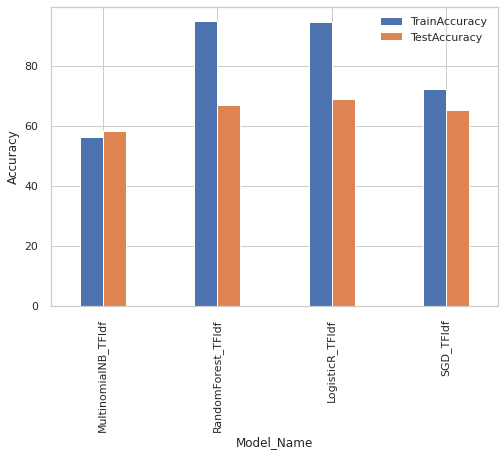

<Figure size 1080x720 with 0 Axes>

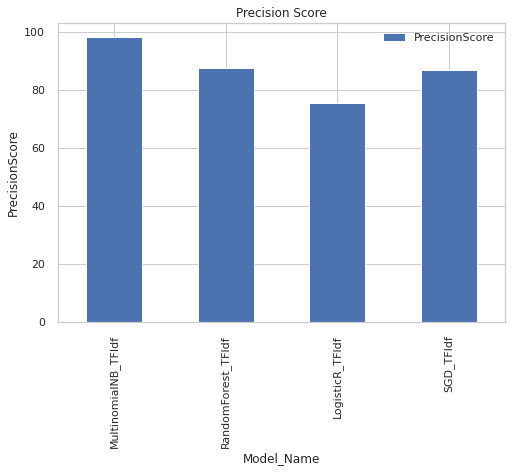

<Figure size 720x360 with 0 Axes>

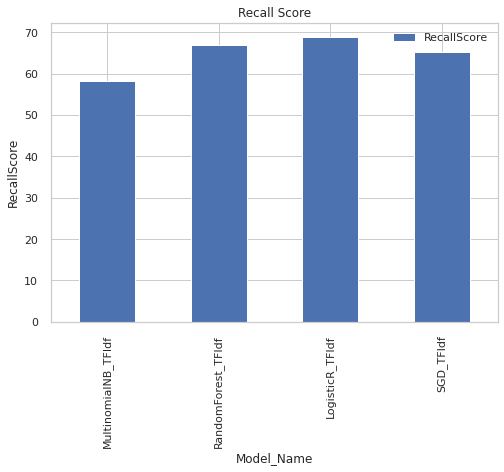

<Figure size 720x360 with 0 Axes>

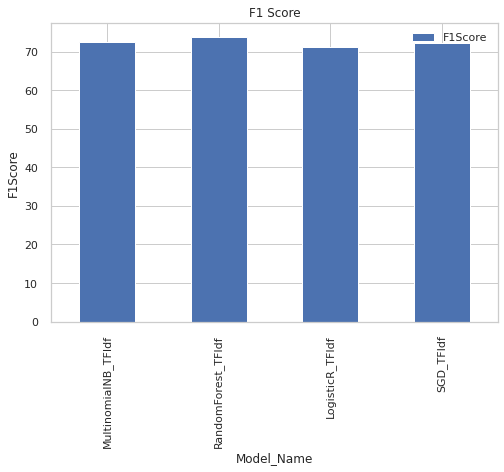

<Figure size 720x360 with 0 Axes>

In [280]:
#Accuracy plot
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 
plt.show()

#Precision plot
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#Recall plot

modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#F1 score

modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

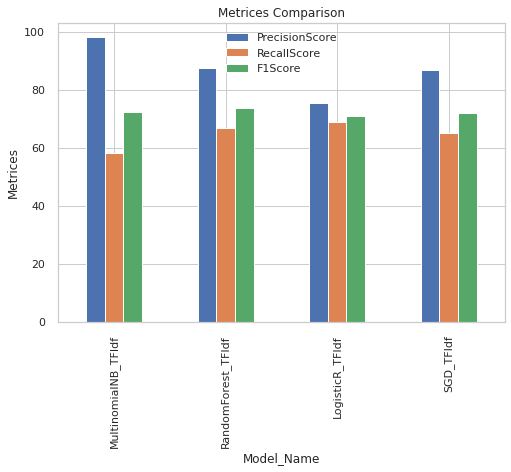

<Figure size 720x360 with 0 Axes>

In [281]:
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

###3.7.2.Comparison data frame of different machine learning models

We have fitted the transformed input  to Random forest Logistic Regression,SGD  and Multinomial Naive Bayes models and plotted the test train accuracy plot.

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to be very poor. SGD Classifier NB gives 73% training accuracy in the training dataset and 65% in the testing data which shows that it has less amount of overfit. So, for TF-IDF vectorizer, SGD Classifier gives better result in terms of accuracy. It is observed that all the models have low recall.

##3.8.Building a model architecture which can classify and trying different model architectures by researching state of the art for similar tasks for Pipeline with Count then TIDF vectorizer 

In [282]:
x_train_tfid, x_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"], finalticketsummary['Assignment group_num'], test_size=0.3,random_state=0)
                                                             
print(x_train_tfid.shape,x_test_tfidf.shape)
print(y_train_tfidf.shape,y_test_tfidf.shape)

(5950,) (2550,)
(5950,) (2550,)


In [283]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', MultinomialNB())])
#text_clf.fit(x_train_tfid, y_train_tfidf)

###3.8.1.Try multiple models for transformed input with Pipeline with Count then TIDF vectorizer  and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [284]:
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['MultinomialNB_CountandTFIdf'] = data_m

accuracy 0.5662745098039216
Training score: 56.11764705882353
Testing score: 56.627450980392155


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [285]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', LogisticRegression(n_jobs=1, C=1e5))])

In [286]:
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['LogisticRegression_CountandTFIdf'] = data_m

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



accuracy 0.6627450980392157
Training score: 94.82352941176471
Testing score: 66.27450980392156


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [287]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', RandomForestClassifier())])
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['RandomForestClassifier_CountandTFIdf'] = data_m

accuracy 0.6415686274509804
Training score: 94.92436974789916


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Testing score: 64.15686274509804


In [288]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None))])
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['SGDClassifier_CountandTFIdf'] = data_m

accuracy 0.6462745098039215
Training score: 72.6218487394958
Testing score: 64.62745098039215


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###3.8.2.Comparison data frame of different machine learning models

In [289]:
modecomparedf_pipe=modecomparedf.drop(["MultinomialNB","RandomForest","LogisticRegression","MultinomialNB_TFIdf","RandomForestClassifier_TFIdf","LogisticRegression_TFIdf","SGDClassifier_TFIdf"], axis=1)
modecomparedf_pipe

,ModelName,MultinomialNB_CountandTFIdf,LogisticRegression_CountandTFIdf,RandomForestClassifier_CountandTFIdf,SGDClassifier_CountandTFIdf
0,TrainAccuracy,56.117647,94.823529,94.924370,72.621849
1,TestAccuracy,56.627451,66.274510,64.156863,64.627451
2,PrecisionScore,97.895042,73.222735,86.720695,88.799106
3,RecallScore,56.627451,66.274510,64.156863,64.627451
4,F1Score,70.959219,68.435308,71.734852,72.933984


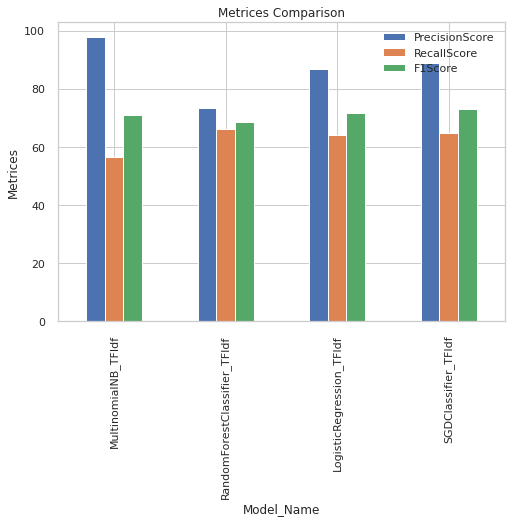

<Figure size 720x360 with 0 Axes>

In [290]:
modelCompare_Pipe=modecomparedf_pipe.set_index('ModelName').rename_axis(None).T
modelCompare_Pipe['Model_Name']=['MultinomialNB_TFIdf','RandomForestClassifier_TFIdf','LogisticRegression_TFIdf','SGDClassifier_TFIdf']

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

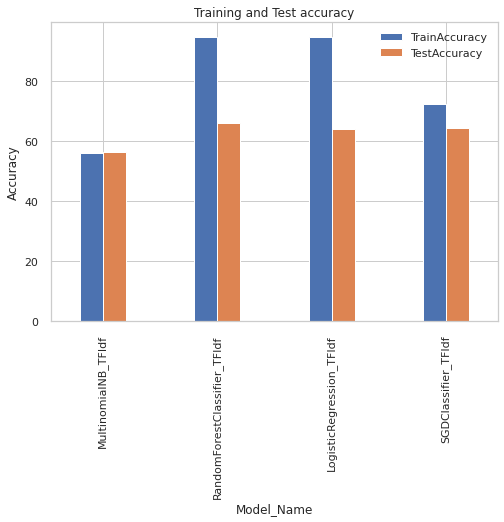

<Figure size 1080x720 with 0 Axes>

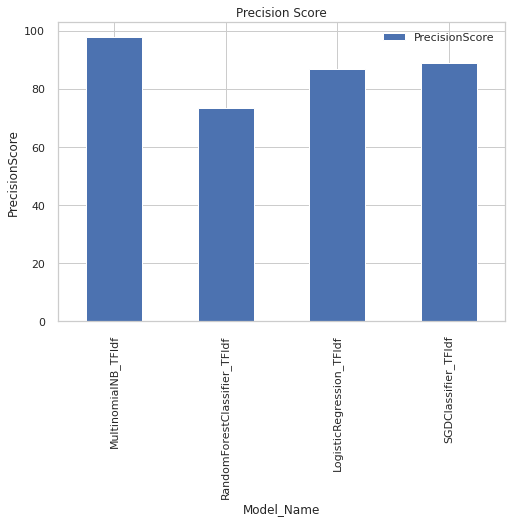

<Figure size 720x360 with 0 Axes>

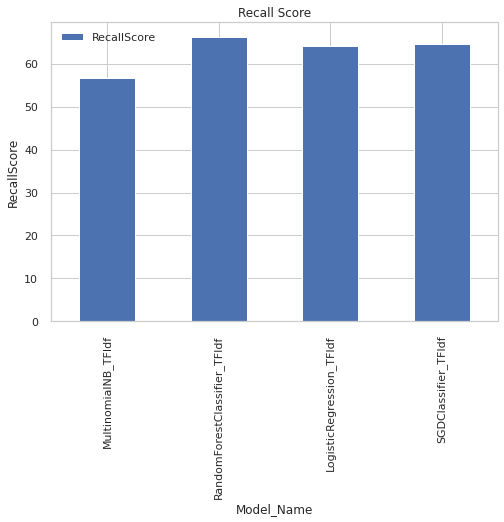

<Figure size 720x360 with 0 Axes>

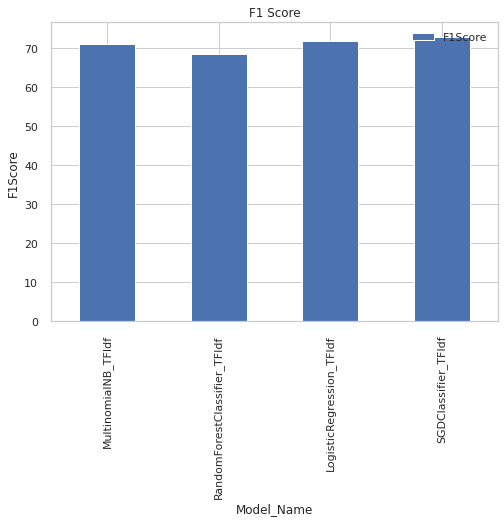

<Figure size 720x360 with 0 Axes>

In [291]:
modelCompare_Pipe.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.title('Training and Test accuracy')
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

###3.8.3.Observations
From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to be very poor. SGD Classifier NB gives 72% training accuracy in the training dataset and 64% in the testing data which shows that it has less amount of overfit. So, for Count and TF-IDF vectorizer, SGD Classifier gives better result in terms of accuracy. It is observed that all the models have low recall.

#4.Model building Deep learning model

#Top 5 Data

#Glove 100D

##4.1.Create the deep learning base model.

4.1.1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.

4.1.2.Tokenization and vocab creation

4.1.3.Base Model with categorical_crossentropy and adam optimizer

4.1.4. Prediction

4.1.5.Error Plot

4.1.6 Prediction block and classification report

4.1.7.Observation

##4.2.Create the same deep learning base model with drop out

##4.3.Create the deep learning base model with glove 100d weight matrix

4.3.1.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

4.3.2.Tokenization and vocab creation

4.3.3.Base Model with categorical_crossentropy and adam optimizer

4.3.4.Error Plot

4.3.5 Prediction block and classification report

4.3.6.Observation

##4.4.Create one layer bidirectional LSTM deep learning model with glove 100

4.4.1. Building of a model with one Embedding with glove 100d weight matrix, one bidirectional LSTM and one Dense layer  to check the accuracy.


4.4.2.Bi directional LSTM  Model with categorical_crossentropy and adam optimizer

4.4.3.Error Plot

4.4.4. Prediction block and classification report

4.4.5.Observation

##4.5.Create one layer bidirectional LSTM deep learning model with flatten and return sequence as True and glove 100 embedding

4.5.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True and one flatten and one Dense layer.


4.5.2.Model Description

4.5.3.Error Plot

4.5.4. Prediction block and classification report

4.5.5.Observation

##4.6.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 100 embedding and 3 dense layers

4.6.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.


4.6.2.Model Description

4.6.3.Error Plot

4.6.4. Prediction block and classification report

4.6.5.Observation


##4.7.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer

4.7.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer.


4.7.2.Model Description

4.7.3.Error Plot

4.7.4. Prediction block and classification report

4.7.5.Observation



##4.8.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

4..8.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

4.8.2.Model Description

4.8.3. Prediction block and classification report


4.8.5.Error Plot


4.8.6.Observation



Embedding index 

In [ ]:
finalticketsummary=finaldataset

In [ ]:
embeddings_index = {}
f = open(EMBEDDING_FILE)
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))


Found 400000 word vectors.


##4.1.Create the deep learning base model.

###4.1.1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.

In [ ]:
y = pd.get_dummies(finalticketsummary["Assignment group"]).values
y.shape
#Convert y to onehot encoded output

(5435, 5)

In [ ]:
y.shape

(5435, 5)

In [ ]:
y

array([[1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       ...,
       [0, 0, 1, 0, 0],
       [0, 0, 1, 0, 0],
       [1, 0, 0, 0, 0]], dtype=uint8)

In [ ]:
X_train_basic,X_test_basic,y_train_basic,y_test_basic = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)
#70:30 split

In [ ]:
print(y_test_basic.shape)
print(y_train_basic.shape)

(1631, 5)
(3804, 5)


In [ ]:
print(X_train_basic.shape)
print(X_test_basic.shape)

(3804,)
(1631,)


###4.1.2.Tokenization and vocab creation

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(finalticketsummary["CleanTextAfterRemoveStopword"])
word_index = tokenizer.word_index
vocab_size=len(word_index)+1
##Tokenize the words

In [ ]:
vocab_size

#Calculate vocab size

6743

In [ ]:
finalticketsummary["WordLength"] = finalticketsummary['CleanTextAfterRemoveStopword'].str.split().str.len()

Get max length of word

In [ ]:

finalticketsummary.sort_values(by='WordLength', ascending=False).head()

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword,Assignment group_num,WordLength
7445,GRP_12,security incident dsw suspicious ms rpc ms ds ...,"[security, incident, dsw, suspicious, ms, rpc,...",1,352
8490,GRP_0,stepfhryhan need access collaboration platform...,"[stepfhryhan, need, access, collaboration, pla...",0,232
2709,GRP_0,mobile device activation tsbnfixp numwqahj sen...,"[mobile, device, activation, tsbnfixp, numwqah...",0,227
6273,GRP_12,security incident dsw incident no suspicious m...,"[security, incident, dsw, incident, no, suspic...",1,220
6676,GRP_0,symantec endpoint encryption see agent roll eu...,"[symantec, endpoint, encryption, see, agent, r...",0,202


In [ ]:
sequences = tokenizer.texts_to_sequences(X_train_basic)
X_train_padded = pad_sequences(sequences, maxlen=352)
sequences = tokenizer.texts_to_sequences(X_test_basic)
X_test_padded=pad_sequences(sequences, maxlen=352)
X_test_padded.shape
#padd the input to have same size

(1631, 352)

In [ ]:
X_train_padded.shape

(3804, 352)

###4.1.3.Base Model with categorical_crossentropy and adam optimizer

###Model Description:

This model has 1 embedding layer 1 lstm layer with output 100 and return sequence as false and onse dense layer with output 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
embedding_vector_features=100
model=Sequential()
model.add(Embedding(vocab_size,embedding_vector_features,input_length=352))
model.add(LSTM(100,return_sequences=False))
model.add(Dense(5,activation='softmax'))
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 352, 100)          674300    
_________________________________________________________________
lstm (LSTM)                  (None, 100)               80400     
_________________________________________________________________
dense (Dense)                (None, 5)                 505       
Total params: 755,205
Trainable params: 755,205
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history=model.fit(X_train_padded,y_train_basic,validation_data=(X_test_padded,y_test_basic),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',min_delta=0.0001,patience=5)])

Epoch 1/30
39/39 [==============================] - 2s 50ms/step - loss: 1.0005 - accuracy: 0.7179 - val_loss: 0.6821 - val_accuracy: 0.7627
Epoch 2/30
39/39 [==============================] - 2s 41ms/step - loss: 0.4928 - accuracy: 0.8381 - val_loss: 0.4288 - val_accuracy: 0.8455
Epoch 3/30
39/39 [==============================] - 2s 40ms/step - loss: 0.3099 - accuracy: 0.8880 - val_loss: 0.3495 - val_accuracy: 0.8792
Epoch 4/30
39/39 [==============================] - 2s 41ms/step - loss: 0.2236 - accuracy: 0.9177 - val_loss: 0.3343 - val_accuracy: 0.8811
Epoch 5/30
39/39 [==============================] - 2s 41ms/step - loss: 0.1821 - accuracy: 0.9293 - val_loss: 0.3001 - val_accuracy: 0.8903
Epoch 6/30
39/39 [==============================] - 2s 40ms/step - loss: 0.1388 - accuracy: 0.9406 - val_loss: 0.3266 - val_accuracy: 0.8915
Epoch 7/30
39/39 [==============================] - 2s 40ms/step - loss: 0.1130 - accuracy: 0.9485 - val_loss: 0.2888 - val_accuracy: 0.9074
Epoch 8/30
39

In [ ]:
def groupname(prediction):
  if prediction == 0:
        prediction='Group_0'
        print (prediction)
  elif prediction == 1:
        prediction='Group_8'
        print (prediction)
  elif prediction==2:
        prediction='Group_24'
        print (prediction)
  elif prediction==3:
        prediction='Group_12'
        print (prediction)
  elif prediction==4:
        prediction='Group_9'
        print (prediction)

###4.1.4. Prediction

In [ ]:
features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
list[np.argmax(pred)]


[[9.9990022e-01 5.2180665e-05 6.5937229e-06 1.9324238e-05 2.1635287e-05]]


'Group_0'

In [ ]:
testval

[[11, 21, 151, 12, 217]]

In [ ]:
features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
list[np.argmax(pred)]


[[2.3502205e-03 5.8402391e-03 9.8937702e-01 6.6756166e-04 1.7649850e-03]]


'Group_24'

In [ ]:
testval

[[55, 121, 1083, 317, 958, 1761]]

###4.1.5.Error Plot

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

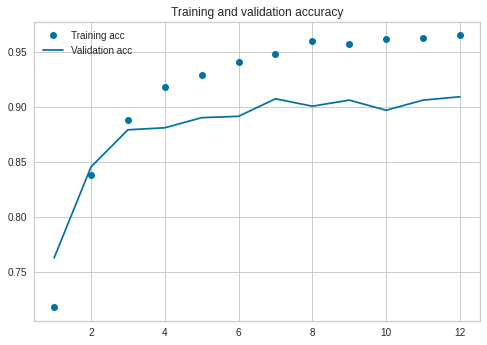

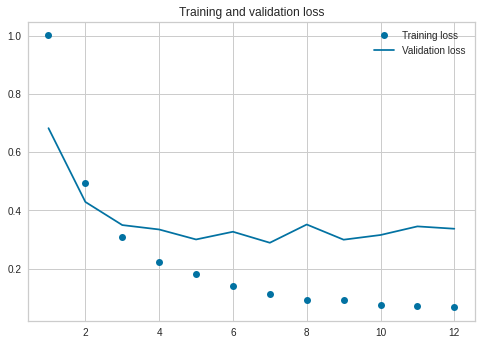

In [ ]:


epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###4.1.6 Prediction block and classification report

In [ ]:

features=["analysis not work run quote report show tool bar try open erp business give error launcher exit add register correctly"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["circuit outage india carrier company"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["usa file server hostname fail hard drive"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[0.00413338 0.01021876 0.00355903 0.02914483 0.95294404]]
Group_9
[[0.03210765 0.0308573  0.00981625 0.5926108  0.33460805]]
Group_8
[[3.3698737e-04 9.5811421e-01 8.9993188e-04 2.5189290e-02 1.5459565e-02]]
Group_12
51/51 - 0s
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1201
           1       0.74      0.51      0.60        77
           2       0.95      0.88      0.91        89
           3       0.75      0.90      0.82       190
           4       0.43      0.22      0.29        74

   micro avg       0.91      0.91      0.91      1631
   macro avg       0.77      0.70      0.72      1631
weighted avg       0.90      0.91      0.90      1631
 samples avg       0.91      0.91      0.91      1631



###4.1.7.Observation

We can observe that there are 755,205 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 11 epochs comes with 96 in train and 90 in test which has a larger overfit and to less training loss compare to validation loss.

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came poor for 5th highest group among top 5 ,so compare to machine learning model where 2 gropus had poor f1 here only one group but due to large overfit we cannot select this model.

##4.2.Create the same deep learning base model with drop out

In [ ]:
embedding_vector_features=100
modelr=Sequential()
modelr.add(Embedding(vocab_size,embedding_vector_features,input_length=352))
modelr.add(LSTM(100,return_sequences=False))
modelr.add(Dropout(0.2))
modelr.add(Dense(5,activation='softmax'))
modelr.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(modelr.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 505       
Total params: 755,205
Trainable params: 755,205
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history=modelr.fit(X_train_padded,y_train_basic,validation_data=(X_test_padded,y_test_basic),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',min_delta=0.0001,patience=5)])

Epoch 1/30
39/39 [==============================] - 2s 48ms/step - loss: 1.0276 - accuracy: 0.7108 - val_loss: 0.7610 - val_accuracy: 0.7364
Epoch 2/30
39/39 [==============================] - 1s 38ms/step - loss: 0.5640 - accuracy: 0.8226 - val_loss: 0.4231 - val_accuracy: 0.8430
Epoch 3/30
39/39 [==============================] - 1s 38ms/step - loss: 0.3282 - accuracy: 0.8822 - val_loss: 0.4093 - val_accuracy: 0.8645
Epoch 4/30
39/39 [==============================] - 1s 38ms/step - loss: 0.2665 - accuracy: 0.9083 - val_loss: 0.3121 - val_accuracy: 0.8964
Epoch 5/30
39/39 [==============================] - 1s 38ms/step - loss: 0.1821 - accuracy: 0.9327 - val_loss: 0.3123 - val_accuracy: 0.9031
Epoch 6/30
39/39 [==============================] - 1s 38ms/step - loss: 0.1451 - accuracy: 0.9422 - val_loss: 0.2890 - val_accuracy: 0.9044
Epoch 7/30
39/39 [==============================] - 1s 38ms/step - loss: 0.1183 - accuracy: 0.9506 - val_loss: 0.2881 - val_accuracy: 0.9068
Epoch 8/30
39

In [ ]:
features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelr.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
list[np.argmax(pred)]


[[9.9984145e-01 7.1105627e-05 3.2362423e-05 2.1557198e-05 3.3500583e-05]]


'Group_0'

In [ ]:
features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelr.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
list[np.argmax(pred)]


[[2.6733417e-03 2.2491664e-03 9.9212146e-01 7.1236124e-04 2.2437267e-03]]


'Group_24'

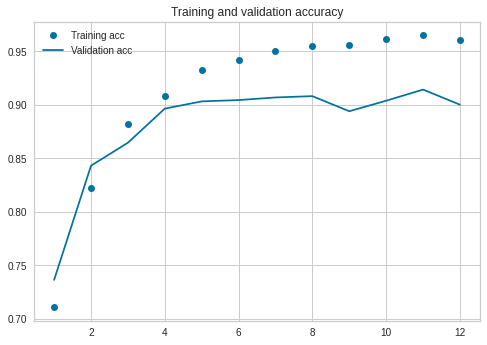

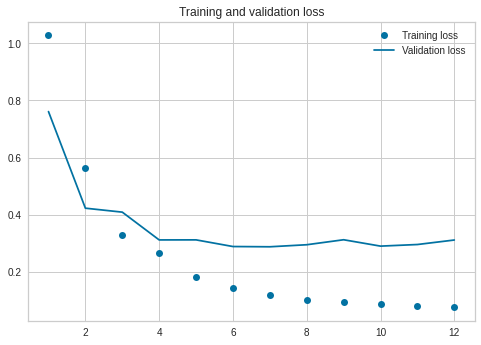

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:

y_probs = modelr.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

51/51 - 0s
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1194
           1       0.60      0.77      0.67        74
           2       0.88      0.84      0.86        90
           3       0.77      0.93      0.84       200
           4       0.57      0.05      0.10        73

   micro avg       0.91      0.91      0.91      1631
   macro avg       0.76      0.71      0.69      1631
weighted avg       0.90      0.91      0.90      1631
 samples avg       0.91      0.91      0.91      1631



In [ ]:
features=["analysis not work run quote report show tool bar try open erp business give error launcher exit add register correctly"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelr.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["circuit outage india carrier company"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelr.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["usa file server hostname fail hard drive"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelr.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

[[0.00413338 0.01021876 0.00355903 0.02914483 0.95294404]]
Group_9
[[0.03210765 0.0308573  0.00981625 0.5926108  0.33460805]]
Group_8
[[3.3698737e-04 9.5811421e-01 8.9993188e-04 2.5189290e-02 1.5459565e-02]]
Group_12


###Observations:

We can observe that there are 755,205 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 12 epochs comes with 96 in train and 90 in test which has a large overfit but the overfit is reduced with respect to previous model

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came very poor for 5th and 2nd highest group among top 5 and  same result with dropout so  we cannot select this model for above reason


##4.3.Create the deep learning base model with 1 LSTM layer and Glove 100 embedding matrix

###4.3.1.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

###4.3.2.Tokenization and vocab creation

In [ ]:
embedding_dim = 100
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < vocab_size:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

Padding

In [ ]:
def padd_sequence(X_train_Glove,X_test_Glove):
  sequences = tokenizer.texts_to_sequences(X_train_Glove)
  X_train_padded_Glove = pad_sequences(sequences, maxlen=352)
  sequences = tokenizer.texts_to_sequences(X_test_Glove)
  X_test_padded_Glove=pad_sequences(sequences, maxlen=352)
  print(X_test_padded_Glove.shape,X_train_padded_Glove.shape)
  return X_train_padded_Glove,X_test_padded_Glove


In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.3.3.Base Model with weight matrix and categorical_crossentropy and adam optimizer

###Model Description:

This model has 1 embedding layer with weight matrix of glove 100, 1 lstm layer with output 128 and return sequence as false and one dense layer with output 5 and softmax activation , as 5 groups are there for prediction.
Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model1 = Sequential()
model1.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
model1.add(LSTM(128, return_sequences=False))
model1.add(Dense(5, activation='softmax'))
model1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model1.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
lstm_2 (LSTM)                (None, 128)               117248    
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 645       
Total params: 792,193
Trainable params: 792,193
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history1=model1.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=10,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/10
39/39 [==============================] - 2s 48ms/step - loss: 0.7614 - accuracy: 0.7608 - val_loss: 0.4555 - val_accuracy: 0.8461
Epoch 2/10
39/39 [==============================] - 2s 40ms/step - loss: 0.4111 - accuracy: 0.8596 - val_loss: 0.3491 - val_accuracy: 0.8945
Epoch 3/10
39/39 [==============================] - 2s 41ms/step - loss: 0.2901 - accuracy: 0.8956 - val_loss: 0.3638 - val_accuracy: 0.8663
Epoch 4/10
39/39 [==============================] - 2s 40ms/step - loss: 0.2487 - accuracy: 0.9056 - val_loss: 0.2702 - val_accuracy: 0.8970
Epoch 5/10
39/39 [==============================] - 2s 41ms/step - loss: 0.1880 - accuracy: 0.9246 - val_loss: 0.2479 - val_accuracy: 0.9129
Epoch 6/10
39/39 [==============================] - 2s 40ms/step - loss: 0.1519 - accuracy: 0.9356 - val_loss: 0.2342 - val_accuracy: 0.9001
Epoch 7/10
39/39 [==============================] - 2s 40ms/step - loss: 0.1284 - accuracy: 0.9453 - val_loss: 0.2401 - val_accuracy: 0.9037
Epoch 8/10
39

###4.3.4.Error Plot

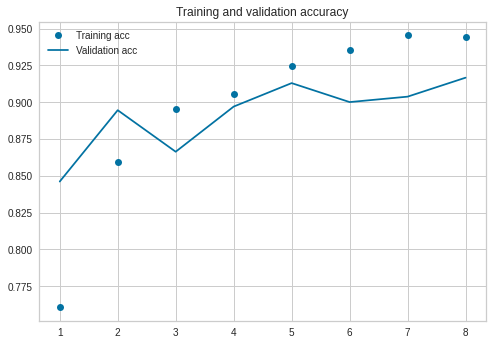

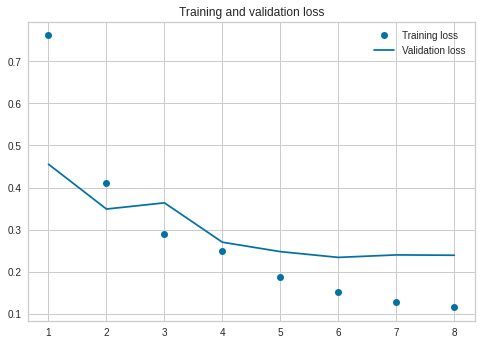

In [ ]:
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###4.3.5 Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["analysis not work run quote report show tool bar try open erp business give error launcher exit add register correctly"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["circuit outage india carrier company"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["usa file server hostname fail hard drive"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model1.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9981254e-01 5.8077159e-05 1.2360166e-05 8.2303995e-05 3.4804369e-05]]
Group_0
[[3.0572072e-03 1.7092940e-03 9.9321365e-01 3.5595472e-04 1.6638638e-03]]
Group_24
[[0.00413338 0.01021876 0.00355903 0.02914483 0.95294404]]
Group_9
[[0.03210765 0.0308573  0.00981625 0.5926108  0.33460805]]
Group_8
[[3.3698737e-04 9.5811421e-01 8.9993188e-04 2.5189290e-02 1.5459565e-02]]
Group_12
51/51 - 0s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1201
           1       0.79      0.87      0.83        77
           2       0.97      0.97      0.97        89
           3       0.76      0.96      0.85       190
           4       0.88      0.20      0.33        74

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.88      0.80      0.79      1631
weighted avg       0.95      0.94      0.93      1631
 samples avg       0.94      0.94      0.94      1631



###4.3.6.Observation
We can observe that there are 792193 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 8 epochs comes with 94 in train and 91 in test which has a overfit.

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came bad for the 5th highest groups and also  due to large overfit we cannot select this model.


##4.4.Create one layer bidirectional LSTM deep learning model with glove 100


###4.4.1. Building of a model with one Embedding with glove 100d weight matrix, one bidirectional LSTM and one Dense layer  to check the accuracy.

In [ ]:
X_train_Glove_bi,X_test_Glove_bi,y_train_Glove_bi,y_test_Glove_bi = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_bi_padded,X_test_Glove_bi_padded=padd_sequence(X_train_Glove_bi,X_test_Glove_bi)

(1631, 352) (3804, 352)


In [ ]:
X_train_Glove_bi_padded.shape

(3804, 352)

###4.4.2.Bi directional LSTM  Model with categorical_crossentropy and adam optimizer

###Model Description
This model has 1 embedding layer with glove 100d weight matrix, 1 Bi directional lstm layer with output 128 and return sequence as false and one dense layer with output 5 as 5 groups are there for prediction with soft max in dense layer as activation

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy


In [ ]:
from tensorflow.keras.layers import LSTM, Embedding, Dense, Dropout, Bidirectional

model2 = Sequential()
model2.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
#model2.add(Dropout(0.1))
model2.add(Bidirectional(LSTM(128, return_sequences=False)))
model2.add(Dense(5, activation='softmax'))

model2.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model2.summary())

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 256)               234496    
_________________________________________________________________
dense_4 (Dense)              (None, 5)                 1285      
Total params: 910,081
Trainable params: 910,081
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history2=model2.fit(X_train_Glove_bi_padded,y_train_Glove_bi,validation_data=(X_test_Glove_bi_padded,y_test_Glove_bi),epochs=10,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/10
39/39 [==============================] - 3s 81ms/step - loss: 0.8046 - accuracy: 0.7542 - val_loss: 0.5048 - val_accuracy: 0.8363
Epoch 2/10
39/39 [==============================] - 3s 67ms/step - loss: 0.4224 - accuracy: 0.8507 - val_loss: 0.3700 - val_accuracy: 0.8909
Epoch 3/10
39/39 [==============================] - 3s 68ms/step - loss: 0.2959 - accuracy: 0.8988 - val_loss: 0.2846 - val_accuracy: 0.8939
Epoch 4/10
39/39 [==============================] - 3s 68ms/step - loss: 0.2210 - accuracy: 0.9114 - val_loss: 0.2716 - val_accuracy: 0.9099
Epoch 5/10
39/39 [==============================] - 3s 67ms/step - loss: 0.1961 - accuracy: 0.9217 - val_loss: 0.2516 - val_accuracy: 0.9086
Epoch 6/10
39/39 [==============================] - 3s 67ms/step - loss: 0.1476 - accuracy: 0.9385 - val_loss: 0.2487 - val_accuracy: 0.9142
Epoch 7/10
39/39 [==============================] - 3s 67ms/step - loss: 0.1505 - accuracy: 0.9356 - val_loss: 0.2851 - val_accuracy: 0.9031
Epoch 8/10
39

###4.4.3.Error Plot

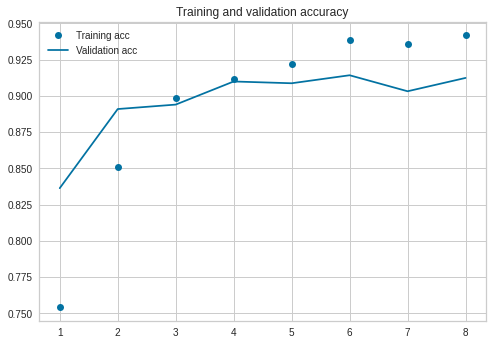

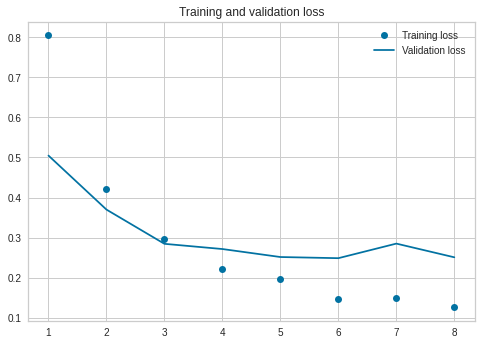

In [ ]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###4.4.4. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model2.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model2.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["analysis not work run quote report show tool bar try open erp business give error launcher exit add register correctly"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model2.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["circuit outage india carrier company"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model2.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["usa file server hostname fail hard drive"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model2.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model2.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9781883e-01 1.6591271e-03 1.7821304e-04 1.5166141e-04 1.9221430e-04]]
Group_0
[[0.01028503 0.00698364 0.9736177  0.00657778 0.0025359 ]]
Group_24
[[0.0254306  0.16864496 0.00077824 0.15146501 0.65368116]]
Group_9
[[0.27506718 0.03691607 0.05725357 0.61483693 0.01592616]]
Group_8
[[0.00645555 0.9352032  0.00408375 0.05036519 0.00389235]]
Group_12
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1201
           1       0.81      0.88      0.84        77
           2       1.00      0.94      0.97        89
           3       0.75      0.95      0.84       190
           4       0.88      0.20      0.33        74

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.89      0.79      0.79      1631
weighted avg       0.95      0.94      0.93      1631
 samples avg       0.94      0.94      0.94      1631



###4.4.5.Observation
We can observe that there are 910,081 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 8 epochs comes with 94 in train and 91 in test which has a overfit and too less training loss compare to validation loss.

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came poor for 5th highest group among top 5 along with that due to  large overfit we cannot select this model.


##4.5.Create one layer bidirectional LSTM deep learning model with flatten and return sequence as True and glove 100 embedding

###4.5.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True and one flatten and one Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.5.2.Model Description

This model has 1 embedding layer with glov 100d 1 bi directional lstm layer with output 128 and return sequence as true, one flatten layer  and one dense layer with output 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy


In [ ]:
from keras.layers import TimeDistributed
from keras.models import Sequential 
from keras.layers import Activation, Dense, Flatten 

model13 = Sequential()
model13.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
model13.add(Bidirectional(LSTM(128, return_sequences=True)))
model13.add(Flatten())
model13.add(Dense(5, activation='softmax'))
model13.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model13.summary())

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
bidirectional_2 (Bidirection (None, 352, 256)          234496    
_________________________________________________________________
flatten (Flatten)            (None, 90112)             0         
_________________________________________________________________
dense_5 (Dense)              (None, 5)                 450565    
Total params: 1,359,361
Trainable params: 1,359,361
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history13=model13.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=10,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/10
39/39 [==============================] - 3s 82ms/step - loss: 0.6625 - accuracy: 0.8007 - val_loss: 0.4550 - val_accuracy: 0.8302
Epoch 2/10
39/39 [==============================] - 3s 69ms/step - loss: 0.3214 - accuracy: 0.8899 - val_loss: 0.3562 - val_accuracy: 0.8774
Epoch 3/10
39/39 [==============================] - 3s 69ms/step - loss: 0.2220 - accuracy: 0.9180 - val_loss: 0.3240 - val_accuracy: 0.8945
Epoch 4/10
39/39 [==============================] - 3s 68ms/step - loss: 0.1790 - accuracy: 0.9311 - val_loss: 0.3198 - val_accuracy: 0.8945
Epoch 5/10
39/39 [==============================] - 3s 68ms/step - loss: 0.1292 - accuracy: 0.9445 - val_loss: 0.3324 - val_accuracy: 0.8909
Epoch 6/10
39/39 [==============================] - 3s 68ms/step - loss: 0.1043 - accuracy: 0.9503 - val_loss: 0.3339 - val_accuracy: 0.9025


###4.5.3.Error Plot

In [ ]:
def plot_acc(history2):
  acc = history2.history['accuracy']
  val_acc = history2.history['val_accuracy']

  loss = history2.history['loss']
  val_loss = history2.history['val_loss']
  epochs = range(1, len(acc) + 1)

  plt.plot(epochs, acc, 'bo', label='Training acc')
  plt.plot(epochs, val_acc, 'b', label='Validation acc')
  plt.title('Training and validation accuracy')
  plt.legend()

  plt.figure()

  plt.plot(epochs, loss, 'bo', label='Training loss')
  plt.plot(epochs, val_loss, 'b', label='Validation loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

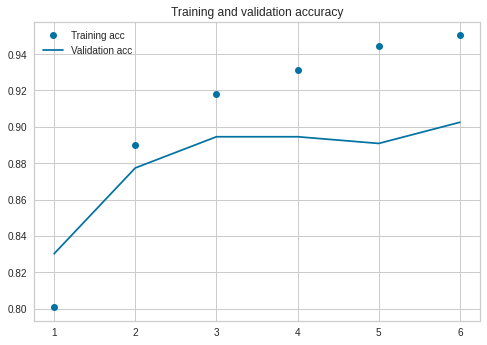

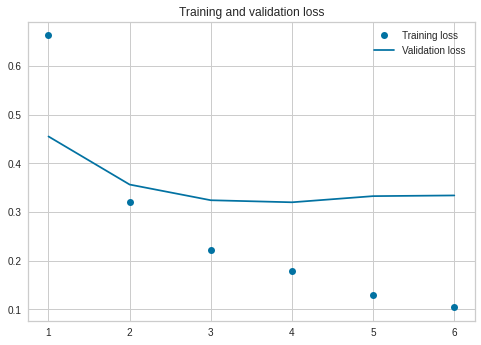

In [ ]:
plot_acc(history13)

###4.5.4. Prediction block and classification report

In [ ]:


features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model13.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model13.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

features=["analysis not work run quote report show tool bar try open erp business give error launcher exit add register correctly"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model13.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])




y_probs = model13.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9951470e-01 1.9155235e-04 1.1624792e-05 2.2662511e-05 2.5936886e-04]]
Group_0
[[0.0017915  0.00175925 0.989513   0.00124688 0.00568954]]
Group_24
[[1.7151229e-01 1.3517665e-02 3.6395938e-04 8.4765983e-04 8.1375849e-01]]
Group_9
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1201
           1       0.96      0.88      0.92        77
           2       0.97      0.98      0.97        89
           3       0.76      0.97      0.85       190
           4       0.88      0.20      0.33        74

   micro avg       0.95      0.95      0.95      1631
   macro avg       0.91      0.81      0.81      1631
weighted avg       0.95      0.95      0.94      1631
 samples avg       0.95      0.95      0.95      1631



###4.5.5.Observation

We can observe that there are 1,359,361 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 8 epochs with early stopping comes with 95 in train and 90 in test which has a larger overfit and to less training loss compare to validation loss.

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came low for 5th highest group  and also due to large overfit we cannot select this model


##4.6.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 100 embedding and 3 dense layers

###4.6.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

In [ ]:
X_train_Glove_bi,X_test_Glove_bi,y_train_Glove_bi,y_test_Glove_bi = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_bi_padded,X_test_Glove_bi_padded=padd_sequence(X_train_Glove_bi,X_test_Glove_bi)

(1631, 352) (3804, 352)


In [ ]:
from keras.layers import Dense, Input,  Embedding, Dropout, Activation, Flatten, Bidirectional, GlobalMaxPool1D

###4.6.2.Model Description

This model has 1 embedding layer with glove 100d embedding and  1 bidirectional lstm layer with output 128 and return sequence as true and one globalmaxpool1D layer and 3  dense layers  with final layer having output as 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy


In [ ]:
model4 = Sequential()
model4.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix]))
model4.add(Bidirectional(LSTM(units=128 , return_sequences = True)))
model4.add(GlobalMaxPool1D())
model4.add(Dense(100, activation="relu"))
#model4.add(Dropout(0.5))
model4.add(Dense(80, activation="relu"))
#model4.add(Dropout(0.5))
model4.add(Dense(5, activation="softmax"))
model4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
print(model4.summary())

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, None, 100)         674300    
_________________________________________________________________
bidirectional_2 (Bidirection (None, None, 256)         234496    
_________________________________________________________________
global_max_pooling1d (Global (None, 256)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               25700     
_________________________________________________________________
dense_6 (Dense)              (None, 80)                8080      
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 405       
Total params: 942,981
Trainable params: 942,981
Non-trainable params: 0
________________________________________________

In [ ]:
history4=model4.fit(X_train_Glove_bi_padded,y_train_Glove_bi,validation_data=(X_test_Glove_bi_padded,y_test_Glove_bi),epochs=10,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/10
39/39 [==============================] - 3s 86ms/step - loss: 0.7936 - accuracy: 0.7723 - val_loss: 0.4695 - val_accuracy: 0.8565
Epoch 2/10
39/39 [==============================] - 3s 70ms/step - loss: 0.3845 - accuracy: 0.8696 - val_loss: 0.3044 - val_accuracy: 0.8909
Epoch 3/10
39/39 [==============================] - 3s 70ms/step - loss: 0.2470 - accuracy: 0.9069 - val_loss: 0.2388 - val_accuracy: 0.9074
Epoch 4/10
39/39 [==============================] - 3s 70ms/step - loss: 0.1798 - accuracy: 0.9261 - val_loss: 0.2481 - val_accuracy: 0.9086
Epoch 5/10
39/39 [==============================] - 3s 69ms/step - loss: 0.1322 - accuracy: 0.9437 - val_loss: 0.2951 - val_accuracy: 0.9074
Epoch 6/10
39/39 [==============================] - 3s 69ms/step - loss: 0.1131 - accuracy: 0.9493 - val_loss: 0.2473 - val_accuracy: 0.9086
Epoch 7/10
39/39 [==============================] - 3s 69ms/step - loss: 0.0957 - accuracy: 0.9532 - val_loss: 0.2482 - val_accuracy: 0.9105
Epoch 8/10
39

###4.6.3.Error Plot

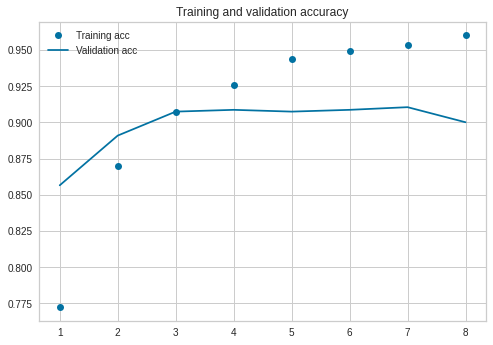

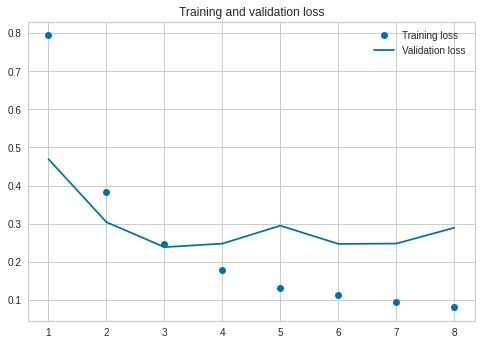

In [ ]:
plot_acc(history4)

###4.6.4. Prediction block and classification report


In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model4.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model4.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model4.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9999762e-01 1.4118532e-06 6.2388182e-08 8.0040530e-11 8.6592678e-07]]
Group_0
[[5.0778495e-04 2.5379696e-04 9.9918252e-01 4.3070060e-05 1.2752812e-05]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1194
           1       0.87      0.96      0.91        74
           2       0.98      0.92      0.95        90
           3       1.00      0.66      0.79       200
           4       0.51      0.90      0.65        73

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.87      0.89      0.86      1631
weighted avg       0.96      0.94      0.94      1631
 samples avg       0.94      0.94      0.94      1631



###4.6.5.Observation


We can observe that there are 942,981 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 8 epochs with early stopping comes with 96 in train and 90 in test which has a larger overfit and to less training loss compare to validation loss.

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came not well for 4th and 5th highest group and  due to large overfit we cannot select this model


##4.7.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer

###4.7.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.7.2.Model Description
This model has 1 embedding layer 2 bidirectional LSTM layers  with weight matrix as glove 100  and return sequence as True and one flatten and one dense layer with output 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy


In [ ]:
model007 = Sequential()
model007.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
model007.add(Bidirectional(LSTM(128, return_sequences=True)))
model007.add(Bidirectional(LSTM(128, return_sequences=True)))
model007.add(Flatten())
model007.add(Dense(5,activation='softmax'))
model007.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model007.summary())

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_7 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
bidirectional_5 (Bidirection (None, 352, 256)          234496    
_________________________________________________________________
bidirectional_6 (Bidirection (None, 352, 256)          394240    
_________________________________________________________________
flatten_2 (Flatten)          (None, 90112)             0         
_________________________________________________________________
dense_9 (Dense)              (None, 5)                 450565    
Total params: 1,753,601
Trainable params: 1,753,601
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history007=model007.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=10,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/10
39/39 [==============================] - 6s 162ms/step - loss: 0.6764 - accuracy: 0.8031 - val_loss: 0.5167 - val_accuracy: 0.8418
Epoch 2/10
39/39 [==============================] - 5s 134ms/step - loss: 0.3600 - accuracy: 0.8809 - val_loss: 0.3397 - val_accuracy: 0.8676
Epoch 3/10
39/39 [==============================] - 5s 134ms/step - loss: 0.2684 - accuracy: 0.9012 - val_loss: 0.2888 - val_accuracy: 0.9001
Epoch 4/10
39/39 [==============================] - 5s 134ms/step - loss: 0.2109 - accuracy: 0.9196 - val_loss: 0.2672 - val_accuracy: 0.9025
Epoch 5/10
39/39 [==============================] - 5s 134ms/step - loss: 0.1503 - accuracy: 0.9364 - val_loss: 0.2933 - val_accuracy: 0.8921
Epoch 6/10
39/39 [==============================] - 5s 134ms/step - loss: 0.1190 - accuracy: 0.9485 - val_loss: 0.3163 - val_accuracy: 0.9001
Epoch 7/10
39/39 [==============================] - 5s 134ms/step - loss: 0.0993 - accuracy: 0.9561 - val_loss: 0.3695 - val_accuracy: 0.8964
Epoch 

###4.7.3.Error Plot

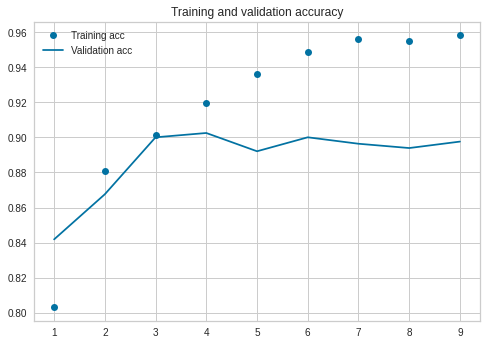

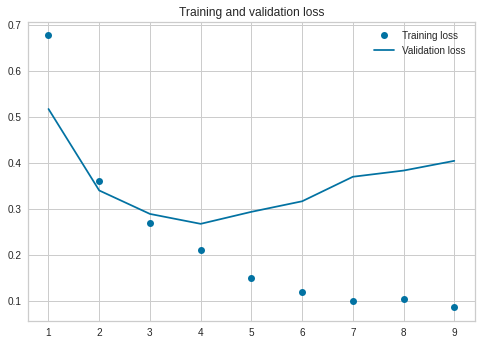

In [ ]:
plot_acc(history007)

###4.7.4. Prediction block and classification report

In [ ]:


features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model007.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model007.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model007.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9999869e-01 9.7070631e-07 4.8370254e-08 8.7049607e-08 2.7455670e-07]]
Group_0
[[2.9741391e-04 8.6993753e-04 9.9757141e-01 9.2027348e-04 3.4092428e-04]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1194
           1       0.97      0.86      0.91        74
           2       1.00      0.92      0.96        90
           3       0.77      0.99      0.87       200
           4       0.88      0.19      0.31        73

   micro avg       0.95      0.95      0.95      1631
   macro avg       0.92      0.79      0.81      1631
weighted avg       0.96      0.95      0.94      1631
 samples avg       0.95      0.95      0.95      1631



###4.7.5.Observation

We can observe that there are 1,753,601 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 10 epochs comes with 95 in train and 89 in test which has a larger overfit and to less training loss compare to validation loss.

The error plot also explains the overfit.

If we see the classification report we can see the f1 score came bad for 5th highest group and  due to large overfit we cannot select this model.




##4.8.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

###4.8.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.8.2.Model Description

This model has 1 embedding layer 2 bidirectional LSTM layers  with weight matrix as glove 100  and return sequence as True and one flatten and one dense layer with 1 drop out layer and 1 spatial drop out layer .

Drop out we have used 0.3 and spatial drop out as 0.4

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import Activation, Dense, Flatten, Dropout, Bidirectional, SpatialDropout1D
model009 = Sequential()
model009.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
model009.add(SpatialDropout1D(0.4))
model009.add(Bidirectional(LSTM(128, return_sequences=True)))
model009.add(Dropout(0.3))
model009.add(Bidirectional(LSTM(128, return_sequences=True)))
model009.add(Flatten())
model009.add(Dense(5,activation='softmax'))
model009.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model009.summary())

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_9 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
spatial_dropout1d_1 (Spatial (None, 352, 100)          0         
_________________________________________________________________
bidirectional_9 (Bidirection (None, 352, 256)          234496    
_________________________________________________________________
dropout_2 (Dropout)          (None, 352, 256)          0         
_________________________________________________________________
bidirectional_10 (Bidirectio (None, 352, 256)          394240    
_________________________________________________________________
flatten_4 (Flatten)          (None, 90112)             0         
_________________________________________________________________
dense_11 (Dense)             (None, 5)                

In [ ]:
history009=model009.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=10,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/10
39/39 [==============================] - 6s 163ms/step - loss: 0.7149 - accuracy: 0.7818 - val_loss: 0.4511 - val_accuracy: 0.8479
Epoch 2/10
39/39 [==============================] - 5s 135ms/step - loss: 0.4285 - accuracy: 0.8554 - val_loss: 0.4824 - val_accuracy: 0.8387
Epoch 3/10
39/39 [==============================] - 5s 136ms/step - loss: 0.3383 - accuracy: 0.8883 - val_loss: 0.3524 - val_accuracy: 0.9019
Epoch 4/10
39/39 [==============================] - 5s 137ms/step - loss: 0.2841 - accuracy: 0.9033 - val_loss: 0.3064 - val_accuracy: 0.8866
Epoch 5/10
39/39 [==============================] - 5s 138ms/step - loss: 0.2437 - accuracy: 0.9054 - val_loss: 0.3169 - val_accuracy: 0.9050
Epoch 6/10
39/39 [==============================] - 5s 137ms/step - loss: 0.2258 - accuracy: 0.9114 - val_loss: 0.2694 - val_accuracy: 0.9086
Epoch 7/10
39/39 [==============================] - 5s 138ms/step - loss: 0.1796 - accuracy: 0.9246 - val_loss: 0.2633 - val_accuracy: 0.9025
Epoch 

###4.8.3. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model009.predict(padded_texts)
print(testval)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
print(testval)
pred = model009.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model009.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[11, 21, 151, 12, 217]]
[[9.9991703e-01 4.4488665e-05 1.0119907e-05 5.3591643e-06 2.3004055e-05]]
Group_0
[[55, 121, 1083, 317, 958, 1761]]
[[4.5993220e-04 7.7197992e-04 9.9855107e-01 9.8468750e-05 1.1855428e-04]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1194
           1       0.86      0.93      0.90        74
           2       0.98      0.99      0.98        90
           3       0.97      0.64      0.77       200
           4       0.48      0.88      0.62        73

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.86      0.88      0.85      1631
weighted avg       0.96      0.94      0.94      1631
 samples avg       0.94      0.94      0.94      1631



###4.8.4. Save model

In [ ]:
model009.save("/content/drive/My Drive/model009.h5")

###4.8.5.Error Plot

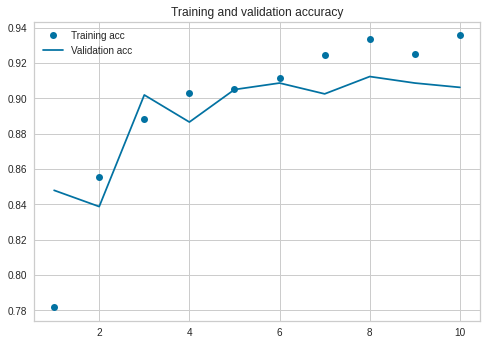

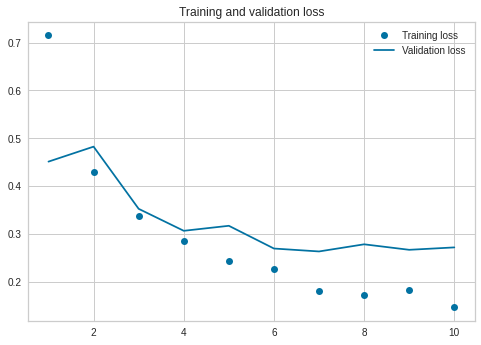

In [ ]:
plot_acc(history009)

###4.8.5.Observation

We can observe that there are 1,753,601 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 10 epochs comes with 93 in train and 90 in test which has a less overfit compare to all other models and one of the best performance we got.

The error plot is comparatively well

If we see the classification report we can see F1 is not very good  but it has  less over fit compare to others.So after comparing all we will select this model



#Glove 300D

##4.9.Create the deep learning base model with 300D glove embedding

4.9.1.Building of basic model with one Embedding,LSTM and Dense layer with  weight matrix to check the accuracy.

4.9.2.Tokenization and vocab creation

4.9.3.Base Model with categorical_crossentropy and adam optimizer

4.9.4 Prediction block and classification report

4.9.5.Error Plot

4.9.6.Observation


##4.10.Create one layer bidirectional LSTM deep learning model with glove 300

4.10.1. Building of a model with one Embedding with glove 300d weight matrix, one bidirectional LSTM and one Dense layer  to check the accuracy.

4.10.3. Prediction block and classification report

4.10.4.Error Plot


4.10.5.Observation


##4.11.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 300 embedding and 3 dense layers

4.11.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

4.11.2.Model Description

4.11.3. Prediction block and classification report


4.11.4.Error Plot


4.11.5.Observation

##4.12.Create one layer  bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer and 1 drop out

4.12.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer and 1 drop out.

4.12.2.Model Description

4.12.3.Error Plot

4.12.4. Prediction block and classification report

4.12.5.Observation

##4.13.Create two layers  bidirectional LSTM deep learning model with one has  return sequence as True second one has false and glove 300 embedding

4.13.1. Building of a model with two layers  bidirectional LSTM deep learning model with one has  return sequence as True second one has false and one Dense layer.

4.13.2.Model Description

4.13.3.Error Plot

4.13.4. Prediction block and classification report

4.13.5.Observation

##4.14.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

4.14.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

4.14.2.Model Description

4.14.3.Error Plot

4.14.4. Prediction block and classification report


4.14.5.Observation


##4.9.Create the deep learning base model with 300D glove embedding

###4.9.1.Building of basic model with one Embedding,LSTM and Dense layer with  weight matrix to check the accuracy.

In [ ]:
EMBEDDING_FILE_300d = '/content/drive/My Drive/glove.6B.300d.txt'

In [ ]:
embeddings_index = {}
f = open(EMBEDDING_FILE_300d)
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


###4.9.2.Tokenization and vocab creation

In [ ]:
embedding_dim = 300
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < vocab_size:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

###4.9.3.Base Model with categorical_crossentropy and adam optimizer

This model has 1 embedding layer with glove 300d weight matrix, 1 LSTM layer with output 128 and return sequence as false and one dense layer with output 5 as 5 groups are there for prediction with soft max in dense layer as activation

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_padded,X_test_Glove_padded=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


In [ ]:
model11 = Sequential()
model11.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
model11.add(LSTM(128, return_sequences=False))
model11.add(Dense(5, activation='softmax'))
model11.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model11.summary())

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_10 (Embedding)     (None, 352, 300)          2022900   
_________________________________________________________________
lstm_14 (LSTM)               (None, 128)               219648    
_________________________________________________________________
dense_12 (Dense)             (None, 5)                 645       
Total params: 2,243,193
Trainable params: 2,243,193
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history11=model11.fit(X_train_Glove_padded,y_train_Glove,validation_data=(X_test_Glove_padded,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/30
39/39 [==============================] - 3s 80ms/step - loss: 0.6502 - accuracy: 0.8010 - val_loss: 0.3704 - val_accuracy: 0.8725
Epoch 2/30
39/39 [==============================] - 3s 68ms/step - loss: 0.3112 - accuracy: 0.8954 - val_loss: 0.2819 - val_accuracy: 0.9056
Epoch 3/30
39/39 [==============================] - 3s 67ms/step - loss: 0.1974 - accuracy: 0.9290 - val_loss: 0.2445 - val_accuracy: 0.9062
Epoch 4/30
39/39 [==============================] - 3s 67ms/step - loss: 0.1421 - accuracy: 0.9445 - val_loss: 0.2633 - val_accuracy: 0.8909
Epoch 5/30
39/39 [==============================] - 3s 67ms/step - loss: 0.1296 - accuracy: 0.9501 - val_loss: 0.2732 - val_accuracy: 0.9074


###4.9.4 Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model11.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model11.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model11.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9957091e-01 2.8947325e-04 3.3458924e-05 9.0505819e-06 9.7128170e-05]]
Group_0
[[0.00576959 0.00998884 0.9690681  0.0129031  0.00227031]]
Group_24
51/51 - 0s
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1194
           1       0.86      0.80      0.83        74
           2       0.99      0.94      0.97        90
           3       0.81      0.92      0.86       200
           4       0.68      0.32      0.43        73

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.86      0.79      0.81      1631
weighted avg       0.94      0.94      0.94      1631
 samples avg       0.94      0.94      0.94      1631



###4.9.5.Error Plot

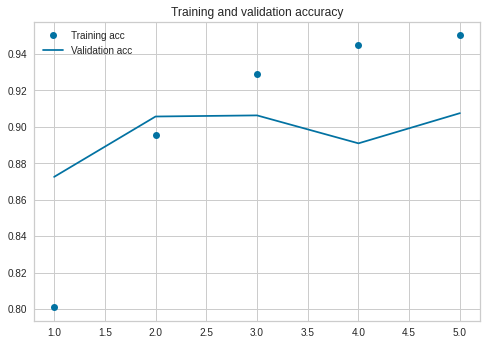

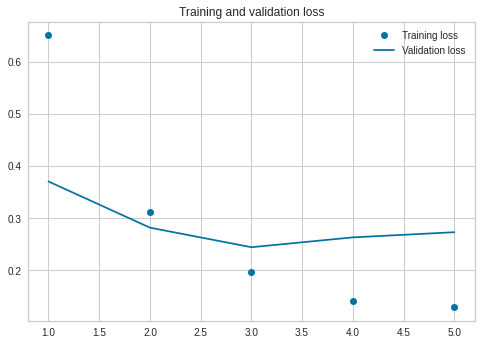

In [ ]:
plot_acc(history11)

###4.9.6.Observation

We can observe that there are 2,243,193 trainable parameters and 0 nontrainable parameters in model.
The accuracy after 6 epochs comes with 95 in train and 90 in test which has  overfit.
Classification Report depicts that the F1 score came quite well except 5th highest group

##4.10.Create one layer bidirectional LSTM deep learning model with glove 300

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_padded,X_test_Glove_padded=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.10.1. Building of a model with one Embedding with glove 300d weight matrix, one bidirectional LSTM and one Dense layer  to check the accuracy.


This model has 1 embedding layer with glove 100d weight matrix, 1 Bi directional LSTM layer with output 128 and return sequence as false and one dense layer with output 5 as 5 groups are there for prediction with soft max in dense layer as activation

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from tensorflow.keras.layers import LSTM, Embedding, Dense, Dropout, Bidirectional

model12 = Sequential()
model12.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
#model2.add(Dropout(0.1))
model12.add(Bidirectional(LSTM(128, return_sequences=False)))
model12.add(Dense(5, activation='softmax'))
#model2.add(Dropout(0.1))
#model2.add(Bidirectional(LSTM(128, return_sequences=False)))
#model2.add(Dense(74, activation='softmax'))

model12.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model12.summary())

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_11 (Embedding)     (None, 352, 300)          2022900   
_________________________________________________________________
bidirectional_11 (Bidirectio (None, 256)               439296    
_________________________________________________________________
dense_13 (Dense)             (None, 5)                 1285      
Total params: 2,463,481
Trainable params: 2,463,481
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history12=model12.fit(X_train_Glove_padded,y_train_Glove,validation_data=(X_test_Glove_padded,y_test_Glove),epochs=20,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/20
39/39 [==============================] - 5s 116ms/step - loss: 0.6713 - accuracy: 0.7894 - val_loss: 0.3937 - val_accuracy: 0.8504
Epoch 2/20
39/39 [==============================] - 4s 100ms/step - loss: 0.2991 - accuracy: 0.8980 - val_loss: 0.2870 - val_accuracy: 0.8927
Epoch 3/20
39/39 [==============================] - 4s 98ms/step - loss: 0.2213 - accuracy: 0.9214 - val_loss: 0.2364 - val_accuracy: 0.9123
Epoch 4/20
39/39 [==============================] - 4s 99ms/step - loss: 0.1532 - accuracy: 0.9393 - val_loss: 0.2347 - val_accuracy: 0.9105
Epoch 5/20
39/39 [==============================] - 4s 99ms/step - loss: 0.1167 - accuracy: 0.9482 - val_loss: 0.3136 - val_accuracy: 0.9080
Epoch 6/20
39/39 [==============================] - 4s 99ms/step - loss: 0.1031 - accuracy: 0.9535 - val_loss: 0.2412 - val_accuracy: 0.9123


###4.10.3. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model12.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model12.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model12.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9981505e-01 6.6874054e-05 3.2432694e-05 3.2767621e-05 5.2932210e-05]]
Group_0
[[2.3396693e-03 4.9495096e-03 9.8940605e-01 2.5238958e-03 7.8075257e-04]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1194
           1       0.88      0.92      0.90        74
           2       0.94      0.97      0.95        90
           3       0.81      0.94      0.87       200
           4       0.74      0.34      0.47        73

   micro avg       0.95      0.95      0.95      1631
   macro avg       0.87      0.83      0.84      1631
weighted avg       0.95      0.95      0.94      1631
 samples avg       0.95      0.95      0.95      1631



###4.10.4.Error Plot

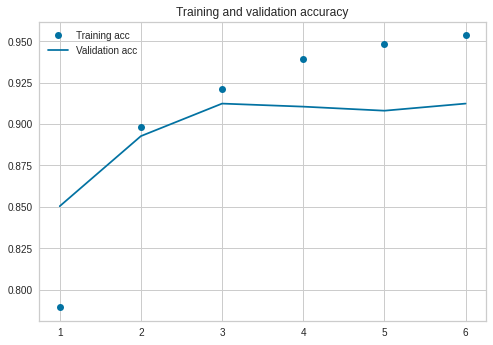

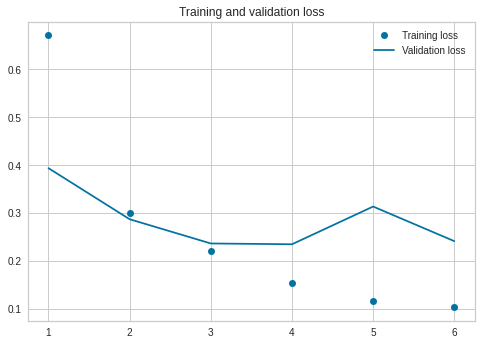

In [ ]:
plot_acc(history12)

###4.10.5.Observation

We can observe that there are 2,463,481 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 7 epochs comes with 95 in train and 91 in test which has a larger overfit and to less training loss compare to validation loss.

The classification Report depicts the f1 score came poor for 5th  highest group among top 5 along with that due to large overfit we cannot select this model

##4.11.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 300 embedding and 3 dense layers

###4.11.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_padded,X_test_Glove_padded=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.11.2.Model Description

This model has 1 embedding layer with glove 300d embedding and 1 bidirectional LSTM layer with output 128 and return sequence as true and one globalmaxpool1D layer and 3 dense layers with final layer having output as 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model14 = Sequential()
model14.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix]))
model14.add(Bidirectional(LSTM(units=128 , return_sequences = True)))
model14.add(GlobalMaxPool1D())
model14.add(Dense(100, activation="relu"))
#model14.add(Dropout(0.5))
model14.add(Dense(80, activation="relu"))
#model14.add(Dropout(0.5))
model14.add(Dense(5, activation="softmax"))
model14.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model14.summary())

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_12 (Embedding)     (None, None, 300)         2022900   
_________________________________________________________________
bidirectional_12 (Bidirectio (None, None, 256)         439296    
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 256)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 100)               25700     
_________________________________________________________________
dense_15 (Dense)             (None, 80)                8080      
_________________________________________________________________
dense_16 (Dense)             (None, 5)                 405       
Total params: 2,496,381
Trainable params: 2,496,381
Non-trainable params: 0
___________________________________________

In [ ]:
history14=model14.fit(X_train_Glove_padded,y_train_Glove,validation_data=(X_test_Glove_padded,y_test_Glove),epochs=20,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/20
39/39 [==============================] - 5s 122ms/step - loss: 0.7459 - accuracy: 0.7779 - val_loss: 0.4527 - val_accuracy: 0.8283
Epoch 2/20
39/39 [==============================] - 4s 103ms/step - loss: 0.3323 - accuracy: 0.8825 - val_loss: 0.2796 - val_accuracy: 0.8933
Epoch 3/20
39/39 [==============================] - 4s 104ms/step - loss: 0.1936 - accuracy: 0.9261 - val_loss: 0.2497 - val_accuracy: 0.9013
Epoch 4/20
39/39 [==============================] - 4s 103ms/step - loss: 0.1404 - accuracy: 0.9395 - val_loss: 0.2278 - val_accuracy: 0.9135
Epoch 5/20
39/39 [==============================] - 4s 103ms/step - loss: 0.0940 - accuracy: 0.9561 - val_loss: 0.2308 - val_accuracy: 0.9129
Epoch 6/20
39/39 [==============================] - 4s 103ms/step - loss: 0.0803 - accuracy: 0.9616 - val_loss: 0.2579 - val_accuracy: 0.9019


###4.11.4. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model14.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model14.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model14.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9999630e-01 1.1790455e-06 1.5936230e-06 1.2656116e-08 9.4769592e-07]]
Group_0
[[1.1392966e-02 9.3032664e-04 9.8650628e-01 5.9655745e-04 5.7388976e-04]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1194
           1       0.92      0.89      0.90        74
           2       0.94      0.94      0.94        90
           3       0.99      0.66      0.79       200
           4       0.52      0.99      0.68        73

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.87      0.89      0.86      1631
weighted avg       0.96      0.94      0.95      1631
 samples avg       0.94      0.94      0.94      1631



###4.11.4.Error Plot

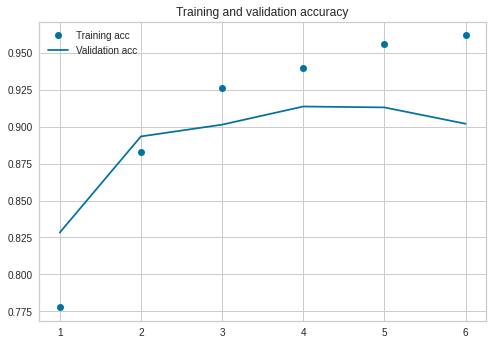

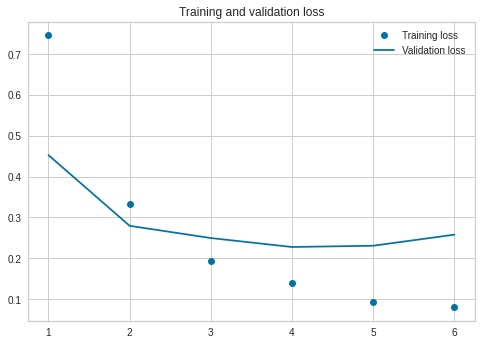

In [ ]:
plot_acc(history14)

###4.11.5.Observation

We can observe that there are 2,496,381 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 6 epochs with early stopping comes with 96 in train and 90 in test 

Classification reports depicts that 5th and 4th highest group have low F1 score and  the model behaviour is fluctuating which is a concern.



##4.12.Create one layer  bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer and 1 drop out

###4.12.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer and 1 drop out.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.12.2.Model Description
This model has 1 embedding layer 1 bidirectional LSTM layers with weight matrix as glove 300 and return sequence as True and one flatten ,one drop out and one dense layer with output 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import TimeDistributed
from keras.models import Sequential 
from keras.layers import Activation, Dense, Flatten 

model1j3 = Sequential()
model1j3.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
model1j3.add(Bidirectional(LSTM(100, return_sequences=True)))
model1j3.add(Flatten())
model1j3.add(Dropout(0.5))
model1j3.add(Dense(5, activation='softmax'))
model1j3.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model1j3.summary())

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_13 (Embedding)     (None, 352, 300)          2022900   
_________________________________________________________________
bidirectional_13 (Bidirectio (None, 352, 200)          320800    
_________________________________________________________________
flatten_5 (Flatten)          (None, 70400)             0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 70400)             0         
_________________________________________________________________
dense_17 (Dense)             (None, 5)                 352005    
Total params: 2,695,705
Trainable params: 2,695,705
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
historyj3=model1j3.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
39/39 [==============================] - 5s 118ms/step - loss: 0.6082 - accuracy: 0.8131 - val_loss: 0.3663 - val_accuracy: 0.8553
Epoch 2/30
39/39 [==============================] - 4s 99ms/step - loss: 0.2700 - accuracy: 0.9051 - val_loss: 0.2707 - val_accuracy: 0.8988
Epoch 3/30
39/39 [==============================] - 4s 98ms/step - loss: 0.1612 - accuracy: 0.9401 - val_loss: 0.2543 - val_accuracy: 0.8988
Epoch 4/30
39/39 [==============================] - 4s 97ms/step - loss: 0.1223 - accuracy: 0.9511 - val_loss: 0.2666 - val_accuracy: 0.9007
Epoch 5/30
39/39 [==============================] - 4s 97ms/step - loss: 0.1146 - accuracy: 0.9556 - val_loss: 0.2946 - val_accuracy: 0.9007
Epoch 6/30
39/39 [==============================] - 4s 97ms/step - loss: 0.1081 - accuracy: 0.9514 - val_loss: 0.2918 - val_accuracy: 0.9086
Epoch 7/30
39/39 [==============================] - 4s 99ms/step - loss: 0.0809 - accuracy: 0.9611 - val_loss: 0.3337 - val_accuracy: 0.9037
Epoch 8/30
3

###4.12.3.Error Plot

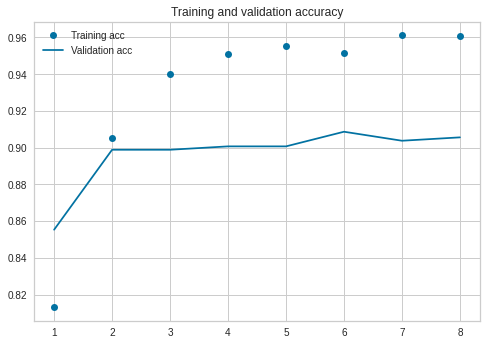

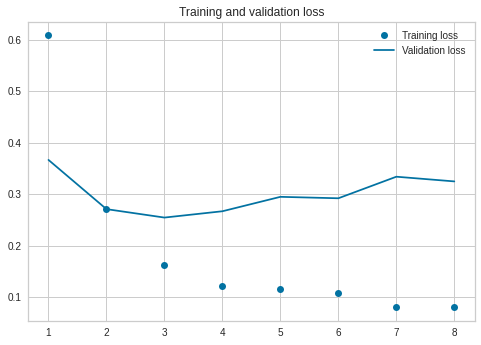

In [ ]:
plot_acc(historyj3)

###4.12.4. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1j3.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1j3.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = model1j3.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9999917e-01 2.2880592e-07 2.8634840e-08 4.5586816e-08 4.4690745e-07]]
Group_0
[[8.4766041e-05 6.2498744e-05 9.9960393e-01 6.1244282e-05 1.8761939e-04]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1194
           1       0.87      0.89      0.88        74
           2       0.97      0.96      0.96        90
           3       0.83      0.93      0.87       200
           4       0.76      0.47      0.58        73

   micro avg       0.95      0.95      0.95      1631
   macro avg       0.88      0.85      0.86      1631
weighted avg       0.95      0.95      0.95      1631
 samples avg       0.95      0.95      0.95      1631



###4.12.5.Observation

We can observe that there are 2,695,705 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 10 epochs comes with 96 in train and 90 in test which has a larger overfit and to less training loss compare to validation loss.

The classification Report depicts the metrices  came well for top 5 except 5th highest group but due to large overfit we cannot select this model

##4.13.Create two layers  bidirectional LSTM deep learning model with one has  return sequence as True second one has false and glove 300 embedding

###4.13.1. Building of a model with two layers  bidirectional LSTM deep learning model with one has  return sequence as True second one has false and one Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.13.2.Model Description

This model has 1 embedding layer with glov 300d 2 bi directional LSTM layers with one with  return sequence as true and second is return sequence as false   and one dense layer with output 5 as 5 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
modelj007 = Sequential()
modelj007.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
modelj007.add(Bidirectional(LSTM(128, return_sequences=True)))
modelj007.add(Bidirectional(LSTM(128, return_sequences=False)))
modelj007.add(Dense(5,activation='softmax'))
modelj007.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(modelj007.summary())

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_14 (Embedding)     (None, 352, 300)          2022900   
_________________________________________________________________
bidirectional_14 (Bidirectio (None, 352, 256)          439296    
_________________________________________________________________
bidirectional_15 (Bidirectio (None, 256)               394240    
_________________________________________________________________
dense_18 (Dense)             (None, 5)                 1285      
Total params: 2,857,721
Trainable params: 2,857,721
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
historyj007=modelj007.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=20,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/20
39/39 [==============================] - 7s 192ms/step - loss: 0.5990 - accuracy: 0.8144 - val_loss: 0.3887 - val_accuracy: 0.8712
Epoch 2/20
39/39 [==============================] - 6s 165ms/step - loss: 0.2601 - accuracy: 0.9101 - val_loss: 0.2938 - val_accuracy: 0.8847
Epoch 3/20
39/39 [==============================] - 6s 164ms/step - loss: 0.1873 - accuracy: 0.9293 - val_loss: 0.3302 - val_accuracy: 0.8896
Epoch 4/20
39/39 [==============================] - 6s 164ms/step - loss: 0.1363 - accuracy: 0.9458 - val_loss: 0.3131 - val_accuracy: 0.8903


###4.13.3.Error Plot

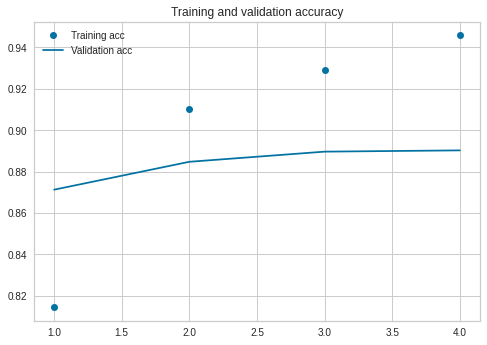

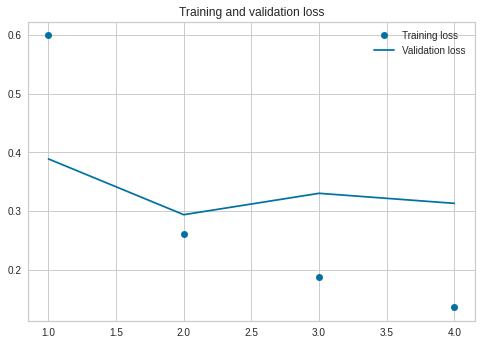

In [ ]:
plot_acc(historyj007)

###4.13.4. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelj007.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelj007.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = modelj007.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.98883188e-01 3.91989626e-04 1.13070026e-04 1.41547309e-04
  4.70198953e-04]]
Group_0
[[0.00675872 0.00417945 0.98436916 0.00247616 0.00221654]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1194
           1       0.87      0.70      0.78        74
           2       0.98      0.92      0.95        90
           3       0.73      0.98      0.84       200
           4       0.88      0.21      0.33        73

   micro avg       0.94      0.94      0.94      1631
   macro avg       0.89      0.76      0.78      1631
weighted avg       0.95      0.94      0.93      1631
 samples avg       0.94      0.94      0.94      1631



###4.13.5.Observation

We can observe that there are 2,857,721 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 7 epochs with early stopping comes with 94 in train and 89 in test which has a larger overfit and to less training loss compare to validation loss.

The classification Report depicts the f1 score came very poor for 5th  highest group among top 5 along with that due to large overfit we cannot select this model

##4.14.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

###4.14.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(1631, 352) (3804, 352)


###4.14.2.Model Description

This model has 1 embedding layer 2 bidirectional LSTM layers with weight matrix as glove 300 and return sequence as True and one flatten and one dense layer with 1 drop out layer and 1 spatial drop out layer .

Drop out we have used 0.3 and spatial drop out as 0.4

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import Activation, Dense, Flatten, Dropout, Bidirectional, SpatialDropout1D
modelh009 = Sequential()
modelh009.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 352,trainable=True))
modelh009.add(SpatialDropout1D(0.4))
modelh009.add(Bidirectional(LSTM(128, return_sequences=True)))
modelh009.add(Dropout(0.3))
modelh009.add(Bidirectional(LSTM(128, return_sequences=True)))
modelh009.add(Flatten())
modelh009.add(Dense(5,activation='softmax'))
modelh009.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(modelh009.summary())

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_15 (Embedding)     (None, 352, 300)          2022900   
_________________________________________________________________
spatial_dropout1d_2 (Spatial (None, 352, 300)          0         
_________________________________________________________________
bidirectional_16 (Bidirectio (None, 352, 256)          439296    
_________________________________________________________________
dropout_4 (Dropout)          (None, 352, 256)          0         
_________________________________________________________________
bidirectional_17 (Bidirectio (None, 352, 256)          394240    
_________________________________________________________________
flatten_6 (Flatten)          (None, 90112)             0         
_________________________________________________________________
dense_19 (Dense)             (None, 5)               

In [ ]:
historyh009=modelh009.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=20,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=2)])

Epoch 1/20
39/39 [==============================] - 8s 195ms/step - loss: 0.6296 - accuracy: 0.8070 - val_loss: 0.3778 - val_accuracy: 0.8804
Epoch 2/20
39/39 [==============================] - 7s 170ms/step - loss: 0.3073 - accuracy: 0.8925 - val_loss: 0.3816 - val_accuracy: 0.8921
Epoch 3/20
39/39 [==============================] - 7s 171ms/step - loss: 0.2388 - accuracy: 0.9093 - val_loss: 0.3136 - val_accuracy: 0.9080
Epoch 4/20
39/39 [==============================] - 7s 170ms/step - loss: 0.1788 - accuracy: 0.9285 - val_loss: 0.3256 - val_accuracy: 0.8982
Epoch 5/20
39/39 [==============================] - 7s 170ms/step - loss: 0.1552 - accuracy: 0.9351 - val_loss: 0.3078 - val_accuracy: 0.9037
Epoch 6/20
39/39 [==============================] - 7s 170ms/step - loss: 0.1676 - accuracy: 0.9317 - val_loss: 0.3089 - val_accuracy: 0.9044
Epoch 7/20
39/39 [==============================] - 7s 170ms/step - loss: 0.1132 - accuracy: 0.9485 - val_loss: 0.3890 - val_accuracy: 0.9111


###4.14.3.Error Plot

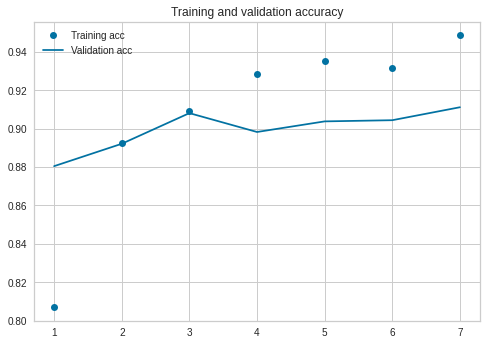

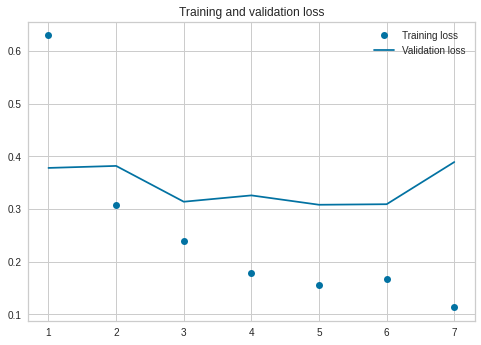

In [ ]:
plot_acc(historyh009)

###4.14.4. Prediction block and classification report

In [ ]:

features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelh009.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelh009.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

y_probs = modelh009.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

[[9.9999988e-01 1.7549796e-07 2.3091319e-08 2.9767024e-08 5.2344991e-08]]
Group_0
[[8.7848362e-05 1.8259794e-05 9.9944097e-01 2.8112976e-04 1.7162661e-04]]
Group_24
51/51 - 1s
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1194
           1       0.91      0.85      0.88        74
           2       0.98      0.93      0.95        90
           3       0.78      0.97      0.87       200
           4       0.94      0.23      0.37        73

   micro avg       0.95      0.95      0.95      1631
   macro avg       0.92      0.80      0.81      1631
weighted avg       0.95      0.95      0.94      1631
 samples avg       0.95      0.95      0.95      1631



###4.14.5.Observation

We can observe that there are 3,307,001 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 6 epochs comes with 94 in train and 91 in test which has a  overfit.

The classification Report depicts the f1 score came very poor for 5th highest group among top 5 along with that due to large overfit we cannot select this model

#Complete Data Set

In [ ]:
finalticketsummary=finaldataset_all

In [ ]:
EMBEDDING_FILE = '/content/drive/My Drive/glove.6B.100d.txt'

#100D

##5.1.Create the deep learning base model.


5.1.1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.


5.1.2.Tokenization and vocab creation


5.1.3.Base Model with categorical_crossentropy and adam optimizer

5.1.4. Prediction


5.1.5.Error Plot

5.1.6 Prediction block and classification report

5.1.7.Observation

##5.2.Create the deep learning base model with glove 100d weight matrix

5.2.1.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

5.2.2.Tokenization and vocab creation

5.2.3.Base Model with categorical_crossentropy and adam optimizer

5.2.4.Error Plot

5.2.5 Prediction block and classification report

5.2.6.Observation

##5.3.Create one layer bidirectional LSTM deep learning model with glove 100

5.3.1. Building of a model with one Embedding with glove 100d weight matrix, one bidirectional LSTM and one Dense layer to check the accuracy.

5.3.2.Bi directional LSTM Model with categorical_crossentropy and adam optimizer

5.3.3.Error Plot

5.3.4. Classiication report

5.3.5.Observation

##5.4.Create one layer bidirectional LSTM deep learning model with flatten and return sequence as True and glove 100 embedding

5.4.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True and one flatten and one Dense layer.

5.4.2.Model Description

5.4.3.Error Plot

5.4.4. Classification report

5.4.5.Observation

##5.5.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 100 embedding and 3 dense layers

5.5.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

5.5.2.Model Description

5.5.3.Error Plot

5.5.4. Classification report

5.5.5.Observation

##5.6.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer

5.6.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer.

5.6.2.Model Description

5.6.3.Error Plot

5.6.4. Classification report

5.6.5.Observation

##5.7.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

5.7.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

5.7.2.Model Description

5.7.3.Error Plot

5.7.4. Classification report

5.7.5.Observation



##5.1.Create the deep learning base model.

Embedding

In [ ]:
embeddings_index = {}
f = open(EMBEDDING_FILE)
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))


Found 400000 word vectors.


###5.1.1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.

In [ ]:
y = pd.get_dummies(finalticketsummary["Assignment group"]).values
y.shape
#Convert y to onehot encoded output

(8500, 74)

In [ ]:
X_train_basic,X_test_basic,y_train_basic,y_test_basic = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)
#70:30 split

In [ ]:
print(y_test_basic.shape)
print(y_train_basic.shape)

(2550, 74)
(5950, 74)


In [ ]:
print(X_train_basic.shape)
print(X_test_basic.shape)

(5950,)
(2550,)


###5.1.2.Tokenization and vocab creation

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(finalticketsummary["CleanTextAfterRemoveStopword"])
word_index = tokenizer.word_index
vocab_size=len(word_index)+1
##Tokenize the words

In [ ]:
vocab_size

#Calculate vocab size

11760

In [ ]:
finalticketsummary["WordLength"] = finalticketsummary['CleanTextAfterRemoveStopword'].str.split().str.len()

In [ ]:
finalticketsummary['CleanTextAfterRemoveStopword'].loc[1596]

''

In [ ]:

finalticketsummary.sort_values(by='WordLength', ascending=False).head()

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword,Assignment group_num,WordLength
7463,GRP_62,security incident sw possible locky ransomware...,"[security, incident, sw, possible, locky, rans...",59,673
7458,GRP_2,security incident sw possible locky ransomware...,"[security, incident, sw, possible, locky, rans...",12,673
3829,GRP_39,security incident sw magento sql injection sou...,"[security, incident, sw, magento, sql, injecti...",33,581
3831,GRP_2,security incident sw magento sql injection sou...,"[security, incident, sw, magento, sql, injecti...",12,581
3717,GRP_2,security incident possible malware infection t...,"[security, incident, possible, malware, infect...",12,531


In [ ]:
sequences = tokenizer.texts_to_sequences(X_train_basic)
X_train_padded = pad_sequences(sequences, maxlen=673)
sequences = tokenizer.texts_to_sequences(X_test_basic)
X_test_padded=pad_sequences(sequences, maxlen=673)
X_test_padded.shape
#padd the input to have same size

(2550, 673)

In [ ]:
X_train_padded.shape

(5950, 673)

###5.1.3.Base Model with categorical_crossentropy and adam optimizer

This model has 1 embedding layer 1 lstm layer with output 100 and return sequence as false and onse dense layer with output 74 as 74 groups are there for prediction.

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
embedding_vector_features=100
model=Sequential()
model.add(Embedding(vocab_size,embedding_vector_features,input_length=673))
model.add(LSTM(100,return_sequences=False))
model.add(Dense(74,activation='softmax'))
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model.summary())

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_16 (Embedding)     (None, 673, 100)          1176000   
_________________________________________________________________
lstm_22 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dense_20 (Dense)             (None, 74)                7474      
Total params: 1,263,874
Trainable params: 1,263,874
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history=model.fit(X_train_padded,y_train_basic,validation_data=(X_test_padded,y_test_basic),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',min_delta=0.0001,patience=5)])

Epoch 1/30
60/60 [==============================] - 4s 68ms/step - loss: 1.6339 - accuracy: 0.6057 - val_loss: 1.9412 - val_accuracy: 0.5494
Epoch 2/30
60/60 [==============================] - 4s 67ms/step - loss: 1.5169 - accuracy: 0.6237 - val_loss: 1.9404 - val_accuracy: 0.5494
Epoch 3/30
60/60 [==============================] - 4s 67ms/step - loss: 1.3844 - accuracy: 0.6450 - val_loss: 1.9146 - val_accuracy: 0.5584
Epoch 4/30
60/60 [==============================] - 4s 67ms/step - loss: 1.2995 - accuracy: 0.6635 - val_loss: 1.9310 - val_accuracy: 0.5506
Epoch 5/30
60/60 [==============================] - 4s 67ms/step - loss: 1.2257 - accuracy: 0.6818 - val_loss: 1.8639 - val_accuracy: 0.5545
Epoch 6/30
60/60 [==============================] - 4s 67ms/step - loss: 1.0927 - accuracy: 0.7151 - val_loss: 1.8407 - val_accuracy: 0.5702
Epoch 7/30
60/60 [==============================] - 4s 67ms/step - loss: 1.0026 - accuracy: 0.7413 - val_loss: 1.8640 - val_accuracy: 0.5561
Epoch 8/30
60

###5.1.4.Error Plot

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

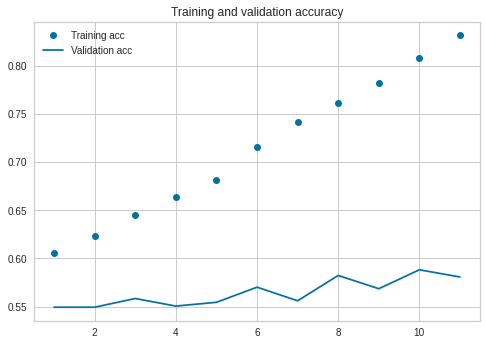

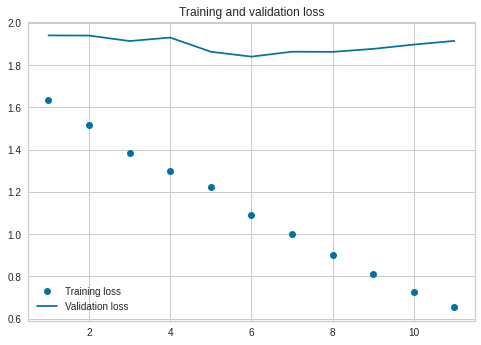

In [ ]:


epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###5.1.5 Prediction block and classification report

In [ ]:
features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (np.argmax(pred))



features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model.predict(padded_texts)
print (np.argmax(pred))


y_probs = model.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

0
17
80/80 - 1s
              precision    recall  f1-score   support

           0       0.79      0.85      0.82      1168
           1       0.67      0.15      0.25        13
           2       0.46      0.35      0.40        51
           3       0.14      0.17      0.15         6
           4       0.43      0.51      0.47        81
           5       0.21      0.21      0.21        38
           6       0.13      0.26      0.17        34
           7       0.00      0.00      0.00        12
           8       0.16      0.14      0.15        22
           9       0.83      0.73      0.78        26
          10       0.28      0.38      0.32        29
          11       0.17      0.24      0.20        76
          12       0.37      0.35      0.36        75
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00         8
          1

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



2nd prediction is wrong

###5.1.7.Observation

We can observe that there are 1,263,874 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 11 epochs comes with 83 in train and 58 in test which has a very large overfit and to less training loss compare to validation loss.

The error plot also explains the overfit.

If we see the classification report we can see the scores are not good we will try to improve more.The classification report did not went well due to hudge imbalance in complete data

##5.2.Create the deep learning base model with glove 100d weight matrix

###5.2.1.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
embedding_dim = 100
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < vocab_size:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

###5.2.2.Tokenization and vocab creation

In [ ]:
def padd_sequence(X_train_Glove,X_test_Glove):
  sequences = tokenizer.texts_to_sequences(X_train_Glove)
  X_train_padded_Glove = pad_sequences(sequences, maxlen=673)
  sequences = tokenizer.texts_to_sequences(X_test_Glove)
  X_test_padded_Glove=pad_sequences(sequences, maxlen=673)
  print(X_test_padded_Glove.shape,X_train_padded_Glove.shape)
  return X_train_padded_Glove,X_test_padded_Glove


In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.2.3.Base Model with categorical_crossentropy and adam optimizer

This model has 1 embedding layer with weight matrix of glove 100, 1 lstm layer with output 128 and return sequence as false and one dense layer with softmax activation Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model1 = Sequential()
model1.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model1.add(LSTM(128, return_sequences=False))
model1.add(Dense(74, activation='softmax'))
model1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model1.summary())

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_17 (Embedding)     (None, 673, 100)          1176000   
_________________________________________________________________
lstm_23 (LSTM)               (None, 128)               117248    
_________________________________________________________________
dense_21 (Dense)             (None, 74)                9546      
Total params: 1,302,794
Trainable params: 1,302,794
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history1=model1.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=7)])

Epoch 1/30
60/60 [==============================] - 5s 79ms/step - loss: 2.6735 - accuracy: 0.4689 - val_loss: 2.1985 - val_accuracy: 0.5322
Epoch 2/30
60/60 [==============================] - 5s 75ms/step - loss: 2.0655 - accuracy: 0.5413 - val_loss: 1.9386 - val_accuracy: 0.5592
Epoch 3/30
60/60 [==============================] - 5s 75ms/step - loss: 1.8447 - accuracy: 0.5708 - val_loss: 1.7864 - val_accuracy: 0.5769
Epoch 4/30
60/60 [==============================] - 5s 78ms/step - loss: 1.6732 - accuracy: 0.5955 - val_loss: 1.7184 - val_accuracy: 0.5831
Epoch 5/30
60/60 [==============================] - 4s 75ms/step - loss: 1.5137 - accuracy: 0.6254 - val_loss: 1.6028 - val_accuracy: 0.6031
Epoch 6/30
60/60 [==============================] - 4s 75ms/step - loss: 1.3518 - accuracy: 0.6496 - val_loss: 1.5321 - val_accuracy: 0.6125
Epoch 7/30
60/60 [==============================] - 5s 77ms/step - loss: 1.2192 - accuracy: 0.6761 - val_loss: 1.5037 - val_accuracy: 0.6271
Epoch 8/30
60

###5.2.4.Error Plot

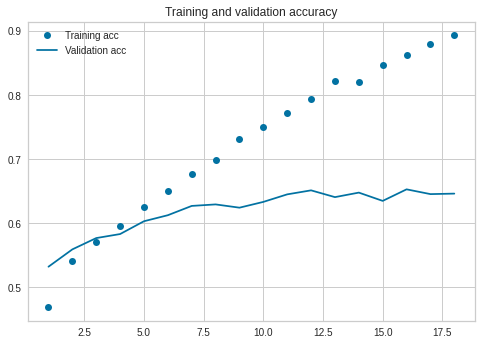

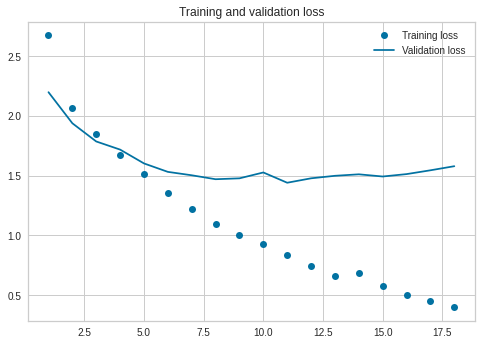

In [ ]:
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###5.2.5 Prediction block and classification report

In [ ]:
features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (np.argmax(pred))



features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model1.predict(padded_texts)
print (np.argmax(pred))


y_probs = model1.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

0
17
80/80 - 1s
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1168
           1       1.00      0.23      0.38        13
           2       0.84      0.63      0.72        51
           3       1.00      0.33      0.50         6
           4       0.84      0.80      0.82        81
           5       0.76      0.84      0.80        38
           6       0.86      0.74      0.79        34
           7       0.50      0.83      0.62        12
           8       0.73      0.86      0.79        22
           9       1.00      1.00      1.00        26
          10       0.51      0.66      0.58        29
          11       0.66      0.68      0.67        76
          12       0.77      0.71      0.74        75
          13       0.47      0.64      0.54        11
          14       0.56      0.50      0.53        10
          15       0.75      0.30      0.43        10
          16       1.00      0.62      0.77         8
          1

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.2.6.Observation
We have created a simple LSTM model with 3 layers with glove embedding  weight matrix and checked the accuracy.The training accuracy is coming high but testing is max 64%.We need to explore more to improve accuracy

There is a hudge overfit and the scores for some groups are coming not well

##5.3.Create one layer bidirectional LSTM deep learning model with glove 100 weight matrix


###5.3.1.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

In [ ]:
X_train_Glove_bi,X_test_Glove_bi,y_train_Glove_bi,y_test_Glove_bi = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_bi_padded,X_test_Glove_bi_padded=padd_sequence(X_train_Glove_bi,X_test_Glove_bi)

(2550, 673) (5950, 673)


In [ ]:
X_train_Glove_bi_padded.shape

(5950, 673)

###5.3.2.Base Model with categorical_crossentropy and adam optimizer

This model has 1 embedding layer with glove 100d weight matrix, 1 Bi directional LSTM layer with output 128 and return sequence as false and one dense layer with soft max in dense layer as activation

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from tensorflow.keras.layers import LSTM, Embedding, Dense, Dropout, Bidirectional

model2 = Sequential()
model2.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
#model2.add(Dropout(0.1))
model2.add(Bidirectional(LSTM(128, return_sequences=False)))
model2.add(Dense(74, activation='softmax'))
#model2.add(Dropout(0.1))
#model2.add(Bidirectional(LSTM(128, return_sequences=False)))
#model2.add(Dense(74, activation='softmax'))

model2.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model2.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 673, 100)          1158300   
_________________________________________________________________
bidirectional (Bidirectional (None, 256)               234496    
_________________________________________________________________
dense_2 (Dense)              (None, 74)                19018     
Total params: 1,411,814
Trainable params: 1,411,814
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history2=model2.fit(X_train_Glove_bi_padded,y_train_Glove_bi,validation_data=(X_test_Glove_bi_padded,y_test_Glove_bi),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 8s 138ms/step - loss: 2.6127 - accuracy: 0.4837 - val_loss: 2.1813 - val_accuracy: 0.5141
Epoch 2/30
60/60 [==============================] - 8s 127ms/step - loss: 1.9727 - accuracy: 0.5487 - val_loss: 1.9066 - val_accuracy: 0.5518
Epoch 3/30
60/60 [==============================] - 8s 128ms/step - loss: 1.7194 - accuracy: 0.5908 - val_loss: 1.7530 - val_accuracy: 0.5804
Epoch 4/30
60/60 [==============================] - 8s 128ms/step - loss: 1.5192 - accuracy: 0.6261 - val_loss: 1.6365 - val_accuracy: 0.5882
Epoch 5/30
60/60 [==============================] - 8s 128ms/step - loss: 1.3548 - accuracy: 0.6519 - val_loss: 1.5649 - val_accuracy: 0.5973
Epoch 6/30
60/60 [==============================] - 8s 128ms/step - loss: 1.2158 - accuracy: 0.6748 - val_loss: 1.5267 - val_accuracy: 0.6027
Epoch 7/30
60/60 [==============================] - 8s 128ms/step - loss: 1.0926 - accuracy: 0.7032 - val_loss: 1.4942 - val_accuracy: 0.6243
Epoch 

###5.3.3.Error Plot

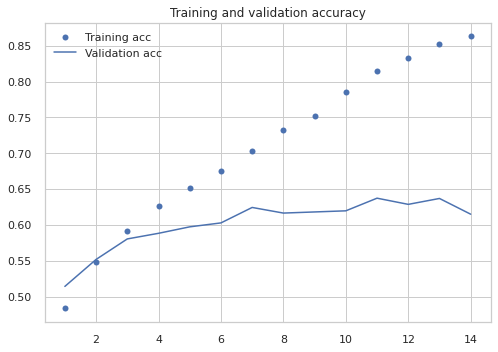

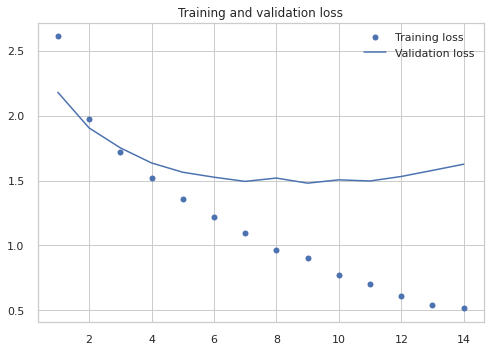

In [ ]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###5.3.4 Classification report

In [ ]:
y_probs = model2.predict(X_test_Glove_bi_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_Glove_bi, y_pred)
print(report)

80/80 - 2s
              precision    recall  f1-score   support

           0       0.82      0.87      0.84      1174
           1       0.38      0.27      0.32        11
           2       0.33      0.35      0.34        40
           3       0.17      0.14      0.15         7
           4       0.39      0.66      0.49        73
           5       0.38      0.33      0.35        42
           6       0.28      0.32      0.30        41
           7       0.17      0.18      0.17        11
           8       0.22      0.48      0.30        29
           9       0.95      0.90      0.92        20
          10       0.25      0.17      0.20        24
          11       0.39      0.23      0.29        75
          12       0.35      0.41      0.38        73
          13       0.07      0.11      0.09         9
          14       0.00      0.00      0.00        10
          15       0.11      0.12      0.12         8
          16       0.25      0.33      0.29         6
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.3.5.Observation

We can observe that there are 1,411,814  trainable parameters and 0 nontrainable parameters in model.
The accuracy after 14 epochs comes with 86 in train and 61 in test which has a larger overfit and to less training loss compare to validation loss.

The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.

##5.4.Create one layer bidirectional LSTM deep learning model with flatten and return sequence as True and glove 100 embedding

###5.4.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True and one flatten and one Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.4.2.Model Description

This model has 1 embedding layer with glove 100d 1 bi directional LSTM layer with output 128 and return sequence as true, one flatten layer and one dense layer with output 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import TimeDistributed
from keras.models import Sequential 
from keras.layers import Activation, Dense, Flatten 

model13 = Sequential()
model13.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model13.add(Bidirectional(LSTM(128, return_sequences=True)))
model13.add(Flatten())
model13.add(Dense(74, activation='softmax'))
model13.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model13.summary())

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_9 (Embedding)      (None, 673, 100)          1158300   
_________________________________________________________________
bidirectional_8 (Bidirection (None, 673, 256)          234496    
_________________________________________________________________
flatten_3 (Flatten)          (None, 172288)            0         
_________________________________________________________________
dense_10 (Dense)             (None, 74)                12749386  
Total params: 14,142,182
Trainable params: 14,142,182
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history13=model13.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 9s 142ms/step - loss: 2.3052 - accuracy: 0.5155 - val_loss: 1.8373 - val_accuracy: 0.5584
Epoch 2/30
60/60 [==============================] - 8s 133ms/step - loss: 1.4631 - accuracy: 0.6254 - val_loss: 1.6781 - val_accuracy: 0.5925
Epoch 3/30
60/60 [==============================] - 8s 133ms/step - loss: 1.0472 - accuracy: 0.7111 - val_loss: 1.6764 - val_accuracy: 0.5965
Epoch 4/30
60/60 [==============================] - 8s 133ms/step - loss: 0.7901 - accuracy: 0.7793 - val_loss: 1.9561 - val_accuracy: 0.6133
Epoch 5/30
60/60 [==============================] - 8s 133ms/step - loss: 0.6639 - accuracy: 0.8292 - val_loss: 1.8705 - val_accuracy: 0.6255
Epoch 6/30
60/60 [==============================] - 8s 133ms/step - loss: 0.5047 - accuracy: 0.8652 - val_loss: 1.9614 - val_accuracy: 0.6412
Epoch 7/30
60/60 [==============================] - 8s 134ms/step - loss: 0.4254 - accuracy: 0.8914 - val_loss: 2.0832 - val_accuracy: 0.6251
Epoch 

###5.4.3.Error Plot

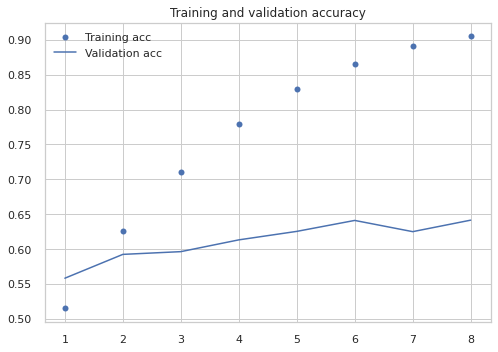

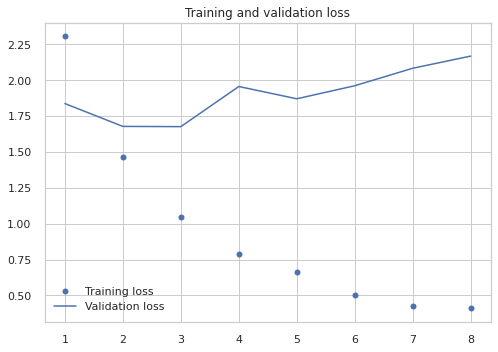

In [ ]:
plot_acc(history13)

###5.4.4. Classification report

In [ ]:
y_probs = model13.predict(X_test_Glove_bi_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_Glove_bi, y_pred)
print(report)

80/80 - 2s
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1216
           1       0.60      0.67      0.63         9
           2       0.72      0.76      0.74        45
           3       0.83      0.71      0.77        14
           4       0.73      0.80      0.76        76
           5       0.67      0.83      0.74        42
           6       0.89      0.62      0.74        40
           7       1.00      0.71      0.83        14
           8       0.94      0.73      0.82        22
           9       0.95      0.90      0.92        20
          10       0.87      0.69      0.77        29
          11       0.85      0.74      0.79        70
          12       0.85      0.67      0.75        70
          13       1.00      0.73      0.84        11
          14       1.00      0.75      0.86         8
          15       1.00      0.62      0.77         8
          16       1.00      0.56      0.71         9
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.4.5.Observation

We can observe that there are 14,142,182 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 8 epochs with early stopping comes with 90 in train and 64 in test which has a very large overfit and too less training loss compare to validation loss.

The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.



##5.5.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 100 embedding and 3 dense layers

###5.5.1. Building of a model with one Embedding layer with glove 100d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

In [ ]:
X_train_Glove_bi,X_test_Glove_bi,y_train_Glove_bi,y_test_Glove_bi = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_bi_padded,X_test_Glove_bi_padded=padd_sequence(X_train_Glove_bi,X_test_Glove_bi)

(2550, 673) (5950, 673)


In [ ]:
from keras.layers import Dense, Input,  Embedding, Dropout, Activation, Flatten, Bidirectional, GlobalMaxPool1D

###5.5.2.Model Description

This model has 1 embedding layer with glove 100d embedding and 1 bidirectional LSTM layer with output 128 and return sequence as true and one globalmaxpool1D layer and 3 dense layers with final layer having output 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model4 = Sequential()
model4.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix]))
model4.add(Bidirectional(LSTM(units=128 , return_sequences = True)))
model4.add(GlobalMaxPool1D())
model4.add(Dense(100, activation="relu"))
#model4.add(Dropout(0.5))
model4.add(Dense(80, activation="relu"))
#model4.add(Dropout(0.5))
model4.add(Dense(74, activation="softmax"))
model4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
print(model4.summary())

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_18 (Embedding)     (None, None, 100)         1176000   
_________________________________________________________________
bidirectional_18 (Bidirectio (None, None, 256)         234496    
_________________________________________________________________
global_max_pooling1d_2 (Glob (None, 256)               0         
_________________________________________________________________
dense_22 (Dense)             (None, 100)               25700     
_________________________________________________________________
dense_23 (Dense)             (None, 80)                8080      
_________________________________________________________________
dense_24 (Dense)             (None, 74)                5994      
Total params: 1,450,270
Trainable params: 1,450,270
Non-trainable params: 0
___________________________________________

In [ ]:
history4=model4.fit(X_train_Glove_bi_padded,y_train_Glove_bi,validation_data=(X_test_Glove_bi_padded,y_test_Glove_bi),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 8s 141ms/step - loss: 2.7481 - accuracy: 0.4854 - val_loss: 2.2387 - val_accuracy: 0.5235
Epoch 2/30
60/60 [==============================] - 8s 133ms/step - loss: 1.9953 - accuracy: 0.5449 - val_loss: 1.9759 - val_accuracy: 0.5494
Epoch 3/30
60/60 [==============================] - 8s 132ms/step - loss: 1.7537 - accuracy: 0.5785 - val_loss: 1.8209 - val_accuracy: 0.5718
Epoch 4/30
60/60 [==============================] - 8s 133ms/step - loss: 1.5497 - accuracy: 0.6082 - val_loss: 1.7064 - val_accuracy: 0.5890
Epoch 5/30
60/60 [==============================] - 8s 132ms/step - loss: 1.3619 - accuracy: 0.6417 - val_loss: 1.6486 - val_accuracy: 0.5910
Epoch 6/30
60/60 [==============================] - 8s 132ms/step - loss: 1.1781 - accuracy: 0.6862 - val_loss: 1.6154 - val_accuracy: 0.6106
Epoch 7/30
60/60 [==============================] - 8s 132ms/step - loss: 1.0270 - accuracy: 0.7193 - val_loss: 1.6321 - val_accuracy: 0.6145
Epoch 

###5.5.3.Error Plot

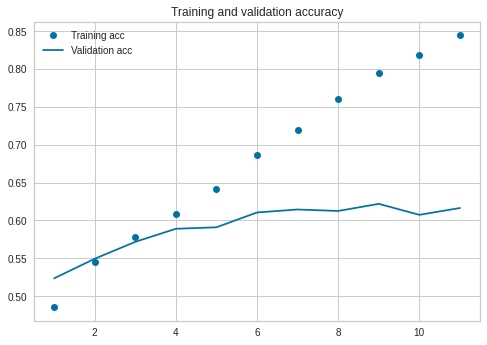

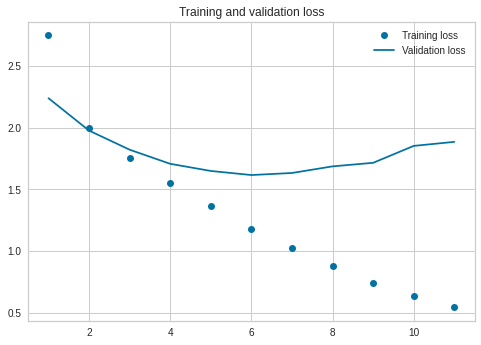

In [ ]:
plot_acc(history4)

###5.5.4. Classification report

In [ ]:
features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model4.predict(padded_texts)
print (np.argmax(pred))



features=["problem print measure machine bar eaodcgsw trm"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = model4.predict(padded_texts)
print (np.argmax(pred))


y_probs = model4.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

0
17
80/80 - 2s
              precision    recall  f1-score   support

           0       0.91      0.96      0.93      1168
           1       1.00      0.08      0.14        13
           2       0.88      0.57      0.69        51
           3       0.43      0.50      0.46         6
           4       0.73      0.75      0.74        81
           5       0.47      0.74      0.57        38
           6       0.57      0.82      0.67        34
           7       0.67      0.67      0.67        12
           8       0.86      0.55      0.67        22
           9       0.93      1.00      0.96        26
          10       0.64      0.55      0.59        29
          11       0.74      0.72      0.73        76
          12       0.87      0.73      0.80        75
          13       0.35      0.64      0.45        11
          14       1.00      0.10      0.18        10
          15       0.00      0.00      0.00        10
          16       0.67      0.25      0.36         8
          1

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.5.5.Observation

We can observe that there are 1,450,270 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 10 epochs with early stopping comes with 84 in train and 61 in test which has a very large overfit and validation loss is very high


The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.The validation loss is very high



2 layers Bidirectional LSTM

##5.6.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer

###5.6.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.6.2.Model Description

This model has 1 embedding layer 2 bidirectional LSTM layers with weight matrix as glove 100 and return sequence as True and one flatten and one dense layer with output 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model007 = Sequential()
model007.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model007.add(Bidirectional(LSTM(128, return_sequences=True)))
model007.add(Bidirectional(LSTM(128, return_sequences=True)))
model007.add(Flatten())
model007.add(Dense(74,activation='softmax'))
model007.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model007.summary())

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_19 (Embedding)     (None, 673, 100)          1176000   
_________________________________________________________________
bidirectional_19 (Bidirectio (None, 673, 256)          234496    
_________________________________________________________________
bidirectional_20 (Bidirectio (None, 673, 256)          394240    
_________________________________________________________________
flatten_7 (Flatten)          (None, 172288)            0         
_________________________________________________________________
dense_25 (Dense)             (None, 74)                12749386  
Total params: 14,554,122
Trainable params: 14,554,122
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history007=model007.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 16s 273ms/step - loss: 2.2834 - accuracy: 0.5203 - val_loss: 1.9146 - val_accuracy: 0.5392
Epoch 2/30
60/60 [==============================] - 15s 258ms/step - loss: 1.5768 - accuracy: 0.6069 - val_loss: 1.7264 - val_accuracy: 0.5722
Epoch 3/30
60/60 [==============================] - 15s 255ms/step - loss: 1.2462 - accuracy: 0.6706 - val_loss: 1.5948 - val_accuracy: 0.6055
Epoch 4/30
60/60 [==============================] - 15s 254ms/step - loss: 0.9942 - accuracy: 0.7207 - val_loss: 1.6378 - val_accuracy: 0.6082
Epoch 5/30
60/60 [==============================] - 15s 253ms/step - loss: 0.7953 - accuracy: 0.7703 - val_loss: 1.6871 - val_accuracy: 0.6161
Epoch 6/30
60/60 [==============================] - 15s 254ms/step - loss: 0.6498 - accuracy: 0.8224 - val_loss: 1.6622 - val_accuracy: 0.6318
Epoch 7/30
60/60 [==============================] - 15s 255ms/step - loss: 0.5034 - accuracy: 0.8516 - val_loss: 1.9034 - val_accuracy: 0.6353

###5.6.3.Error Plot

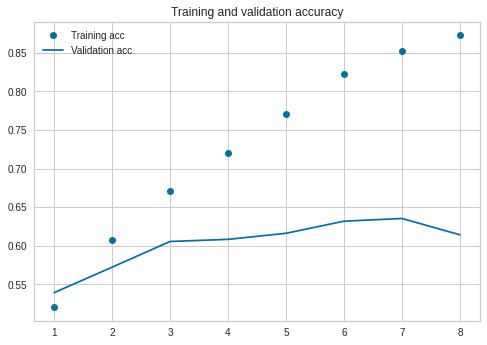

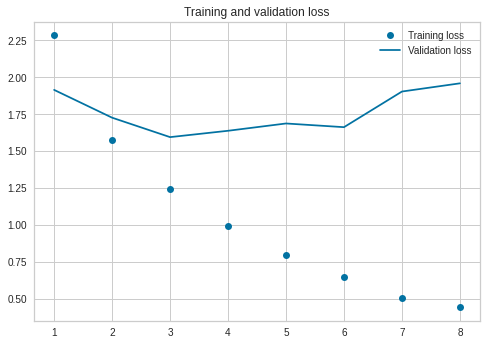

In [ ]:
plot_acc(history007)

###5.6.4. Classification report

In [ ]:



y_probs = model007.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 3s
              precision    recall  f1-score   support

           0       0.91      0.94      0.92      1168
           1       0.71      0.38      0.50        13
           2       0.77      0.53      0.63        51
           3       1.00      0.67      0.80         6
           4       0.76      0.83      0.79        81
           5       0.61      0.79      0.69        38
           6       0.81      0.74      0.77        34
           7       0.83      0.83      0.83        12
           8       0.82      0.82      0.82        22
           9       0.93      1.00      0.96        26
          10       0.81      0.45      0.58        29
          11       0.70      0.71      0.71        76
          12       0.68      0.76      0.72        75
          13       0.62      0.73      0.67        11
          14       0.73      0.80      0.76        10
          15       0.88      0.70      0.78        10
          16       1.00      0.62      0.77         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.6.5.Observation


We can observe that there are 14,554,122 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 8 epochs comes with 87 in train and 61 in test which has a larger overfit and too less training loss compare to validation loss.

The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.The validation loss is very high

##5.7.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 100 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

###5.7.1. Building of a model with one Embedding layer with glove 100d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.7.2.Model Description

This model has 1 embedding layer 2 bidirectional LSTM layers with weight matrix as glove 100 and return sequence as True and one flatten and one dense layer with 1 drop out layer and 1 spatial drop out layer .

Drop out we have used 0.3 and spatial drop out as 0.4

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import Activation, Dense, Flatten, Dropout, Bidirectional, SpatialDropout1D
model009 = Sequential()
model009.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model009.add(SpatialDropout1D(0.4))
model009.add(Bidirectional(LSTM(128, return_sequences=True)))
model009.add(Dropout(0.3))
model009.add(Bidirectional(LSTM(128, return_sequences=True)))
model009.add(Flatten())
model009.add(Dense(74,activation='softmax'))
model009.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model009.summary())

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_20 (Embedding)     (None, 673, 100)          1176000   
_________________________________________________________________
spatial_dropout1d_3 (Spatial (None, 673, 100)          0         
_________________________________________________________________
bidirectional_21 (Bidirectio (None, 673, 256)          234496    
_________________________________________________________________
dropout_5 (Dropout)          (None, 673, 256)          0         
_________________________________________________________________
bidirectional_22 (Bidirectio (None, 673, 256)          394240    
_________________________________________________________________
flatten_8 (Flatten)          (None, 172288)            0         
_________________________________________________________________
dense_26 (Dense)             (None, 74)              

In [ ]:
history009=model009.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 17s 280ms/step - loss: 2.3559 - accuracy: 0.5104 - val_loss: 1.9774 - val_accuracy: 0.5337
Epoch 2/30
60/60 [==============================] - 16s 263ms/step - loss: 1.8245 - accuracy: 0.5657 - val_loss: 1.8343 - val_accuracy: 0.5584
Epoch 3/30
60/60 [==============================] - 16s 260ms/step - loss: 1.5581 - accuracy: 0.6059 - val_loss: 1.6473 - val_accuracy: 0.5902
Epoch 4/30
60/60 [==============================] - 15s 258ms/step - loss: 1.3975 - accuracy: 0.6269 - val_loss: 1.6826 - val_accuracy: 0.5922
Epoch 5/30
60/60 [==============================] - 15s 258ms/step - loss: 1.2505 - accuracy: 0.6598 - val_loss: 1.5893 - val_accuracy: 0.6184
Epoch 6/30
60/60 [==============================] - 16s 258ms/step - loss: 1.1226 - accuracy: 0.6894 - val_loss: 1.6487 - val_accuracy: 0.6110
Epoch 7/30
60/60 [==============================] - 16s 260ms/step - loss: 1.0121 - accuracy: 0.7076 - val_loss: 1.6905 - val_accuracy: 0.6090

###5.7.3.Error Plot

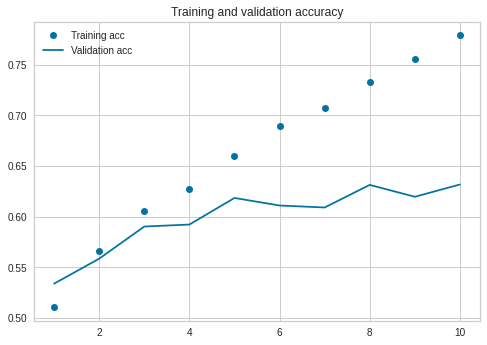

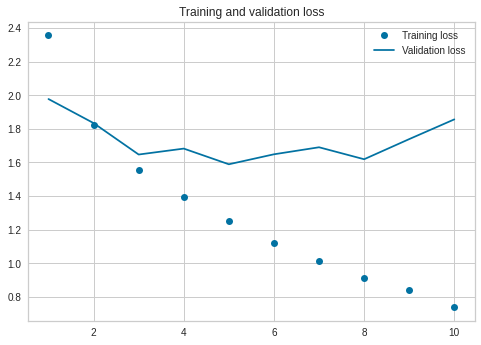

In [ ]:
plot_acc(history009)

###5.7.4. Classification report

In [ ]:



y_probs = model009.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 3s
              precision    recall  f1-score   support

           0       0.81      0.98      0.88      1168
           1       1.00      0.54      0.70        13
           2       0.89      0.49      0.63        51
           3       0.50      0.17      0.25         6
           4       0.89      0.68      0.77        81
           5       0.64      0.66      0.65        38
           6       0.84      0.62      0.71        34
           7       1.00      0.58      0.74        12
           8       0.81      0.77      0.79        22
           9       0.93      1.00      0.96        26
          10       1.00      0.62      0.77        29
          11       0.73      0.47      0.58        76
          12       0.83      0.64      0.72        75
          13       0.83      0.45      0.59        11
          14       0.80      0.80      0.80        10
          15       0.73      0.80      0.76        10
          16       0.60      0.38      0.46         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.7.5.Observation

We can observe that there are 14,554,122 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 10 epochs comes with 77 in train and 63 in test which has a less overfit compare to all other models and one of the best performance we got so far.Though there is high imbalance


The classification Report depicts the f1 score came poor for many groups among 74 but the overall performance is best among all models we have tried so far on complete data set.

#300D

##5.8. Create the deep learning base model with glove 300d weight matrix


5.8.1. Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.



5.8.2.Tokenization and vocab creation


5.8.3.Base Model with categorical_crossentropy and adam optimizer



5.8.4.Error Plot

5.8.5. Classification Report


5.8.6.Observation

##5.9.Create one layer bidirectional LSTM deep learning model with glove 300

5.9.1. Building of a model with one Embedding with glove 300d weight matrix, one bidirectional LSTM and one Dense layer to check the accuracy.
5.9.2.Bi directional LSTM Model with categorical_crossentropy and adam optimizer
5.9.3.Error Plot
5.9.4. Classiication report
5.9.5.Observation
##5.10.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 300 embedding and 3 dense layers

5.10.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

5.10.2.Model Description

5.10.3.Error Plot

5.10.4. Classification report

5.10.5.Observation


#5.11.Create one layer bidirectional LSTM deep learning model with flatten and return sequence as True and glove 300 embedding
5.11.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM with return sequence as True and one flatten and one Dense layer.
5.11.2.Model Description
5.11.3.Error Plot
5.11.4. Classification report
5.11.5.Observation



##5.12.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer
5.12.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer.

5.12.2.Model Description

5.12.3.Error Plot

5.12.4. Classification report

5.12.5.Observation

##5.13.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

5.13.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer


5.13.2.Model Description

5.13.3.Error Plot

5.13.4. Classification report

5.13.5.Observation


##5.8.Create the deep learning base model with glove 300d weight matrix

###5.8.1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.

Embedding file import

In [ ]:
EMBEDDING_FILE_300d = '/content/drive/My Drive/glove.6B.300d.txt'

In [ ]:
embeddings_index = {}
f = open(EMBEDDING_FILE_300d)
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


###5.8.2.Tokenization and vocab creation

In [ ]:
embedding_dim = 300
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < vocab_size:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_padded,X_test_Glove_padded=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.8.3.Base Model with categorical_crossentropy and adam optimizer

This model has 1 embedding layer with glove 300d weight matrix, 1 LSTM layer with output 128 and return sequence as false and one dense layer with output 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model11 = Sequential()
model11.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model11.add(LSTM(128, return_sequences=False))
model11.add(Dense(74, activation='softmax'))
model11.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model11.summary())

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_21 (Embedding)     (None, 673, 300)          3528000   
_________________________________________________________________
lstm_29 (LSTM)               (None, 128)               219648    
_________________________________________________________________
dense_27 (Dense)             (None, 74)                9546      
Total params: 3,757,194
Trainable params: 3,757,194
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history11=model11.fit(X_train_Glove_padded,y_train_Glove,validation_data=(X_test_Glove_padded,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 8s 132ms/step - loss: 2.5366 - accuracy: 0.4976 - val_loss: 2.0505 - val_accuracy: 0.5486
Epoch 2/30
60/60 [==============================] - 8s 126ms/step - loss: 1.8511 - accuracy: 0.5674 - val_loss: 1.7296 - val_accuracy: 0.6012
Epoch 3/30
60/60 [==============================] - 8s 126ms/step - loss: 1.5216 - accuracy: 0.6227 - val_loss: 1.6007 - val_accuracy: 0.6027
Epoch 4/30
60/60 [==============================] - 8s 127ms/step - loss: 1.2810 - accuracy: 0.6666 - val_loss: 1.5087 - val_accuracy: 0.6235
Epoch 5/30
60/60 [==============================] - 8s 127ms/step - loss: 1.0556 - accuracy: 0.7165 - val_loss: 1.4899 - val_accuracy: 0.6361
Epoch 6/30
60/60 [==============================] - 8s 126ms/step - loss: 0.8886 - accuracy: 0.7607 - val_loss: 1.4399 - val_accuracy: 0.6447
Epoch 7/30
60/60 [==============================] - 8s 126ms/step - loss: 0.7431 - accuracy: 0.7966 - val_loss: 1.4326 - val_accuracy: 0.6400
Epoch 

###5.8.4.Error Plot

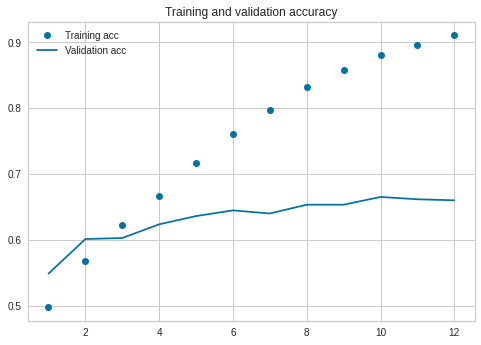

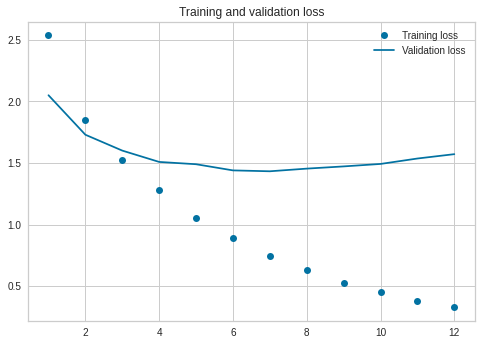

In [ ]:
plot_acc(history11)

###5.8.5. Classification Report

In [ ]:


y_probs = model11.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 1s
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      1168
           1       0.75      0.69      0.72        13
           2       0.84      0.63      0.72        51
           3       0.67      0.67      0.67         6
           4       0.91      0.83      0.86        81
           5       0.87      0.89      0.88        38
           6       0.88      0.88      0.88        34
           7       0.91      0.83      0.87        12
           8       0.84      0.95      0.89        22
           9       1.00      0.96      0.98        26
          10       0.72      0.90      0.80        29
          11       0.82      0.74      0.78        76
          12       0.77      0.77      0.77        75
          13       0.88      0.64      0.74        11
          14       0.88      0.70      0.78        10
          15       0.82      0.90      0.86        10
          16       0.67      0.50      0.57         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.8.6.Observation

We can observe that there are 3,757,194 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 12 epochs comes with 91 in train and 66 in test which has a very large overfit and too less training loss compare to validation loss.

The error plot also explains the overfit.

Classification report depicts that  the scores are not good we will try to improve more.The classification report did not went well due to hudge imbalance in complete data

##5.9.Create one layer bidirectional LSTM deep learning model with glove 300

###5.9.1.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

This model has 1 embedding layer with glove 300d weight matrix, 1 Bi directional LSTM layer with output 128 and return sequence as false and one dense layer with output 74 with soft max in dense layer as activation

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_padded,X_test_Glove_padded=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.9.2.Bi directional LSTM Model with categorical_crossentropy and adam optimizer

In [ ]:
from tensorflow.keras.layers import LSTM, Embedding, Dense, Dropout, Bidirectional

model12 = Sequential()
model12.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
#model2.add(Dropout(0.1))
model12.add(Bidirectional(LSTM(128, return_sequences=False)))
model12.add(Dense(74, activation='softmax'))
#model2.add(Dropout(0.1))
#model2.add(Bidirectional(LSTM(128, return_sequences=False)))
#model2.add(Dense(74, activation='softmax'))

model12.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model12.summary())

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_22 (Embedding)     (None, 673, 300)          3528000   
_________________________________________________________________
bidirectional_23 (Bidirectio (None, 256)               439296    
_________________________________________________________________
dense_28 (Dense)             (None, 74)                19018     
Total params: 3,986,314
Trainable params: 3,986,314
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
history12=model12.fit(X_train_Glove_padded,y_train_Glove,validation_data=(X_test_Glove_padded,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 12s 203ms/step - loss: 2.4665 - accuracy: 0.4990 - val_loss: 2.0033 - val_accuracy: 0.5420
Epoch 2/30
60/60 [==============================] - 11s 189ms/step - loss: 1.7619 - accuracy: 0.5825 - val_loss: 1.7296 - val_accuracy: 0.5863
Epoch 3/30
60/60 [==============================] - 11s 188ms/step - loss: 1.4505 - accuracy: 0.6328 - val_loss: 1.5563 - val_accuracy: 0.6192
Epoch 4/30
60/60 [==============================] - 11s 188ms/step - loss: 1.2412 - accuracy: 0.6756 - val_loss: 1.4687 - val_accuracy: 0.6235
Epoch 5/30
60/60 [==============================] - 11s 188ms/step - loss: 1.0641 - accuracy: 0.7145 - val_loss: 1.4249 - val_accuracy: 0.6306
Epoch 6/30
60/60 [==============================] - 11s 188ms/step - loss: 0.8905 - accuracy: 0.7556 - val_loss: 1.4130 - val_accuracy: 0.6412
Epoch 7/30
60/60 [==============================] - 11s 189ms/step - loss: 0.7561 - accuracy: 0.7933 - val_loss: 1.3809 - val_accuracy: 0.6584

###5.9.3.Error Plot

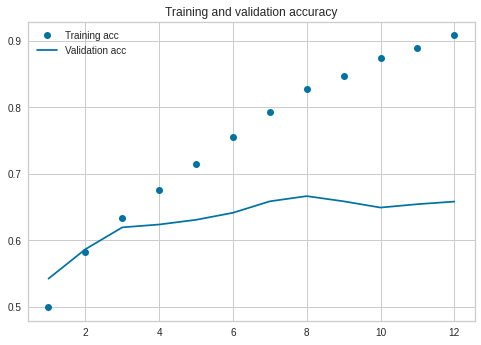

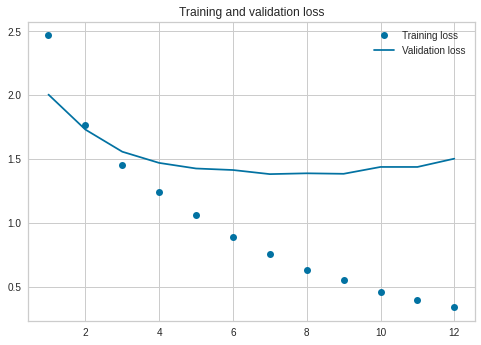

In [ ]:
plot_acc(history12)

###5.9.4. Classiication report

In [ ]:



y_probs = model12.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 2s
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      1168
           1       0.80      0.62      0.70        13
           2       0.97      0.73      0.83        51
           3       0.83      0.83      0.83         6
           4       0.82      0.84      0.83        81
           5       0.68      0.74      0.71        38
           6       0.85      0.65      0.73        34
           7       1.00      0.33      0.50        12
           8       0.93      0.64      0.76        22
           9       1.00      0.96      0.98        26
          10       0.72      0.79      0.75        29
          11       0.68      0.67      0.68        76
          12       0.87      0.69      0.77        75
          13       0.71      0.45      0.56        11
          14       1.00      0.60      0.75        10
          15       0.86      0.60      0.71        10
          16       1.00      0.50      0.67         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.9.5.Observation

We can observe that there are 3,986,314  trainable parameters and 0 nontrainable parameters in model.

The accuracy after 12 epochs comes with 90 in train and 65 in test which has a very large overfit and too less training loss compare to validation loss.

The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.

##5.10.Create one layer bidirectional LSTM deep learning model with GlobalMaxPool1D and return sequence as True and glove 300 embedding and 3 dense layers

###5.10.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM with return sequence as True,1 globalmaxpool1D,3 Dense layers.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_Glove_padded,X_test_Glove_padded=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.10.2.Model Description

This model has 1 embedding layer with glove 300d embedding and 1 bidirectional LSTM layer with output 128 and return sequence as true and one globalmaxpool1D layer and 3 dense layers with final layer having output as 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
model14 = Sequential()
model14.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix]))
model14.add(Bidirectional(LSTM(units=128 , return_sequences = True)))
model14.add(GlobalMaxPool1D())
model14.add(Dense(100, activation="relu"))
#model14.add(Dropout(0.5))
model14.add(Dense(80, activation="relu"))
#model14.add(Dropout(0.5))
model14.add(Dense(74, activation="softmax"))
model14.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model14.summary())

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_23 (Embedding)     (None, None, 300)         3528000   
_________________________________________________________________
bidirectional_24 (Bidirectio (None, None, 256)         439296    
_________________________________________________________________
global_max_pooling1d_3 (Glob (None, 256)               0         
_________________________________________________________________
dense_29 (Dense)             (None, 100)               25700     
_________________________________________________________________
dense_30 (Dense)             (None, 80)                8080      
_________________________________________________________________
dense_31 (Dense)             (None, 74)                5994      
Total params: 4,007,070
Trainable params: 4,007,070
Non-trainable params: 0
___________________________________________

In [ ]:
history14=model14.fit(X_train_Glove_padded,y_train_Glove,validation_data=(X_test_Glove_padded,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 14s 228ms/step - loss: 2.6064 - accuracy: 0.5045 - val_loss: 2.0573 - val_accuracy: 0.5314
Epoch 2/30
60/60 [==============================] - 12s 195ms/step - loss: 1.8050 - accuracy: 0.5667 - val_loss: 1.7377 - val_accuracy: 0.5882
Epoch 3/30
60/60 [==============================] - 12s 197ms/step - loss: 1.4618 - accuracy: 0.6299 - val_loss: 1.5480 - val_accuracy: 0.6208
Epoch 4/30
60/60 [==============================] - 12s 194ms/step - loss: 1.1861 - accuracy: 0.6818 - val_loss: 1.4510 - val_accuracy: 0.6286
Epoch 5/30
60/60 [==============================] - 12s 195ms/step - loss: 0.9345 - accuracy: 0.7504 - val_loss: 1.4552 - val_accuracy: 0.6435
Epoch 6/30
60/60 [==============================] - 12s 193ms/step - loss: 0.7135 - accuracy: 0.8035 - val_loss: 1.5496 - val_accuracy: 0.6302
Epoch 7/30
60/60 [==============================] - 12s 194ms/step - loss: 0.5495 - accuracy: 0.8528 - val_loss: 1.5931 - val_accuracy: 0.6349

###5.10.3.Error Plot

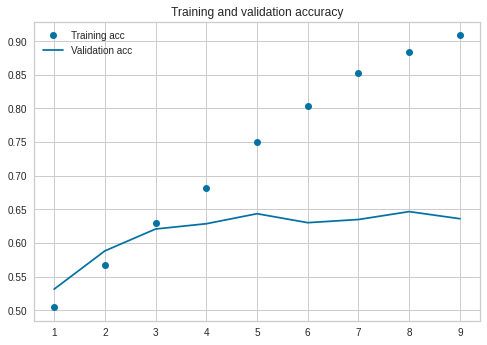

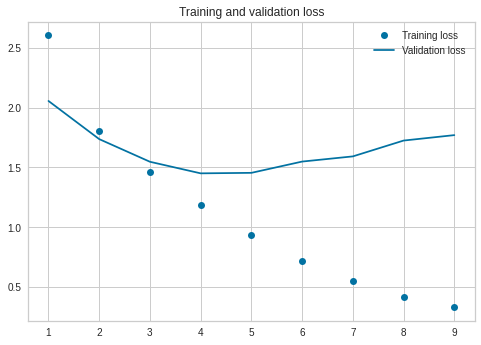

In [ ]:
plot_acc(history14)

###5.10.4. Classification report

In [ ]:
y_probs = model14.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 2s
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1168
           1       0.89      0.62      0.73        13
           2       0.94      0.59      0.72        51
           3       0.42      0.83      0.56         6
           4       0.81      0.85      0.83        81
           5       0.76      0.82      0.78        38
           6       0.74      0.91      0.82        34
           7       0.83      0.83      0.83        12
           8       0.89      0.73      0.80        22
           9       1.00      0.96      0.98        26
          10       1.00      0.76      0.86        29
          11       0.86      0.74      0.79        76
          12       0.90      0.81      0.85        75
          13       0.75      0.55      0.63        11
          14       0.50      0.40      0.44        10
          15       0.88      0.70      0.78        10
          16       0.64      0.88      0.74         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.10.5.Observation

We can observe that there are 4,007,070 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 9 epochs with early stopping comes with 90 in train and 63 in test which has a very large overfit and too less training loss compare to validation loss.


The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.

#5.11.Create one layer bidirectional LSTM deep learning model with flatten and return sequence as True and glove 300 embedding

###5.11.1. Building of a model with one Embedding layer with glove 300d weight matrix, one bidirectional LSTM with return sequence as True and one flatten and one Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.11.2.Model Description

This model has 1 embedding layer with glov 100d 1 bi directional LSTM layer with output 128 and return sequence as true, one flatten layer and one dense layer with output 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import TimeDistributed
from keras.models import Sequential 
from keras.layers import Activation, Dense, Flatten 

model1j3 = Sequential()
model1j3.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model1j3.add(Bidirectional(LSTM(128, return_sequences=True)))
model1j3.add(Flatten())
model1j3.add(Dense(74, activation='softmax'))
model1j3.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model1j3.summary())

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_16 (Embedding)     (None, 673, 300)          3474900   
_________________________________________________________________
bidirectional_16 (Bidirectio (None, 673, 256)          439296    
_________________________________________________________________
flatten_6 (Flatten)          (None, 172288)            0         
_________________________________________________________________
dense_21 (Dense)             (None, 74)                12749386  
Total params: 16,663,582
Trainable params: 16,663,582
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
historyj3=model1j3.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 13s 216ms/step - loss: 2.1707 - accuracy: 0.5279 - val_loss: 1.7277 - val_accuracy: 0.5949
Epoch 2/30
60/60 [==============================] - 12s 203ms/step - loss: 1.2682 - accuracy: 0.6714 - val_loss: 1.6394 - val_accuracy: 0.6145
Epoch 3/30
60/60 [==============================] - 12s 203ms/step - loss: 0.8359 - accuracy: 0.7647 - val_loss: 1.6453 - val_accuracy: 0.6157
Epoch 4/30
60/60 [==============================] - 12s 205ms/step - loss: 0.5612 - accuracy: 0.8429 - val_loss: 1.6857 - val_accuracy: 0.6318
Epoch 5/30
60/60 [==============================] - 12s 205ms/step - loss: 0.4920 - accuracy: 0.8726 - val_loss: 1.8178 - val_accuracy: 0.6408
Epoch 6/30
60/60 [==============================] - 12s 206ms/step - loss: 0.3565 - accuracy: 0.9024 - val_loss: 1.9334 - val_accuracy: 0.6345
Epoch 7/30
60/60 [==============================] - 12s 206ms/step - loss: 0.3256 - accuracy: 0.9173 - val_loss: 1.8768 - val_accuracy: 0.6412

###5.11.3.Error Plot

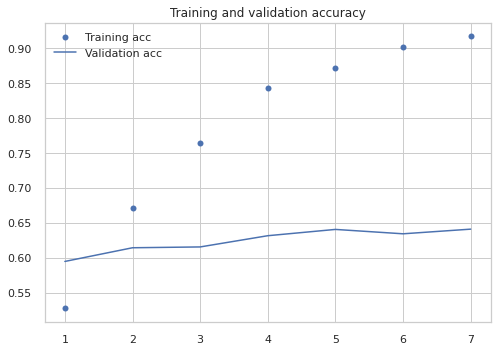

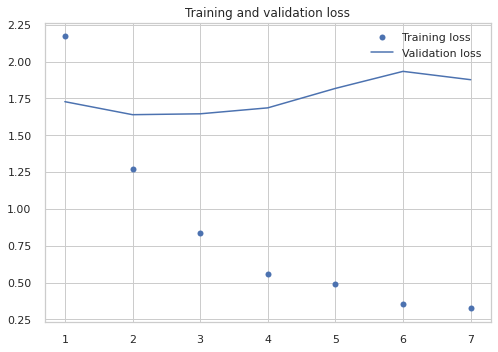

In [ ]:
plot_acc(historyj3)

###5.11.4. Classification report

In [ ]:
y_probs = model1j3.predict(X_test_Glove_bi_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_Glove_bi, y_pred)
print(report)

80/80 - 2s
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1174
           1       0.80      0.50      0.62         8
           2       0.89      0.70      0.78        44
           3       0.62      0.80      0.70        10
           4       0.78      0.86      0.82        81
           5       0.62      0.79      0.69        33
           6       0.91      0.79      0.85        38
           7       1.00      0.83      0.91        12
           8       0.95      0.76      0.84        25
           9       0.96      1.00      0.98        23
          10       0.84      0.59      0.70        27
          11       0.78      0.77      0.78        65
          12       0.82      0.83      0.83        78
          13       0.73      0.67      0.70        12
          14       0.91      0.83      0.87        12
          15       1.00      0.89      0.94         9
          16       0.86      0.86      0.86         7
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.11.5.Observation

We can observe that there are 16,663,582 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 7 epochs comes with 91 in train and 64 in test which has a very large overfit and too less training loss compare to validation loss.

The classification Report depicts the f1 score came poor for many groups among 74 along with that due to large overfit we cannot select this model.


##5.12.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer


###5.12.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer.

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.12.2.Model Description

This model has 1 embedding layer 2 bidirectional LSTM layers with weight matrix as glove 300 and return sequence as True and one flatten and one dense layer with output 74

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
modelj007 = Sequential()
modelj007.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
modelj007.add(Bidirectional(LSTM(128, return_sequences=True)))
modelj007.add(Bidirectional(LSTM(128, return_sequences=True)))
modelj007.add(Flatten())
modelj007.add(Dense(74,activation='softmax'))
modelj007.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(modelj007.summary())

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_25 (Embedding)     (None, 673, 300)          3528000   
_________________________________________________________________
bidirectional_26 (Bidirectio (None, 673, 256)          439296    
_________________________________________________________________
bidirectional_27 (Bidirectio (None, 673, 256)          394240    
_________________________________________________________________
flatten_9 (Flatten)          (None, 172288)            0         
_________________________________________________________________
dense_35 (Dense)             (None, 74)                12749386  
Total params: 17,110,922
Trainable params: 17,110,922
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
historyj007=model007.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 15s 255ms/step - loss: 0.7801 - accuracy: 0.8029 - val_loss: 0.7774 - val_accuracy: 0.8063
Epoch 2/30
60/60 [==============================] - 15s 255ms/step - loss: 0.5126 - accuracy: 0.8496 - val_loss: 0.9354 - val_accuracy: 0.7933
Epoch 3/30
60/60 [==============================] - 15s 255ms/step - loss: 0.3854 - accuracy: 0.8859 - val_loss: 0.9135 - val_accuracy: 0.7929
Epoch 4/30
60/60 [==============================] - 15s 255ms/step - loss: 0.3210 - accuracy: 0.8995 - val_loss: 1.0294 - val_accuracy: 0.7682
Epoch 5/30
60/60 [==============================] - 15s 255ms/step - loss: 0.2721 - accuracy: 0.9163 - val_loss: 0.9627 - val_accuracy: 0.8035
Epoch 6/30
60/60 [==============================] - 15s 255ms/step - loss: 0.2387 - accuracy: 0.9222 - val_loss: 1.0076 - val_accuracy: 0.7929


###5.12.3.Error Plot

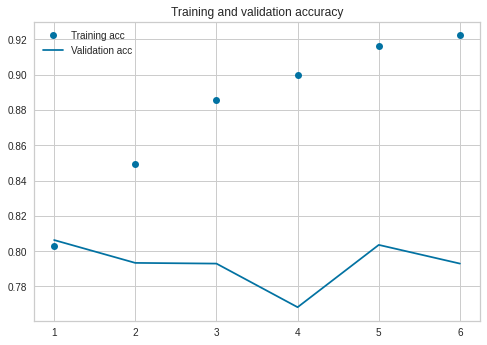

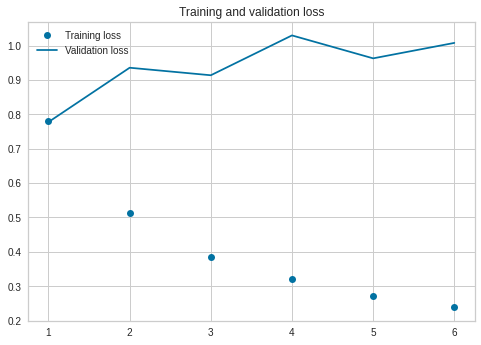

In [ ]:
plot_acc(historyj007)

###5.12.4. Classification report

In [ ]:
y_probs = modelj007.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 3s
              precision    recall  f1-score   support

           0       0.35      0.01      0.01      1168
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        51
           3       0.01      0.17      0.01         6
           4       0.00      0.00      0.00        81
           5       0.00      0.00      0.00        38
           6       0.00      0.00      0.00        34
           7       0.00      0.00      0.00        12
           8       0.00      0.00      0.00        22
           9       0.00      0.00      0.00        26
          10       0.00      0.00      0.00        29
          11       0.25      0.01      0.03        76
          12       0.00      0.00      0.00        75
          13       0.00      0.00      0.00        11
          14       0.02      0.10      0.03        10
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.12.5.Observation

We can observe that there are 17,110,922 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 7 epochs are getting decreased and the behaviour is not expected it is not a stable model we will not go further with this model

##5.13.Create two layers bidirectional LSTM deep learning model with return sequence as True and glove 300 embedding and 1 dense layer and 1 flatten layer ,1 drop out layer and 1 spatial drop out layer

###5.13.1. Building of a model with one Embedding layer with glove 300d weight matrix, two bidirectional LSTM layers with return sequence as True,1 flatten and 1 Dense layer, 1 drop out layer and 1 spatial drop out layer

In [ ]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [ ]:
X_train_padded_Glove,X_test_padded_Glove=padd_sequence(X_train_Glove,X_test_Glove)

(2550, 673) (5950, 673)


###5.13.2.Model Description

This model has 1 embedding layer 2 bidirectional LSTM layers with weight matrix as glove 100 and return sequence as True and one flatten and one dense layer with 1 drop out layer and 1 spatial drop out layer .

Drop out we have used 0.3 and spatial drop out as 0.4

Loss we have used catagorical_crossentropy and optimizer is adam and metrics is accuracy

In [ ]:
from keras.layers import Activation, Dense, Flatten, Dropout, Bidirectional, SpatialDropout1D
modelh009 = Sequential()
modelh009.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
modelh009.add(SpatialDropout1D(0.4))
modelh009.add(Bidirectional(LSTM(128, return_sequences=True)))
modelh009.add(Dropout(0.3))
modelh009.add(Bidirectional(LSTM(128, return_sequences=True)))
modelh009.add(Flatten())
modelh009.add(Dense(74,activation='softmax'))
modelh009.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(modelh009.summary())

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_26 (Embedding)     (None, 673, 300)          3528000   
_________________________________________________________________
spatial_dropout1d_4 (Spatial (None, 673, 300)          0         
_________________________________________________________________
bidirectional_28 (Bidirectio (None, 673, 256)          439296    
_________________________________________________________________
dropout_6 (Dropout)          (None, 673, 256)          0         
_________________________________________________________________
bidirectional_29 (Bidirectio (None, 673, 256)          394240    
_________________________________________________________________
flatten_10 (Flatten)         (None, 172288)            0         
_________________________________________________________________
dense_36 (Dense)             (None, 74)              

In [ ]:
historyh009=modelh009.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=5)])

Epoch 1/30
60/60 [==============================] - 21s 344ms/step - loss: 2.3079 - accuracy: 0.5143 - val_loss: 1.7136 - val_accuracy: 0.5988
Epoch 2/30
60/60 [==============================] - 20s 326ms/step - loss: 1.6132 - accuracy: 0.5987 - val_loss: 1.5599 - val_accuracy: 0.6075
Epoch 3/30
60/60 [==============================] - 20s 326ms/step - loss: 1.3162 - accuracy: 0.6492 - val_loss: 1.5500 - val_accuracy: 0.6447
Epoch 4/30
60/60 [==============================] - 20s 326ms/step - loss: 1.1052 - accuracy: 0.7003 - val_loss: 1.5235 - val_accuracy: 0.6471
Epoch 5/30
60/60 [==============================] - 20s 326ms/step - loss: 0.9241 - accuracy: 0.7350 - val_loss: 1.6938 - val_accuracy: 0.6459
Epoch 6/30
60/60 [==============================] - 20s 326ms/step - loss: 0.7789 - accuracy: 0.7691 - val_loss: 1.6659 - val_accuracy: 0.6502
Epoch 7/30
60/60 [==============================] - 20s 328ms/step - loss: 0.6827 - accuracy: 0.7973 - val_loss: 1.6764 - val_accuracy: 0.6553

###5.13.3.Error Plot

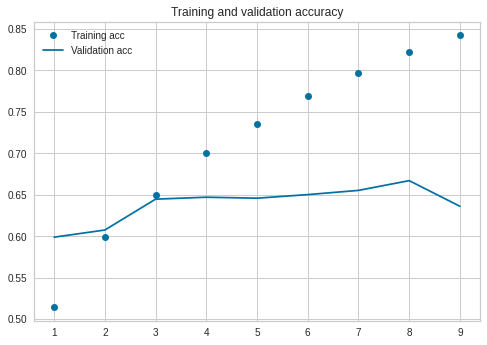

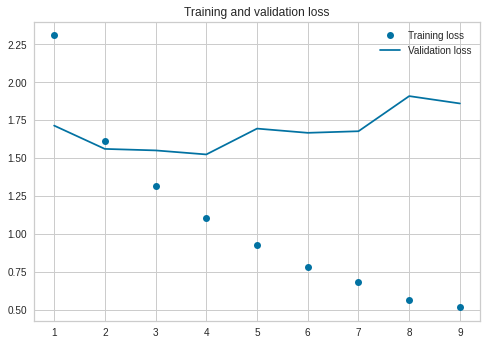

In [ ]:
plot_acc(historyh009)

###5.13.4. Classification report

In [ ]:
y_probs = modelh009.predict(X_test_padded, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_basic, y_pred)
print(report)

80/80 - 4s
              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1168
           1       0.64      0.69      0.67        13
           2       0.87      0.65      0.74        51
           3       0.56      0.83      0.67         6
           4       0.88      0.72      0.79        81
           5       0.69      0.76      0.72        38
           6       0.67      0.85      0.75        34
           7       0.89      0.67      0.76        12
           8       0.50      0.95      0.66        22
           9       0.93      1.00      0.96        26
          10       0.77      0.79      0.78        29
          11       0.81      0.58      0.68        76
          12       0.71      0.80      0.75        75
          13       0.80      0.73      0.76        11
          14       0.70      0.70      0.70        10
          15       0.90      0.90      0.90        10
          16       0.71      0.62      0.67         8
          17    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###5.13.5.Observation

We can observe that there are 17,110,922 trainable parameters and 0 nontrainable parameters in model.

The accuracy after 9 epochs comes with 84 in train and 63 in test which has a less overfit compare to all other models and one of the comparatively well  performance we got so far in 300d.Though there is high imbalance


The classification Report depicts the f1 score came poor for many groups among 74 but the overall performance is best among all models fr 300 d we have tried so far on complete data set




#6.Final model check for Deployment

In [ ]:
from keras.models import load_model
import os
os.chdir('/content/drive/My Drive/')

In [ ]:
modelchk=load_model('model009.h5')

In [ ]:
modelchk.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_8 (Embedding)      (None, 352, 100)          674300    
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 352, 100)          0         
_________________________________________________________________
bidirectional_7 (Bidirection (None, 352, 256)          234496    
_________________________________________________________________
dropout_1 (Dropout)          (None, 352, 256)          0         
_________________________________________________________________
bidirectional_8 (Bidirection (None, 352, 256)          394240    
_________________________________________________________________
flatten_3 (Flatten)          (None, 90112)             0         
_________________________________________________________________
dense_10 (Dense)             (None, 5)                

In [ ]:
finalticketsummary=finaldataset

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(finalticketsummary["CleanTextAfterRemoveStopword"])
word_index = tokenizer.word_index
vocab_size=len(word_index)+1

In [ ]:
import numpy as np
features=["unable to access hr tool page"]
#tokenizer = Tokenizer()
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
pred = modelchk.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])


features=["probleme mit com port maschine st hrmann eaodcgsw trmzwbyc"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
print(testval)
pred = modelchk.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

[[9.9994910e-01 2.6151160e-05 2.8702768e-06 1.9791967e-06 1.9895113e-05]]
Group_0
[[298, 169, 170, 444, 3890, 786, 1760, 1761, 1762]]
[[1.04208732e-06 2.71091579e-07 9.99988079e-01 1.05065865e-05
  1.14073259e-07]]
Group_24


In [ ]:
features=["circuit outage india carrier company"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
print(testval)
pred = modelchk.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

[[44, 33, 219, 862, 10]]
[[0.2927362  0.0414526  0.01737155 0.63046664 0.01797304]]
Group_8


In [ ]:
features=["usa file server hostname fail hard drive"]
testval = tokenizer.texts_to_sequences(features)
padded_texts = pad_sequences(testval, maxlen=352)
print(testval)
pred = modelchk.predict(padded_texts)
print (pred)
list=['Group_0','Group_12','Group_24','Group_8','Group_9']
print(list[np.argmax(pred)])

[[81, 120, 71, 38, 16, 237, 125]]
[[1.1758213e-02 9.4666022e-01 1.7867922e-05 3.8927320e-02 2.6363195e-03]]
Group_12


In [ ]:
finalticketsummary.loc[finalticketsummary['CleanTextAfterRemoveStopword']=="usa file server hostname fail hard drive"]

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword,Assignment group_num,WordLength
493,GRP_12,usa file server hostname fail hard drive,"[usa, file, server, hostname, fail, hard, drive]",1,7


In [ ]:
finalticketsummary.loc[finalticketsummary['CleanTextAfterRemoveStopword']=="probleme mit com port maschine st hrmann eaodcgsw trmzwbyc"]

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword,Assignment group_num,WordLength
2019,GRP_24,probleme mit com port maschine st hrmann eaodc...,"[probleme, mit, com, port, maschine, st, hrman...",2,9


#Pretrained Model

#7.Fasttext


##7.1Load top 5 data set

In [ ]:
finaldata = '/content/drive/My Drive/final_top5.pkl'

In [ ]:
finaldataset=pd.read_pickle(finaldata)

In [ ]:
finaldataset.shape

(5435, 3)

In [ ]:
finaldataset.head(5)

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


##7.2 Test Train split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(finaldataset['CleanTextAfterRemoveStopword'], finaldataset['Assignment group'],
                                                    stratify=finaldataset['Assignment group'],
                                                    test_size=0.10)


In [ ]:
X_train.shape

(4891,)

##7.3 Creation of test.txt file as Fast text receives input in a specific format for target variable so we will create 2 text files one for text another for train

In [ ]:
with open("/content/drive/My Drive/test.txt", "w") as test_file_handler:
    for X_test_entry, y_test_entry in zip(X_test, y_test):
        line_to_write = "__label__" + str(y_test_entry) + "\t" + str(X_test_entry) + "\n"
        try:
            test_file_handler.write(line_to_write)
        except:
            print(line_to_write)
            break


In [ ]:
# Write the train file.
with open("/content/drive/My Drive/train.txt", "w") as train_file_handler:
    for X_train_entry, y_train_entry in zip(X_train, y_train):
        line_to_write = "__label__" + str(y_train_entry) + "\t" + str(X_train_entry) + "\n"
        try:
            train_file_handler.write(line_to_write)
        except:
            print(line_to_write)
            break

In [ ]:
pip install fasttext

In [ ]:
import re
import datetime
import fasttext

##7.4:Fit the model with epoch 30 There are multiple parameters we have tried multiple combination of LR and loss and Epochs and this is the best result we got

In [ ]:
model = fasttext.train_supervised(input="/content/drive/My Drive/train.txt",epoch=30)

##7.5.Model performance

We can see the precision and recall is coming as 92% which is quite good

In [ ]:
def print_results(N, p, r):
    print("N\t" + str(N))
    print("P@{}\t{:.3f}".format(1, p))
    print("R@{}\t{:.3f}".format(1, r))

results = model.test("/content/drive/My Drive/test.txt")
print_results(*results)

N	544
P@1	0.921
R@1	0.921


##7.6.Prediction

In [ ]:
model.predict("job job fail job scheduler receive job",2)

(('__label__GRP_8', '__label__GRP_9'), array([0.566953, 0.409367]))

In [ ]:
model.save_model("/content/drive/My Drive/modelfasttext.bin")

In [ ]:
model.predict("login disconnect")

(('__label__GRP_0',), array([1.000009]))

##7.7. Create a dataframe having actual and predicted column and on predicted column appy text preprocessing techniques and apply label encoder on actual and predicted column and find the accuracy and Display the output

In [ ]:
col_one_list = X_test.tolist()


In [ ]:
grp=y_test.tolist()

In [ ]:
m=[]
for i in col_one_list: 
    m.append(model.predict(i))


In [ ]:
df_pred_result = pd.DataFrame(m, 
               columns =['Pred', 'Confidence']) 

In [ ]:
df_pred_result['CleanTextAfterRemoveStopword']=col_one_list

In [ ]:
df_pred_result['Actual']=grp

In [ ]:
df_pred_result.head(10)

,Pred,Confidence,CleanTextAfterRemoveStopword,Actual
0,"(__label__GRP_0,)",[0.9410046935081482],erp runtime error I eventually see receive goo...,GRP_0
1,"(__label__GRP_12,)",[0.7766759991645813],issue user profile hostname seem mess server n...,GRP_12
2,"(__label__GRP_0,)",[1.0000067949295044],blank call,GRP_0
3,"(__label__GRP_0,)",[1.0000098943710327],need see unread email,GRP_0
4,"(__label__GRP_24,)",[0.9947632551193237],calculator steli measuring device not work jio...,GRP_24
5,"(__label__GRP_0,)",[0.9999938011169434],collaboration platform online not open opening...,GRP_0
6,"(__label__GRP_8,)",[0.5669534802436829],job job fail job scheduler receive job,GRP_8
7,"(__label__GRP_8,)",[0.9986624121665955],circuit outage india kirty telecom vendor sinc...,GRP_8
8,"(__label__GRP_24,)",[0.9950507283210754],support r umzug qvncizuf ueiybanz,GRP_24
9,"(__label__GRP_0,)",[1.0000100135803223],unable connect vpn,GRP_0


In [ ]:
def text_preprocessing_newt(text):
    strText = str(text)    
    cleanText = re.sub(r'[^a-zA-Z0-9\s]',' ',strText) 
    #cleanText = re.sub(r'[label\s]',' ',cleanText) 
    return cleanText

In [ ]:
df_pred_result["Prediction"]=df_pred_result["Pred"].apply(text_preprocessing_newt)

In [ ]:

# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
# Encode labels in column 'species'. 
df_pred_result["Prediction"]= label_encoder.fit_transform(df_pred_result["Prediction"])  
df_pred_result["Act_acc"]= label_encoder.fit_transform(df_pred_result["Actual"]) 

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
print('Test Accuracy:')
print(accuracy_score(df_pred_result['Act_acc'], df_pred_result['Prediction']))

Test Accuracy:
0.9209558823529411


In [ ]:
report = classification_report(df_pred_result['Act_acc'], df_pred_result['Prediction'])
print(report)

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       398
           1       0.79      0.73      0.76        26
           2       0.96      0.79      0.87        29
           3       0.78      0.94      0.85        66
           4       0.64      0.28      0.39        25

    accuracy                           0.92       544
   macro avg       0.82      0.74      0.77       544
weighted avg       0.92      0.92      0.91       544



In [ ]:
def print_results(N, p, r):
    print("N\t" + str(N))
    print("P@{}\t{:.3f}".format(1, p))
    print("R@{}\t{:.3f}".format(1, r))

results = model.test("/content/drive/My Drive/train.txt")
print_results(*results)

N	4891
P@1	0.969
R@1	0.969


In [ ]:
col_one_list = X_train.tolist()
grp=y_train.tolist()
m=[]
for i in col_one_list: 
    m.append(model.predict(i))
df_pred_train = pd.DataFrame(m, 
               columns =['Pred', 'Confidence']) 
df_pred_train['CleanTextAfterRemoveStopword']=col_one_list
df_pred_train['Actual']=grp
df_pred_train.head(10)

,Pred,Confidence,CleanTextAfterRemoveStopword,Actual
0,"(__label__GRP_0,)",[0.9969123005867004],passw rter wothyehre receive hallo bitte r die...,GRP_0
1,"(__label__GRP_0,)",[0.9997506737709045],request reset microsoft online services password,GRP_0
2,"(__label__GRP_12,)",[0.9986024498939514],window disk space utilization alert hostname,GRP_12
3,"(__label__GRP_0,)",[1.0000098943710327],unable launch outlook,GRP_0
4,"(__label__GRP_0,)",[1.0000076293945312],unable access site,GRP_0
5,"(__label__GRP_0,)",[1.0000091791152954],windows account lock,GRP_0
6,"(__label__GRP_0,)",[0.9991058111190796],password reset,GRP_0
7,"(__label__GRP_0,)",[0.9973877668380737],unlock account email cell phone user qasdhyzm ...,GRP_0
8,"(__label__GRP_0,)",[1.0000100135803223],unable connect vpn,GRP_0
9,"(__label__GRP_0,)",[0.9697431921958923],lock password management tool receive please r...,GRP_0


In [ ]:
df_pred_train["Prediction"]=df_pred_train["Pred"].apply(text_preprocessing_newt)

In [ ]:

# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
# Encode labels in column 'species'. 
df_pred_train["Prediction"]= label_encoder.fit_transform(df_pred_train["Prediction"])  
df_pred_train["Act_acc"]= label_encoder.fit_transform(df_pred_train["Actual"]) 

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
print('Train Accuracy:')
print(accuracy_score(df_pred_train['Act_acc'], df_pred_train['Prediction']))

Train Accuracy:
0.9687180535677775


##7.8 Observations for Top 5 data set:

The training accuracy is coming as 96% and testing as 92% the most important part is this model is very much stable and as the precision and recall is also very good the over all performence is also very good.

##7.9 Load Full data set

In [ ]:
finaldata_all = '/content/drive/My Drive/final.pkl'

In [ ]:
finaldataset_all=pd.read_pickle(finaldata_all)

In [ ]:
finaldataset_all.shape

(8500, 3)

In [ ]:
finaldataset_all.head(5)

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(finaldataset_all['CleanTextAfterRemoveStopword'], finaldataset_all['Assignment group'],
                                                    
                                                    test_size=0.10)


In [ ]:
X_train.shape

(7650,)

##7.10 Creation of test.txt file as Fast text receives input in a specific format for target variable so we will create 2 text files one for text another for train

In [ ]:
with open("/content/drive/My Drive/test_ALL.txt", "w") as test_file_handler:
    for X_test_entry, y_test_entry in zip(X_test, y_test):
        line_to_write = "__label__" + str(y_test_entry) + "\t" + str(X_test_entry) + "\n"
        try:
            test_file_handler.write(line_to_write)
        except:
            print(line_to_write)
            break


In [ ]:
# Write the train file.
with open("/content/drive/My Drive/train_ALL.txt", "w") as train_file_handler:
    for X_train_entry, y_train_entry in zip(X_train, y_train):
        line_to_write = "__label__" + str(y_train_entry) + "\t" + str(X_train_entry) + "\n"
        try:
            train_file_handler.write(line_to_write)
        except:
            print(line_to_write)
            break

##7.11:Fit the model with epoch 30 There are multiple parameters we have tried multiple combination of LR and loss and Epochs and this is the best result we got with below combination

In [ ]:
model = fasttext.train_supervised(input="/content/drive/My Drive/train_ALL.txt",epoch=30,lr=0.5)

##7.12.Model performance and Prediction

In [ ]:
def print_results(N, p, r):
    print("N\t" + str(N))
    print("P@{}\t{:.3f}".format(1, p))
    print("R@{}\t{:.3f}".format(1, r))

results = model.test("/content/drive/My Drive/test_ALL.txt")
print_results(*results)

N	849
P@1	0.653
R@1	0.653


##7.13. Create a dataframe having actual and predicted column and on predicted column appy text preprocessing techniques and apply label encoder on actual and predicted column and find the accuracy and Display the output

In [ ]:
col_one_list = X_test.tolist()


In [ ]:
grp=y_test.tolist()

In [ ]:
m=[]
for i in col_one_list: 
    m.append(model.predict(i))


In [ ]:
df_pred_result = pd.DataFrame(m, 
               columns =['Pred', 'Confidence']) 

In [ ]:
df_pred_result['CleanTextAfterRemoveStopword']=col_one_list

In [ ]:
df_pred_result['Actual']=grp

In [ ]:
df_pred_result.head(10)

,Pred,Confidence,CleanTextAfterRemoveStopword,Actual
0,"(__label__GRP_2,)",[0.7038630247116089],pls unlock reset window erp account user vvtgh...,GRP_0
1,"(__label__GRP_30,)",[0.4917439818382263],office excel powerpoint,GRP_31
2,"(__label__GRP_16,)",[0.9886095523834229],need access znqcljxt azvoespk email,GRP_26
3,"(__label__GRP_9,)",[0.9034497737884521],dob report show blank datum yzugpdco nsyapewg ...,GRP_9
4,"(__label__GRP_19,)",[0.9474633932113647],outlook issue receive unable open mail please ...,GRP_0
5,"(__label__GRP_2,)",[0.48744383454322815],employment status new non employee ycgkinov cz...,GRP_2
6,"(__label__GRP_0,)",[0.9850717186927795],erp run slow since last hour israel internet w...,GRP_14
7,"(__label__GRP_29,)",[0.9888687133789062],stock transfer order error pricing user attemp...,GRP_29
8,"(__label__GRP_9,)",[0.33888012170791626],abended job job scheduler job receive,GRP_6
9,"(__label__GRP_0,)",[0.9616650342941284],order product online problem receive hello ask...,GRP_0


In [ ]:
def print_results(N, p, r):
    print("N\t" + str(N))
    print("P@{}\t{:.3f}".format(1, p))
    print("R@{}\t{:.3f}".format(1, r))

results = model.test("/content/drive/My Drive/train_ALL.txt")
print_results(*results)

N	7650
P@1	0.944
R@1	0.944


In [ ]:
col_one_list = X_train.tolist()
grp=y_train.tolist()
m=[]
for i in col_one_list: 
    m.append(model.predict(i))
df_pred_train = pd.DataFrame(m, 
               columns =['Pred', 'Confidence']) 
df_pred_train['CleanTextAfterRemoveStopword']=col_one_list
df_pred_train['Actual']=grp
df_pred_train.head(10)

,Pred,Confidence,CleanTextAfterRemoveStopword,Actual
0,"(__label__GRP_0,)",[0.9966220259666443],not log vpn name cagrty language browser micro...,GRP_0
1,"(__label__GRP_8,)",[0.39390188455581665],job job fail job scheduler receive job,GRP_45
2,"(__label__GRP_0,)",[0.9976349472999573],weekly report error message receive hallo bitt...,GRP_0
3,"(__label__GRP_17,)",[0.960314929485321],reset password qdbfemro mcsqzlvd use password ...,GRP_17
4,"(__label__GRP_10,)",[0.9271389842033386],job hr payroll na u fail job scheduler receive...,GRP_8
5,"(__label__GRP_0,)",[0.9887841939926147],need configure printer,GRP_0
6,"(__label__GRP_33,)",[0.9902283549308777],work place pc phone germany office k ffner w l...,GRP_33
7,"(__label__GRP_0,)",[0.9963761568069458],search function skype directory still not work,GRP_0
8,"(__label__GRP_8,)",[0.39390188455581665],job job fail job scheduler receive job,GRP_6
9,"(__label__GRP_8,)",[0.39390188455581665],job job fail job scheduler receive job,GRP_9


##7.14.Observations for full data set

we can see that test precision is 66% and train precisison and recall score is 94 it has hudge overfit and in prediction we can also see that multiple wrong prediction occurred.So due to data imbalance the performence is not satisfactory.

But when we take top 5 highest group we can see the performence improved very much.


#8.ULM FIT

#Top 5 Data set

In [ ]:
import os
os.chdir('/content/drive/My Drive/')

In [ ]:
!pip install torch_nightly -f https://download.pytorch.org/whl/nightly/cu92/torch_nightly.html
!pip install fastai

Looking in links: https://download.pytorch.org/whl/nightly/cu92/torch_nightly.html
     |████████████████████████████████| 704.8MB 26kB/s 


In [ ]:
# import libraries
import fastai
from fastai import *
from fastai.text import * 
import pandas as pd
import numpy as np
from functools import partial
import io
import os

##8.1.For ULM  fit we will use Text list and also we will import data from CSV so there should not  be any blank list in final data set if that is there at the time of importing csv we will get NA values so we need to drop the empty list in independent variabl and save it to CSV

TextList which is part of the data bloc instead of using the factory methods of TextClasDataBunch and TextLMDataBunch because TextList is part of the API which is more flexible and powerful.

When we are making NLP model with Fastai, there are two stages:

Creating LM Model & fine-tuning it with the pre-trained model

Using the fine-tuned model as a classifier

In [ ]:
finaldf=pd.read_pickle(finaldata)

In [ ]:
finaldf=finaldf.drop(finaldf[finaldf['CleanTextAfterRemoveStopword'].map(len) == 0].index)

In [ ]:
finaldf.shape

(5434, 3)

In [ ]:

finaldf.to_csv("finaldf.csv")

##8.2.Fine-Tuning the Pre-Trained Model and Making Predictions

We can use the data_lm object we created earlier to fine-tune a pre-trained language model. We can create a learner object, ‘learn’, that will directly create a model, download the pre-trained weights, and be ready for fine-tuning:

In [ ]:
data_lm = (TextList.from_csv('/content/drive/My Drive/','finaldf.csv', cols='CleanTextAfterRemoveStopword')
    .split_by_rand_pct(0.3)
    .label_for_lm()           
    .databunch(bs=48))

Show sample data

In [ ]:
data_lm.show_batch()

idx,text
0,xxbos ticket update inplant xxbos unable login company vpn receive hi website try open new session use link not able get pls help urgently work home tomorrow due month end close xxbos erp sid account lock xxbos user call vendor phone number xxbos unable login hr tool check payslip xxbos account lock xxbos unable login hr tool xxbos password reset collaboration platform xxbos reset user hi please password client would
1,reset request xxbos user not able see text mail iphone xxbos password reset xxbos unable sync mail outlook wifi xxbos unable submit expense report lock user xxbos xxunk update inplant xxbos ticket update inplant xxbos need username submit insurance xxbos user click driver update manually restart machine xxunk error receive xxunk xxunk detect xxunk error xxbos erp sid account unlock xxbos windows password reset xxbos loud noise gso xxbos ess
2,repair function outlook please advise xxbos password reset xxunk xxunk xxbos node xxunk locate usa since pm pm interface fc xxunk xxunk xxbos account lock need unlock xxbos hr tool payroll sign receive hr tool etime unable see statement try access receive screen not move view best xxbos not able enter project lean tracker collaboration platform see attach error xxbos not open excel file hostname department xxunk xxunk current xxunk
3,schedule maintenance power na company power provider network maint yes no maint ticket backup circuit no active contact notify phone email remote dial na equipment reset na verify work na vendor ticket global telecom verizon telecom vendor telecom vendor telecom vendor gsc yes start additional diagnostic xxbos login not possible xxunk employee xxunk receive hello follow work xxunk unable company hub mail would view salary slip request xxunk aerp name
4,blank call xxbos blank call xxbos blank call xxbos log erp order xxbos unable open xxunk file xxbos job bkwin search server prod daily fail job scheduler receive job xxbos user various department xxunk slow response erp engineering tool etc unable work xxbos job job fail job scheduler receive job xxbos circuit outage usa plant company secondary vpn since pm et site primary global telecom type outage network x circuit


We can see that since we are training a language model, all the texts are concatenated together (with a random shuffle between them at each new epoch).
Now we will fine-tune our model with the weights of a model pre-trained on a larger corpus, Wikitext 103. This model has been trained to predict the next word in the sentence provided to it as an input. Next, we will find the optimal learning rate & visualize it. The visualization will help us to spot the range of learning rates & choose from while training our model.

In [ ]:
%%time
learn = language_model_learner(data_lm, AWD_LSTM,drop_mult=0.3)

CPU times: user 2.1 s, sys: 447 ms, total: 2.54 s
Wall time: 5.34 s


In [ ]:
%%time
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
CPU times: user 5.19 s, sys: 2.63 s, total: 7.82 s
Wall time: 9.9 s


Min numerical gradient: 6.92E-02
Min loss divided by 10: 1.58E-01


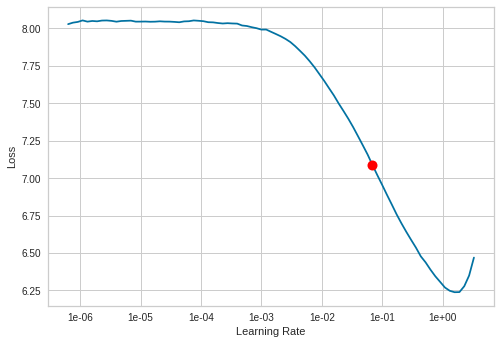

In [ ]:
learn.recorder.plot(suggestion=True)

The curve says we have to try multiple combination between 1e-03 to 1e-01 min


In [ ]:
%%time
learn.fit_one_cycle(1, 1.3e-1, moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,5.133215,3.879252,0.351233,00:01


CPU times: user 1.02 s, sys: 504 ms, total: 1.53 s
Wall time: 1.54 s



By default, the Learner object is frozen thus we need to train the embeddings at first. Here, instead of running the cycle for one epoch, we will  run it for 4 to see how accuracy varies. The learning rate is picked  with the help of the plot we got above.

In [ ]:
learn.unfreeze()

In [ ]:
%%time
learn.fit_one_cycle(5, 1e-2, moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,3.575911,3.583309,0.383503,00:01
1,3.394986,3.379483,0.412883,00:01
2,3.019526,3.362095,0.426020,00:01
3,2.538084,3.502287,0.430952,00:01
4,2.070207,3.685699,0.425043,00:01


CPU times: user 6.13 s, sys: 3.31 s, total: 9.44 s
Wall time: 9.47 s


We see that the accuracy improved slightly but still looming in the same range. This is because firstly the model was trained on a pre-trained model with different vocabulary & secondly, there were no labels, we had passed the data without specifying the labels.

No we will split the data set to test and train

In [ ]:
from sklearn.model_selection import train_test_split
train, val = train_test_split(finaldf,test_size=0.3)
print(train.shape,val.shape)

(3803, 3) (1631, 3)


In [ ]:
val.to_csv('val.csv',index=False)

In [ ]:
valdata=pd.read_csv('val.csv')

In [ ]:
valdata.shape

(1631, 3)

Now, we’ll create a new data object that only grabs the labeled data and keeps those labels.


In [ ]:
data_clas=(TextList.from_csv('/content/drive/My Drive/','finaldf.csv', cols='CleanTextAfterRemoveStopword',vocab=data_lm.vocab)
    .split_by_rand_pct(0.3)
    .label_from_df('Assignment group') 
    .add_test(TextList.from_csv('/content/drive/My Drive/','val.csv', vocab=data_lm.vocab))         
    .databunch(bs=48))

In [ ]:
data_clas.show_batch(ds_type=DatasetType.Test)

text,target
xxbos xxup xxunk,GRP_0
xxbos xxup xxunk,GRP_0
xxbos xxup xxunk,GRP_0
xxbos xxup xxunk,GRP_0
xxbos xxup xxunk,GRP_0


The classifier needs a little less dropout, so we pass drop_mult=0.5 to multiply all the dropouts by this amount. We don’t load the pre-trained model, but instead our fine-tuned encoder from the previous section

In [ ]:
  learn.save_encoder('ticket_class_enc')

In [ ]:
learn_clas = text_classifier_learner(data_clas, AWD_LSTM,drop_mult=0.5)
learn_clas.load_encoder('ticket_class_enc')


RNNLearner(data=TextClasDataBunch;

Train: LabelList (3804 items)
x: TextList
xxbos outlook receive hello team meeting skype meeting etc not appear calendar xxunk please advise correct kind,xxbos unable access hr tool page,xxbos unable log engineering tool skype,xxbos ticket no xxunk status new non employee enter user name,xxbos ticket update inplant
y: CategoryList
GRP_0,GRP_0,GRP_0,GRP_0,GRP_0
Path: /content/drive/My Drive;

Valid: LabelList (1630 items)
x: TextList
xxbos user unable tologin vpn connect user system use teamviewer help login company vpn link issue resolve,xxbos need configure email company iphone device,xxbos not able connect vpn,xxbos reset password xxunk xxunk use password management tool password reset,xxbos printer driver installation name xxunk xxunk language browser microsoft internet explorer customer number telephone summary hello issue print xxunk printer get error say no page select xxunk prompt download new driver
y: CategoryList
GRP_0,GRP_0,GRP_0,GRP_0,GRP

In [ ]:
## run lr finder
learn_clas.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Again we perform similar steps as Language mode.

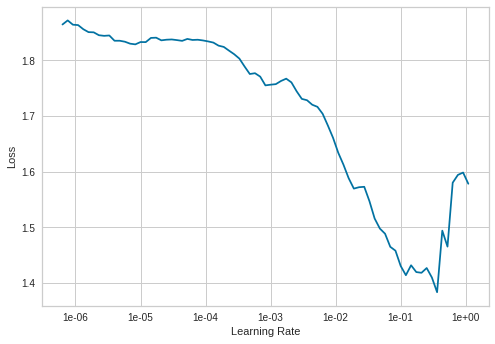

In [ ]:

## plot lr finder
learn_clas.recorder.plot()

In [ ]:
learn_clas.fit_one_cycle(1, 2e-2, moms=(0.8,0.7))  


epoch,train_loss,valid_loss,accuracy,time
0,0.639998,0.271598,0.907975,00:02


Here we see that the accuracy has drastically improved if we compare with the Language model in step 1 when we provide labels.
Now we will partially train the model by unfreezing one layer at a time & differential learning rate. Here I am using the slice attribute which will divide the specified learning rates among 3 groups of models.

In [ ]:
learn_clas.freeze_to(-2) # unfreeze last 2 layers
learn_clas.fit_one_cycle(1, slice(1e-2/(2.6**4),1e-2), moms=(0.8,0.7))


epoch,train_loss,valid_loss,accuracy,time
0,0.434595,0.271365,0.903681,00:02


We see that the accuracy is improving gradually which is expected as we are gradually unfreezing the layers. More layers providing more depth.

In [ ]:
learn_clas.freeze_to(-3) # unfreeze last 2 layers
learn_clas.fit_one_cycle(2, slice(5e-3/(2.6**4),5e-3), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,0.334827,0.228027,0.920859,00:03
1,0.247916,0.216593,0.915951,00:03


Finally, we will unfreeze the whole model & visualize the learning rate to choose & use that for final training.

In [ ]:
learn_clas.unfreeze() # unfreze all
learn_clas.fit_one_cycle(3, slice(1e-3/(2.6**4),1e-3), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,0.206599,0.218034,0.925153,00:03
1,0.177014,0.203282,0.923313,00:04
2,0.177177,0.203070,0.926994,00:03


#8.3 Make predictions

In [ ]:
col_one_list = val['CleanTextAfterRemoveStopword'].tolist()[0:10]

In [ ]:
col_one_list

['blank call come get disconnect private number unable call',
 'login issue issue verify user detail employee manager name check name ad fine advise check caller confirm able login issue resolve',
 'customer master receive hello help customer master india not get update lauacyltoe hxgaycze mail since morning',
 'job job fail job scheduler receive job',
 'system bankrd temperature alert monitor tool south amerirtca servers hostname hostname inlet temp alert hostname system ambient lpas attach screen shot window event viewer log',
 'attendance tool system log error receive hello good morning experience issue every time try single sign portal following screen get display stay appreciate support fix issue',
 'ticket update inc',
 'job job fail job scheduler receive job',
 'outlook not respond',
 'unable login erp']

In [ ]:
m=[]
for i in col_one_list: 
    m.append(learn_clas.predict(i))

In [ ]:
m

[(Category tensor(0),
  tensor(0),
  tensor([9.9948e-01, 8.3305e-05, 1.7981e-04, 3.8521e-05, 2.1425e-04])),
 (Category tensor(0),
  tensor(0),
  tensor([9.9871e-01, 1.0042e-04, 7.5111e-05, 5.7696e-04, 5.4084e-04])),
 (Category tensor(0),
  tensor(0),
  tensor([9.9218e-01, 4.1697e-03, 6.9555e-04, 3.9396e-04, 2.5652e-03])),
 (Category tensor(3),
  tensor(3),
  tensor([6.7595e-04, 1.9917e-03, 6.6138e-05, 5.8261e-01, 4.1465e-01])),
 (Category tensor(1),
  tensor(1),
  tensor([0.0094, 0.9763, 0.0033, 0.0029, 0.0081])),
 (Category tensor(0),
  tensor(0),
  tensor([9.9956e-01, 9.2335e-05, 2.4552e-05, 1.0923e-05, 3.1587e-04])),
 (Category tensor(0),
  tensor(0),
  tensor([9.9930e-01, 5.4124e-04, 1.1840e-04, 1.6559e-05, 2.2100e-05])),
 (Category tensor(3),
  tensor(3),
  tensor([6.7595e-04, 1.9917e-03, 6.6138e-05, 5.8261e-01, 4.1465e-01])),
 (Category tensor(0),
  tensor(0),
  tensor([9.9330e-01, 2.4657e-03, 9.7156e-04, 1.6936e-03, 1.5689e-03])),
 (Category tensor(0),
  tensor(0),
  tensor([9.8

In [ ]:
grp=val['Assignment group'].tolist()[0:10]

In [ ]:
df_pred_train = pd.DataFrame(m, 
               columns =['Ctagory_Tensor', 'tensor','Confidence']) 
df_pred_train['CleanTextAfterRemoveStopword']=col_one_list

df_pred_train.head(10)

,Ctagory_Tensor,tensor,Confidence,CleanTextAfterRemoveStopword
0,GRP_0,tensor(0),"[tensor(0.9995), tensor(8.3305e-05), tensor(0....",blank call come get disconnect private number ...
1,GRP_0,tensor(0),"[tensor(0.9987), tensor(0.0001), tensor(7.5111...",login issue issue verify user detail employee ...
2,GRP_0,tensor(0),"[tensor(0.9922), tensor(0.0042), tensor(0.0007...",customer master receive hello help customer ma...
3,GRP_8,tensor(3),"[tensor(0.0007), tensor(0.0020), tensor(6.6138...",job job fail job scheduler receive job
4,GRP_12,tensor(1),"[tensor(0.0094), tensor(0.9763), tensor(0.0033...",system bankrd temperature alert monitor tool s...
5,GRP_0,tensor(0),"[tensor(0.9996), tensor(9.2335e-05), tensor(2....",attendance tool system log error receive hello...
6,GRP_0,tensor(0),"[tensor(0.9993), tensor(0.0005), tensor(0.0001...",ticket update inc
7,GRP_8,tensor(3),"[tensor(0.0007), tensor(0.0020), tensor(6.6138...",job job fail job scheduler receive job
8,GRP_0,tensor(0),"[tensor(0.9933), tensor(0.0025), tensor(0.0010...",outlook not respond
9,GRP_0,tensor(0),"[tensor(0.9865), tensor(0.0090), tensor(0.0020...",unable login erp


In [ ]:
val['pred_grp'] = val['CleanTextAfterRemoveStopword'].apply(lambda row: str(learn_clas.predict(row)[0]))


In [ ]:
train['pred_grp'] = train['CleanTextAfterRemoveStopword'].apply(lambda row: str(learn_clas.predict(row)[0]))

#8.4. Calculate train accuracy

In [ ]:
print("Train Accuracy: ", accuracy_score(train['Assignment group'], train['pred_grp']))

Train Accuracy:  0.9503023928477518


In [ ]:
report = classification_report(val['Assignment group'], val['pred_grp'])
print(report)

              precision    recall  f1-score   support

       GRP_0       0.99      0.99      0.99      1206
      GRP_12       0.86      0.83      0.85        77
      GRP_24       0.95      0.93      0.94        92
       GRP_8       0.82      0.94      0.87       186
       GRP_9       0.80      0.47      0.59        70

    accuracy                           0.95      1631
   macro avg       0.88      0.83      0.85      1631
weighted avg       0.95      0.95      0.95      1631



#8.5. Loss plot 

In loss plot we can see the validation loss gets saturated after 0.25 approx

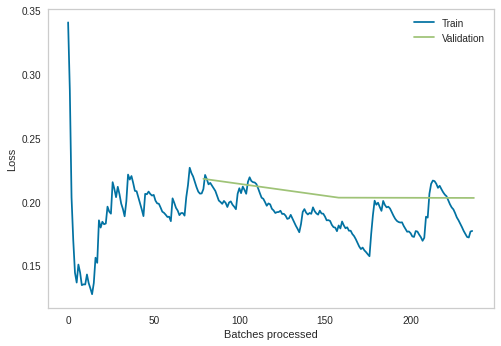

In [ ]:
learn_clas.recorder.plot_losses()

In [ ]:
print(learn_clas.predict("probleme mit com port maschine st hrmann eaodcgsw trmzwbyc"))
print(learn_clas.predict("skype error"))
print(learn_clas.predict("circuit outage india carrier company"))
print(learn_clas.predict("usa file server hostname fail hard drive"))



(Category tensor(2), tensor(2), tensor([2.0163e-05, 7.3122e-04, 9.9924e-01, 1.4744e-06, 2.5343e-06]))
(Category tensor(0), tensor(0), tensor([9.9210e-01, 1.8487e-03, 8.4568e-04, 2.0701e-03, 3.1383e-03]))
(Category tensor(3), tensor(3), tensor([5.6415e-02, 5.7283e-05, 5.4757e-04, 9.4295e-01, 3.0577e-05]))
(Category tensor(1), tensor(1), tensor([6.2335e-05, 9.9986e-01, 3.2511e-05, 4.2995e-05, 5.4010e-06]))


#8.6:Observations:

The performence of the model is very good if we see the losses if we compare this with full data set we can see that as there were 74 groups and there were many groups which have records less than 50 so data is highly imbalanced so full data set the model performence is poor but when we considered top 5 highest group we can see that the performence improved and classification report is also good for top 5 groups we got a test accuracy of 92 which is really good and the prediction is also very good.It is a good model to select

#Complete Data set

We have performed the same steps on the full data set to visualize the result.

#Load Data

In [ ]:
finaldata_all = '/content/drive/My Drive/final.pkl'

In [ ]:
finaldataset_all=pd.read_pickle(finaldata_all)

In [ ]:
finaldataset_all.shape

(8500, 3)

In [ ]:
finaldataset_all.head(5)

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


In [ ]:
finaldataset_all=finaldataset_all.drop(finaldataset_all[finaldataset_all['CleanTextAfterRemoveStopword'].map(len) == 0].index)

In [ ]:
finaldataset_all.shape

(8464, 3)

In [ ]:

finaldataset_all.to_csv("finaldataset_all.csv")

In [ ]:
data_lm = (TextList.from_csv('/content/drive/My Drive/','finaldataset_all.csv', cols='CleanTextAfterRemoveStopword')
    .split_by_rand_pct(0.3)
    .label_for_lm()           
    .databunch(bs=48))

In [ ]:
data_lm.show_batch()

idx,text
0,connect unable submit report xxbos hr tool site not load page correctly xxbos user want reset password xxbos unable open payslip xxbos ticket update inplant xxbos unable login company vpn receive hi website try open new session use link not able get pls help urgently work home tomorrow due month end close xxbos xxunk pc screen not come back xxbos erp sid account lock xxbos unable sign vpn xxbos unable
1,start production environment since around pm est october behavior mfg tool log non production well find error screenshot system mail chain root appear xxunk th sept xxunk xxunk date th xxunk new even aware change xxunk company crm sp mfg xxunk xxunk net get restart break next need chain send update system reach receive detail admin xxunk want open case microsoft receive maybe first confirmation work apply environment xxbos unable
2,rth xxunk rth rth send message xxbos access drive receive hello kindly request give drive xxunk xxbos kindly add user would xxunk erp business analytic team ticket tool tool xxbos job job fail job scheduler receive job xxbos hostname currently experience high cpu utilization please investigate xxbos mass upload programdnty change condition table crm crm xxbos server xxunk active directory locate xxunk xxunk since et xxbos block user say xxbos
3,wly dp fail job scheduler receive job xxbos switch apac company xxunk access sw locate apac since pm xxbos job bkbackup tool powder prod full fail job scheduler receive job xxbos job job fail job scheduler receive job xxbos job bkbackup tool sql prod full fail job scheduler receive job xxbos job job fail job scheduler receive job xxbos job job fail job scheduler receive job xxbos job job fail
4,message class bk xxbos erp sid account unlock password reset xxbos bex analyzer report not work open connect sid try xxunk xxunk xxunk product management master window select value variable appear no available variant data provider set finance click ok system sit nothing xxunk get microsoft excel respond error something wrong system setting need pull report external auditor rather urgent fix quickly xxbos not print usa printer prtqx longer please


In [ ]:
data_lm.save()

In [ ]:
%%time
learn = language_model_learner(data_lm, AWD_LSTM,drop_mult=0.3)

CPU times: user 271 ms, sys: 91.4 ms, total: 362 ms
Wall time: 365 ms


In [ ]:
%%time
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
CPU times: user 5.25 s, sys: 2.64 s, total: 7.89 s
Wall time: 8.21 s


Min numerical gradient: 1.00E-01
Min loss divided by 10: 1.10E-01


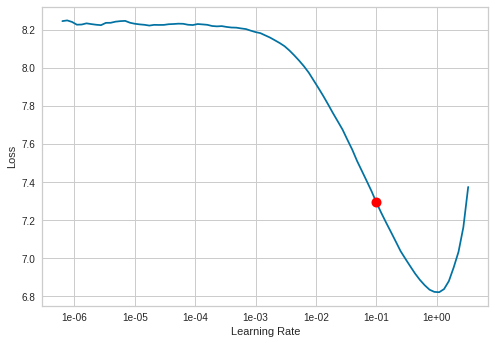

In [ ]:
learn.recorder.plot(suggestion=True)

In [ ]:
%%time
learn.fit_one_cycle(1, 1.3e-1, moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,5.270597,4.379612,0.310672,00:02


CPU times: user 1.92 s, sys: 992 ms, total: 2.91 s
Wall time: 2.92 s


In [ ]:
learn.unfreeze()

In [ ]:
%%time
learn.fit_one_cycle(5, 1e-2, moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,3.957576,4.107946,0.342560,00:03
1,3.713035,3.937190,0.358227,00:03
2,3.299778,3.896606,0.371088,00:03
3,2.678232,4.065544,0.379847,00:03
4,2.021005,4.307002,0.376786,00:03


CPU times: user 11.7 s, sys: 6.25 s, total: 17.9 s
Wall time: 18 s


In [ ]:
data_clas=(TextList.from_csv('/content/drive/My Drive/','finaldataset_all.csv', cols='CleanTextAfterRemoveStopword',vocab=data_lm.vocab)
    .split_by_rand_pct(0.3)
    .label_from_df('Assignment group')          
    .databunch(bs=48))

/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:541: UserWarning:

You are labelling your items with CategoryList.
Your valid set contained the following unknown labels, the corresponding items have been discarded.
GRP_72, GRP_67



In [ ]:
data_clas.show_batch()

text,target
xxbos security incident sw possible locky xxunk infection lpal source ip system name lpal user name xxunk xxunk nicolmghyu location xxunk south amerirtca xxunk vpn pc sep sms status see field sale user yes no no dsw event log content xxunk xxunk xxunk version xxunk host xxunk content reputation setting ap portal list xxunk xxunk signature power xxunk xxunk xxunk xxunk engine xxunk extend file attribute signature symantec permit application,GRP_62
xxbos security incident sw magento sql injection source ip system name xxunk reference company com user name n location dmz sep sms status field sale user yes no dsw event log see ctoc receive least occurrence vid possible mage adminhtml block widget xxunk attempt inbound cve alert isensor device isensplant company com traffic not block source port tcp dallas usa destine tcp usa occur indicate external host possibly source attempt,GRP_2
xxbos security incident possible malware infection traffic sinkhole domain android fa source ip system name android faecee user name unknown location unknown sep sms status field sale user yes no dsw event log incident overview see isensor company com device generate vid server response anubis cookie set probable infected asset alert not block port tcp tcp android faecee indicate host likely malware return indicate attempt visit sinkhole dns sinkholes server,GRP_2
xxbos security incident dsw traffic sinkhole domain lpawxsf source ip system name lpawxsf user name n location xxunk sep sms status n field sale user yes no no dsw event log see incident overview see isensor company com device generate vid server response anubis cookie set probable infected asset alert not block port tcp tcp lpawxsf indicate host likely malware return indicate attempt visit sinkhole dns sinkholes server give false,GRP_2
xxbos security incident sw xxunk possible vulnerability scanning see activity indicate host conduct scan scan use identify specific vulnerability remote could exploit xxunk xxunk service availability execute code usa attacker unauthorized access result scan future attack exploitation target host base internet xxunk xxunk non target xxunk similar source detect across client base please consider block ip address investigate malicious xxunk escalate incident via medium priority ticket per default event handling,GRP_2


In [ ]:
  learn.save_encoder('ticket_class_enc')

In [ ]:
learn_clas = text_classifier_learner(data_clas, AWD_LSTM,drop_mult=0.5)
learn_clas.load_encoder('ticket_class_enc')


RNNLearner(data=TextClasDataBunch;

Train: LabelList (5925 items)
x: TextList
xxbos login issue verify user detail employee manager name check name ad reset password advise check caller confirm able login issue resolve,xxbos not log vpn receive hi not vpn best,xxbos unable log engineering tool skype,xxbos ticket no employment status new non employee enter user name,xxbos ticket update inplant
y: CategoryList
GRP_0,GRP_0,GRP_0,GRP_0,GRP_0
Path: /content/drive/My Drive;

Valid: LabelList (2536 items)
x: TextList
xxbos write read access folder xxunk line set hello please authorization user xxunk xxunk xxunk thank,xxbos email back problem outlook receive hi not get old mail outlook kindly needful restore help store separate location,xxbos recall ticket no please reopen receive xxunk xxunk would like recall message ticket no reopen,xxbos company connect,xxbos lean certificate not get send automatically hi xxunk today create another event still recipient see certificate list section also co 

In [ ]:
## run lr finder
learn_clas.lr_find()

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


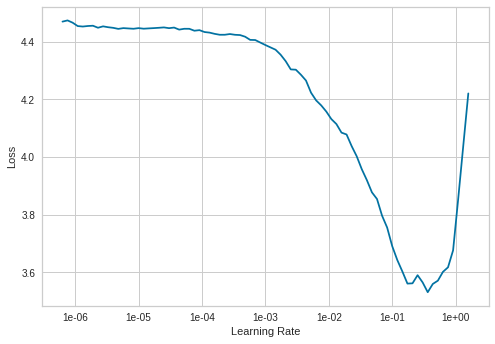

In [ ]:

## plot lr finder
learn_clas.recorder.plot()

In [ ]:
learn_clas.fit_one_cycle(1, 2e-2, moms=(0.8,0.7))  


epoch,train_loss,valid_loss,accuracy,time
0,1.996822,1.602662,0.613170,00:03


In [ ]:
learn_clas.freeze_to(-2) # unfreeze last 2 layers
learn_clas.fit_one_cycle(1, slice(1e-2/(2.6**4),1e-2), moms=(0.8,0.7))


epoch,train_loss,valid_loss,accuracy,time
0,1.649309,1.451744,0.634069,00:04


In [ ]:
learn_clas.freeze_to(-3) # unfreeze last 2 layers
learn_clas.fit_one_cycle(2, slice(5e-3/(2.6**4),5e-3), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,1.521380,1.409226,0.645505,00:06
1,1.266119,1.349650,0.662066,00:06


In [ ]:
learn_clas.unfreeze() # unfreze all
learn_clas.fit_one_cycle(3, slice(1e-3/(2.6**4),1e-3), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,1.154809,1.334998,0.672319,00:07
1,1.054282,1.332249,0.671530,00:07
2,1.017678,1.340295,0.670741,00:08


In [ ]:
col_one_list = finaldataset_all['CleanTextAfterRemoveStopword'].tolist()[0:5]

In [ ]:
col_one_list

['login issue verify user detail employee manager name check name ad reset password advise check caller confirm able login issue resolve',
 'outlook receive hello team meeting skype meeting etc not appear calendar somebody please advise correct kind',
 'not log vpn receive hi not vpn best',
 'unable access hr tool page',
 'unable log engineering tool skype']

In [ ]:
m=[]
for i in col_one_list: 
    o,l,r=learn_clas.predict(i)
    m.append(l)
print (m)

[tensor(0), tensor(0), tensor(0), tensor(0), tensor(0)]


In [ ]:
finaldataset_all['Assignment group'][0:5]

0    GRP_0
1    GRP_0
2    GRP_0
3    GRP_0
4    GRP_0
Name: Assignment group, dtype: object

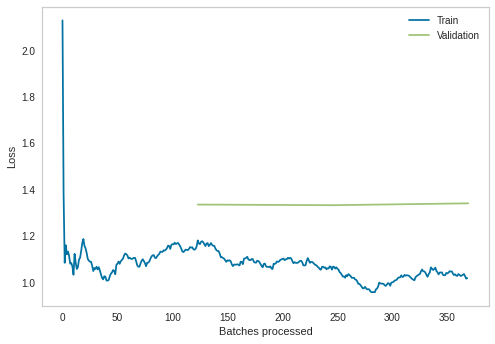

In [ ]:
learn_clas.recorder.plot_losses()

##8.7.Conclusion:

Here we can see that the model worked not very well on complete data set due to imbalance and losses are very high and the test accuracy is 67% but if we compare with other models for complete data set we can say this model performence is good.


#9.Conclusion


For this problem statement we first completed text preprocessing and perform all the activities explained in the notebook with complete data set and what we observed that the results and predictions are not good as there is a hudge data imbalance if we see classification report of complete data set for the top models we can see for some groups the F1 csore came as 0 and there is a hudge imbalance and also 5000+ data with top 5 group where as we have 8500 total data and 74 total groups which cleary indicates data is notbalanced.



Next we ran same steps for top 5 models and we saw hudge change in model scores Train reaches to 96 where as test too reaches 93 which is really good and proves the imbalance issue.


We have selected model 009 , ULM fit and Fast text and BERT for top 5 models as the performence are really good.

Further we have deployed the model009 through flask to webpage